# Anime Score Prediction from Textual and Categorical Features

**Author**: Tyler Burguillos, Austin Nolte, Alan Lei, Nishan Maharjan
**Course**: CSC 180 - Intelligent Systems (Fall 2024)  
**Assignment**: Final Project - Anime Score Prediction  
**Due Date**:

### Problem Statement

The objective of this project is to predict anime scores using a combination of textual and categorical features. The dataset includes features such as genre, producer, licensor, and textual descriptions. We will utilize feature engineering techniques, including multi-label binarization for multi-valued categorical features and GloVe embeddings for textual descriptions, to preprocess the data. Various machine learning models, including Linear Regression, Fully-Connected Neural Networks (FCNN), and ensemble methods, will be trained and evaluated. Hyperparameter tuning and performance evaluation will be conducted to optimize model accuracy, using metrics such as Root Mean Square Error (RMSE) and Mean Absolute Percentage Error (MAPE).

---


## Data Preprocessing Steps

**Load Libraries and Mount Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler, MultiLabelBinarizer
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import datetime

# Tyler Burguillos 11/11/2024

Mounted at /content/drive


**Load Dataset and Preview Data**

In [ ]:
file_path = '/content/drive/My Drive/FinalProject/anime-dataset-2023.csv'
df = pd.read_csv(file_path)

print("Initial Data Preview:")
print(df.head())

print("\nTarget Variable (Score) - Statistics:")
print(df['Score'].describe())

# Tyler Burguillos 11/11/2024

Initial Data Preview:
   anime_id                             Name             English name  \
0         1                     Cowboy Bebop             Cowboy Bebop   
1         5  Cowboy Bebop: Tengoku no Tobira  Cowboy Bebop: The Movie   
2         6                           Trigun                   Trigun   
3         7               Witch Hunter Robin       Witch Hunter Robin   
4         8                   Bouken Ou Beet   Beet the Vandel Buster   

                         Other name Score  \
0                         カウボーイビバップ  8.75   
1                    カウボーイビバップ 天国の扉  8.38   
2                             トライガン  8.22   
3  Witch Hunter ROBIN (ウイッチハンターロビン)  7.25   
4                            冒険王ビィト  6.94   

                                 Genres  \
0         Action, Award Winning, Sci-Fi   
1                        Action, Sci-Fi   
2             Action, Adventure, Sci-Fi   
3  Action, Drama, Mystery, Supernatural   
4      Adventure, Fantasy, Supernatural   

         

### Feature Handling

In [ ]:
import pandas as pd

# Check for rows with missing 'Score' values
df['Score'] = pd.to_numeric(df['Score'], errors='coerce')
missing_scores_df = df[df['Score'].isnull()]
df = df.dropna(subset=['Score'])

# Export the records with missing 'Score' values to a CSV file
missing_scores_csv_path = '/content/drive/My Drive/FinalProject/missing_scores.csv'
missing_scores_df.to_csv(missing_scores_csv_path, index=False)

print(f"Exported {len(missing_scores_df)} records with missing scores to {missing_scores_csv_path}")
# Tyler Burguillos 11/11/2024

Exported 9213 records with missing scores to /content/drive/My Drive/FinalProject/missing_scores.csv


**Drop Unnecessary Columns and 'English Name' from Input but Retain it for Final Output**

In [ ]:
df.drop(columns=['anime_id', 'English name', 'Other name', 'Image URL'], inplace=True)

# Tyler Burguillos 11/11/2024

**Convert 'Episodes' to Numeric and Normalize**

In [ ]:
 # Convert 'Episodes' to numeric and drop records containing '-'
df['Episodes'] = pd.to_numeric(df['Episodes'], errors='coerce')
#df['Episodes'] = df['Episodes'].fillna(df['Episodes'].mean())
df = df.dropna(subset=['Episodes'])

scaler = MinMaxScaler()
df['Episodes'] = scaler.fit_transform(df[['Episodes']])

print("After converting and normalizing 'Episodes':")
print(df['Episodes'].head())

# Tyler Burguillos 11/11/2024

After converting and normalizing 'Episodes':
0    0.008181
1    0.000000
2    0.008181
3    0.008181
4    0.016688
Name: Episodes, dtype: float64


**One-Hot Encode 'Status'**

In [ ]:
df = pd.get_dummies(df, columns=['Status'], drop_first=True)
print("After One-Hot Encoding 'Status':")
print(df.head())

# Tyler Burguillos 11/11/2024

After One-Hot Encoding 'Status':
                              Name  Score  \
0                     Cowboy Bebop   8.75   
1  Cowboy Bebop: Tengoku no Tobira   8.38   
2                           Trigun   8.22   
3               Witch Hunter Robin   7.25   
4                   Bouken Ou Beet   6.94   

                                 Genres  \
0         Action, Award Winning, Sci-Fi   
1                        Action, Sci-Fi   
2             Action, Adventure, Sci-Fi   
3  Action, Drama, Mystery, Supernatural   
4      Adventure, Fantasy, Supernatural   

                                            Synopsis   Type  Episodes  \
0  Crime is timeless. By the year 2071, humanity ...     TV  0.008181   
1  Another day, another bounty—such is the life o...  Movie  0.000000   
2  Vash the Stampede is the man with a $$60,000,0...     TV  0.008181   
3  Robin Sena is a powerful craft user drafted in...     TV  0.008181   
4  It is the dark century and the people are suff...     TV  0.016688   

**Handling 'Aired' (Convert Dates and Normalize)**

In [ ]:
import datetime
from sklearn.preprocessing import MinMaxScaler

df['Start airing'] = pd.to_datetime(df['Aired'].str.split('to').str[0], errors='coerce').dt.year
df['End airing'] = pd.to_datetime(df['Aired'].str.split('to').str[1], errors='coerce').dt.year

current_year = datetime.datetime.now().year
#df['End airing'] = df['End airing'].fillna(current_year)
df = df.dropna(subset=['Start airing'])

earliest_year = df['Start airing'].min()
#df['Start airing'] = df['Start airing'].fillna(earliest_year)
df = df.dropna(subset=['End airing'])

scaler = MinMaxScaler()
df[['Start airing', 'End airing']] = scaler.fit_transform(df[['Start airing', 'End airing']])
df.drop(columns=['Aired'], inplace=True)

print("After processing and normalizing 'Aired' dates:")
print(df[['Start airing', 'End airing']].head())

# Tyler Burguillos 11/11/2024

After processing and normalizing 'Aired' dates:
   Start airing  End airing
0      0.596774    0.606557
2      0.596774    0.590164
3      0.661290    0.655738
4      0.693548    0.704918
5      0.709677    0.754098


**One-hot Encode 'Premiered'**

In [ ]:
df = pd.get_dummies(df, columns=['Premiered'], drop_first=True)
print("After One-Hot Encoding 'Premiered':")
print(df.head())

# Tyler Burguillos 11/11/2024

After One-Hot Encoding 'Premiered':
                 Name  Score                                Genres  \
0        Cowboy Bebop   8.75         Action, Award Winning, Sci-Fi   
2              Trigun   8.22             Action, Adventure, Sci-Fi   
3  Witch Hunter Robin   7.25  Action, Drama, Mystery, Supernatural   
4      Bouken Ou Beet   6.94      Adventure, Fantasy, Supernatural   
5        Eyeshield 21   7.92                                Sports   

                                            Synopsis Type  Episodes  \
0  Crime is timeless. By the year 2071, humanity ...   TV  0.008181   
2  Vash the Stampede is the man with a $$60,000,0...   TV  0.008181   
3  Robin Sena is a powerful craft user drafted in...   TV  0.008181   
4  It is the dark century and the people are suff...   TV  0.016688   
5  Shy, reserved, and small-statured, Deimon High...   TV  0.047120   

                                           Producers  \
0                                      Bandai Visual   
2   

**Multi-Label Binarization of 'Producers', 'Licensors', 'Studios', and 'Genres'**

Multi-label binarization allows us to handle features where there can be multiple labels within a single feature, such as `Producers`, `Licensors`, `Studios`, and `Genres`.

If we use regular one-hot encoding, each combination of labels would be treated as a unique category. This does not work for columns like these because an anime often has multiple genres and might be produced by several studios or involve multiple licensors. Multi-label binarization helps solve this problem by allowing us to represent each label as independently present or absent, rather than forcing a single label per category.

**One-Hot Encoding Example**

Suppose we have the following anime entries:

1. Anime A: Genres = "Action, Adventure"
2. Anime B: Genres = "Action, Fantasy"
3. Anime C: Genres = "Adventure, Fantasy"
4. Anime D: Genres = "Action"

With one-hot encoding, each unique combination of genres would be treated as a distinct category:

|Anime|Action_Adventure|Action_Fantasy|Adventure_Fantasy|Action|
|-|-|-|-|-|
|A|1|0|0|0|
|B|0|1|0|0|
|C|0|0|1|0|
|D|0|0|0|1|

This structure has several issues:

1. It creates a large number of columns if there are many genre combinations.
2. It doesn’t represent the individual genres independently (e.g., there’s no separate column for "Fantasy" or "Adventure").

**Multi-Label Binarization Example**

Using multi-label binarization, we create a column for each possible genre, and each column independently indicates whether that genre is present in each anime entry.

|Anime|Action|Adventure|Fantasy|
|-|-|-|-|
|A|1|1|0|
|B|1|0|1|
|C|0|1|1|
|D|1|0|0|

In this case:

- Anime A has "Action" and "Adventure," so both columns are marked with 1.
- Anime B has "Action" and "Fantasy," so those columns are marked with 1.
- Anime C has "Adventure" and "Fantasy."
- Anime D only has "Action."

This approach is much more efficient and scalable for features like `Genres`, `Producers`, `Studios`, etc., where multiple values can coexist within a single feature. It also provides a clear and interpretable structure for machine learning algorithms, as each genre, producer, or studio is independently represented, making it easier for models to understand the influence of individual labels.


In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer

def multi_label_binarize(column, suffix):
    mlb = MultiLabelBinarizer()
    binarized_data = pd.DataFrame(mlb.fit_transform(df[column].str.split(',')),
                                  columns=[f"{col}_{suffix}" for col in mlb.classes_],
                                  index=df.index)
    return binarized_data

df = df.join(multi_label_binarize('Producers', 'Producers')).drop(columns=['Producers'])
df = df.join(multi_label_binarize('Licensors', 'Licensors')).drop(columns=['Licensors'])
df = df.join(multi_label_binarize('Studios', 'Studios')).drop(columns=['Studios'])
df = df.join(multi_label_binarize('Genres', 'Genres')).drop(columns=['Genres'])

print("After Multi-Label Binarization for Producers, Licensors, Studios, and Genres:")
print(df.head())

# Tyler Burguillos 11/11/2024

After Multi-Label Binarization for Producers, Licensors, Studios, and Genres:
                 Name  Score  \
0        Cowboy Bebop   8.75   
2              Trigun   8.22   
3  Witch Hunter Robin   7.25   
4      Bouken Ou Beet   6.94   
5        Eyeshield 21   7.92   

                                            Synopsis Type  Episodes    Source  \
0  Crime is timeless. By the year 2071, humanity ...   TV  0.008181  Original   
2  Vash the Stampede is the man with a $$60,000,0...   TV  0.008181     Manga   
3  Robin Sena is a powerful craft user drafted in...   TV  0.008181  Original   
4  It is the dark century and the people are suff...   TV  0.016688     Manga   
5  Shy, reserved, and small-statured, Deimon High...   TV  0.047120     Manga   

        Duration                          Rating    Rank  Popularity  ...  \
0  24 min per ep  R - 17+ (violence & profanity)    41.0          43  ...   
2  24 min per ep       PG-13 - Teens 13 or older   328.0         246  ...   
3  25 min p

**One-Hot Encoding 'Source'**

In [ ]:
df['Source'] = df['Source'].fillna(df['Source'].mode()[0])
df = pd.get_dummies(df, columns=['Source'], drop_first=True)
print("After handling and one-hot encoding 'Source':")
print(df.head())

# Tyler Burguillos 11/11/2024

After handling and one-hot encoding 'Source':
                 Name  Score  \
0        Cowboy Bebop   8.75   
2              Trigun   8.22   
3  Witch Hunter Robin   7.25   
4      Bouken Ou Beet   6.94   
5        Eyeshield 21   7.92   

                                            Synopsis Type  Episodes  \
0  Crime is timeless. By the year 2071, humanity ...   TV  0.008181   
2  Vash the Stampede is the man with a $$60,000,0...   TV  0.008181   
3  Robin Sena is a powerful craft user drafted in...   TV  0.008181   
4  It is the dark century and the people are suff...   TV  0.016688   
5  Shy, reserved, and small-statured, Deimon High...   TV  0.047120   

        Duration                          Rating    Rank  Popularity  \
0  24 min per ep  R - 17+ (violence & profanity)    41.0          43   
2  24 min per ep       PG-13 - Teens 13 or older   328.0         246   
3  25 min per ep       PG-13 - Teens 13 or older  2764.0        1795   
4  23 min per ep                   PG - Childr

**One-Hot Encoding 'Type'**

In [ ]:
df = pd.get_dummies(df, columns=['Type'], drop_first=True)
print("After One-Hot Encoding 'Type':")
print(df.head())

# Tyler Burguillos 11/11/2024

After One-Hot Encoding 'Type':
                 Name  Score  \
0        Cowboy Bebop   8.75   
2              Trigun   8.22   
3  Witch Hunter Robin   7.25   
4      Bouken Ou Beet   6.94   
5        Eyeshield 21   7.92   

                                            Synopsis  Episodes       Duration  \
0  Crime is timeless. By the year 2071, humanity ...  0.008181  24 min per ep   
2  Vash the Stampede is the man with a $$60,000,0...  0.008181  24 min per ep   
3  Robin Sena is a powerful craft user drafted in...  0.008181  25 min per ep   
4  It is the dark century and the people are suff...  0.016688  23 min per ep   
5  Shy, reserved, and small-statured, Deimon High...  0.047120  23 min per ep   

                           Rating    Rank  Popularity  Favorites Scored By  \
0  R - 17+ (violence & profanity)    41.0          43      78525  914193.0   
2       PG-13 - Teens 13 or older   328.0         246      15035  356739.0   
3       PG-13 - Teens 13 or older  2764.0        1795  

**One-Hot Encoding 'Rating'**

In [ ]:
df.dropna(subset=['Rating'], inplace=True)
df = pd.get_dummies(df, columns=['Rating'], drop_first=True)
print("After One-Hot Encoding 'Rating':")
print(df.head())

# Tyler Burguillos 11/11/2024

After One-Hot Encoding 'Rating':
                 Name  Score  \
0        Cowboy Bebop   8.75   
2              Trigun   8.22   
3  Witch Hunter Robin   7.25   
4      Bouken Ou Beet   6.94   
5        Eyeshield 21   7.92   

                                            Synopsis  Episodes       Duration  \
0  Crime is timeless. By the year 2071, humanity ...  0.008181  24 min per ep   
2  Vash the Stampede is the man with a $$60,000,0...  0.008181  24 min per ep   
3  Robin Sena is a powerful craft user drafted in...  0.008181  25 min per ep   
4  It is the dark century and the people are suff...  0.016688  23 min per ep   
5  Shy, reserved, and small-statured, Deimon High...  0.047120  23 min per ep   

     Rank  Popularity  Favorites Scored By  Members  ...  Type_ONA  Type_OVA  \
0    41.0          43      78525  914193.0  1771505  ...     False     False   
2   328.0         246      15035  356739.0   727252  ...     False     False   
3  2764.0        1795        613   42829.0   11

**Normalizing 'Scored by', 'Members', and 'Favorites'**

In [ ]:
df[['Rank','Scored By', 'Members', 'Favorites']] = df[['Rank','Scored By', 'Members', 'Favorites']].apply(pd.to_numeric, errors='coerce')
#df[['Rank','Scored By', 'Members', 'Favorites']] = df[['Rank','Scored By', 'Members', 'Favorites']].fillna(0)
df = df.dropna(subset=['Rank','Scored By', 'Members', 'Favorites'])
scaler = MinMaxScaler()
df[['Rank','Scored By', 'Members', 'Favorites']] = scaler.fit_transform(df[['Rank','Scored By', 'Members', 'Favorites']])

print("After Normalizing 'Rank','Scored By', 'Members', and 'Favorites':")
print(df[['Rank','Scored By', 'Members', 'Favorites']].head())

# Tyler Burguillos 11/11/2024

After Normalizing 'Rank','Scored By', 'Members', and 'Favorites':
       Rank  Scored By   Members  Favorites
0  0.003151   0.343540  0.473053   0.360859
2  0.025758   0.134033  0.194160   0.069093
3  0.217645   0.016058  0.029824   0.002817
4  0.333911   0.002371  0.003936   0.000064
5  0.054116   0.032479  0.047386   0.009177


<ipython-input-13-afeb14f9d2be>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[['Rank','Scored By', 'Members', 'Favorites']] = scaler.fit_transform(df[['Rank','Scored By', 'Members', 'Favorites']])


In [ ]:

titles = df['Name']
df.drop(columns=['Name'], inplace=True)
print("After dropping unnecessary columns and 'Name':")
print(df.head())
# Tyler Burguillos 11/11/2024

After dropping unnecessary columns and 'Name':
   Score                                           Synopsis  Episodes  \
0   8.75  Crime is timeless. By the year 2071, humanity ...  0.008181   
2   8.22  Vash the Stampede is the man with a $$60,000,0...  0.008181   
3   7.25  Robin Sena is a powerful craft user drafted in...  0.008181   
4   6.94  It is the dark century and the people are suff...  0.016688   
5   7.92  Shy, reserved, and small-statured, Deimon High...  0.047120   

        Duration      Rank  Popularity  Favorites  Scored By   Members  \
0  24 min per ep  0.003151          43   0.360859   0.343540  0.473053   
2  24 min per ep  0.025758         246   0.069093   0.134033  0.194160   
3  25 min per ep  0.217645        1795   0.002817   0.016058  0.029824   
4  23 min per ep  0.333911        5126   0.000064   0.002371  0.003936   
5  23 min per ep  0.054116        1252   0.009177   0.032479  0.047386   

   Status_Finished Airing  ...  Type_ONA  Type_OVA  Type_Special  Typ

**Tokenization and GloVe Embedding 'Synopsis'**

What is GloVe?

- GloVe (Global Vectors for Word Representation) is a way to turn words into numbers that capture their meanings. It places words in a "vector space" where similar words, like "king" and "queen," are close together. This helps the model understand the context and relationships between words.

Why Use GloVe Instead of TF-IDF?

- TF-IDF is another method that looks at how often words appear, but it doesn’t capture word meanings or relationships. For example, it sees "king" and "queen" as completely different, missing the similarity.

Why Did We Choose GloVe?

- For our anime `Synopsis` field, GloVe helps the model understand the tone and theme by capturing word meanings. This makes it more effective at identifying similar descriptions, even if they use different words, leading to better predictions.


In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Initialize tokenizer and fit on descriptions
tokenizer = Tokenizer()
tokenizer.fit_on_texts(df['Synopsis'])
sequences = tokenizer.texts_to_sequences(df['Synopsis'])
padded_sequences = pad_sequences(sequences, maxlen=100)

# Load GloVe embeddings
glove_file_path = '/content/drive/My Drive/FinalProject/glove.6B.100d.txt'
glove_embeddings = {}
with open(glove_file_path, 'r', encoding='utf-8') as file:
    for line in file:
        values = line.split()
        word = values[0]
        vector = np.asarray(values[1:], dtype='float32')
        glove_embeddings[word] = vector

# Prepare embedding matrix
embedding_dim = 100
vocab_size = len(tokenizer.word_index) + 1
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in tokenizer.word_index.items():
    embedding_vector = glove_embeddings.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

print("Embedding Matrix Shape:", embedding_matrix.shape)

# Tyler Burguillos 11/11/2024

Embedding Matrix Shape: (39120, 100)


**Final Check and Verification of Data Preprocessing**

In [ ]:
df.drop(columns=['Broadcast time', 'Duration'], inplace=True, errors='ignore')

# Re-check for any remaining 'object' columns
remaining_object_columns = df.select_dtypes(include=['object']).columns
if not remaining_object_columns.empty:
    print("Warning: Remaining object columns detected:", remaining_object_columns.tolist())
else:
    print("All non-numeric columns have been handled successfully.")

# Check sparsity by calculating the percentage of rows where each column is True
sparsity_threshold = 0.03
sparse_columns = []

for col in df.columns:
    if df[col].dtype == 'bool' or len(df[col].unique()) == 2:
        true_percentage = df[col].mean()
        if true_percentage < sparsity_threshold:
            sparse_columns.append(col)

# Drop excessively sparse columns
if sparse_columns:
    print(f"Dropping {len(sparse_columns)} sparse columns.")
    df.drop(columns=sparse_columns, inplace=True)
else:
    print("No excessively sparse columns found.")

print("Data Types in Main DataFrame:\n", df.dtypes)
print("\nSample DataFrame (after all preprocessing):")
print(df.head())

print("\nChecking if all numerical columns are float32:")
for col in df.select_dtypes(include=['float64', 'int64']).columns:
    df[col] = df[col].astype('float32')
    print(f"{col} converted to {df[col].dtype}")

print("\nChecking One-Hot Encoded Columns:")
for column in ['Type', 'Status', 'Starting season', 'Studios']:
    one_hot_cols = [col for col in df.columns if col.startswith(column)]
    print(f"One-hot encoded columns for {column}: {', '.join(one_hot_cols) if one_hot_cols else 'None found'}")

print("\nEmbedding Matrix Shape (should be [vocab_size, embedding_dim]):", embedding_matrix.shape)

print("\nMin-Max Scaled Columns Sample:")
print(df[['Members', 'Scored By', 'Favorites']].head())

print("\nStandard Scaled Columns Sample:")
df['Score'] = pd.to_numeric(df['Score'], errors='coerce')
print(df[['Score', 'Episodes']].head())

X = np.concatenate([padded_sequences, df.drop(columns=['Synopsis', 'Score']).values], axis=1).astype('float32')
y = df['Score'].values.astype('float32')

print("\nShape of Final Input Data (X):", X.shape)
print("Shape of Labels (y):", y.shape)

# Tyler Burguillos 11/11/2024

Dropping 2562 sparse columns.
Data Types in Main DataFrame:
 Score                                    float64
Synopsis                                  object
Episodes                                 float64
Rank                                     float64
Popularity                                 int64
                                          ...   
Type_TV                                     bool
Rating_PG - Children                        bool
Rating_PG-13 - Teens 13 or older            bool
Rating_R - 17+ (violence & profanity)       bool
Rating_R+ - Mild Nudity                     bool
Length: 291, dtype: object

Sample DataFrame (after all preprocessing):
   Score                                           Synopsis  Episodes  \
0   8.75  Crime is timeless. By the year 2071, humanity ...  0.008181   
2   8.22  Vash the Stampede is the man with a $$60,000,0...  0.008181   
3   7.25  Robin Sena is a powerful craft user drafted in...  0.008181   
4   6.94  It is the dark century and

**Train-Test Split**

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True)

# Reshaping for Conv1D
X_train_cnn = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test_cnn = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

print("Train and Test data shapes for FNN:")
print("X_train:", X_train.shape, "y_train:", y_train.shape)
print("X_test:", X_test.shape, "y_test:", y_test.shape)

print("\nTrain and Test data shapes for CNN:")
print("X_train_cnn:", X_train_cnn.shape)
print("X_test_cnn:", X_test_cnn.shape)

# Tyler Burguillos 11/11/2024

Train and Test data shapes for FNN:
X_train: (5358, 389) y_train: (5358,)
X_test: (1340, 389) y_test: (1340,)

Train and Test data shapes for CNN:
X_train_cnn: (5358, 389, 1)
X_test_cnn: (1340, 389, 1)


## Baseline Linear Regression Model

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np

model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print("Baseline Model Mean Squared Error (MSE):", mse)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Tyler Burguillos 11/11/2024

Baseline Model Mean Squared Error (MSE): 0.029028866
Root Mean Squared Error (RMSE): 0.17037859559059143


Linear Regression Model - RMSE: 0.1704, R²: 0.9588, MAPE: 1.7431%


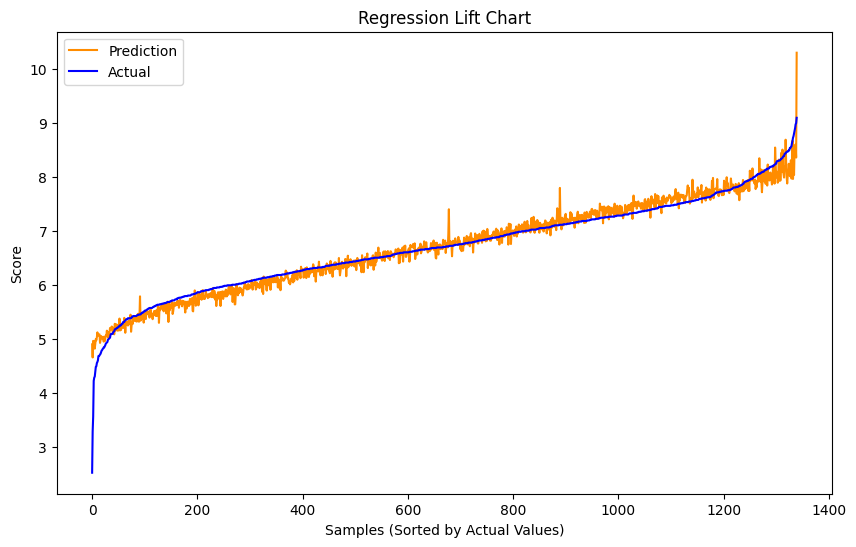

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"Linear Regression Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)

# Tyler Burguillos 11/11/2024

## FCNN Models

### Baseline FCNN

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization()) # Keep Batch Normalization Layer Here! The model just shows straight line otherwise.

# First hidden layer
model.add(Dense(300, activation='relu'))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("fnn_baseline_model.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=1
)

# Tyler Burguillos 11/11/2024

Epoch 1/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 22.2821 - root_mean_squared_error: 4.5330
Epoch 1: val_loss improved from inf to 0.67856, saving model to fnn_baseline_model.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 22.2023 - root_mean_squared_error: 4.5237 - val_loss: 0.6786 - val_root_mean_squared_error: 0.8237
Epoch 2/1000
164/168 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2646 - root_mean_squared_error: 0.5137
Epoch 2: val_loss improved from 0.67856 to 0.22002, saving model to fnn_baseline_model.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.2636 - root_mean_squared_error: 0.5128 - val_loss: 0.2200 - val_root_mean_squared_error: 0.4691
Epoch 3/1000
163/168 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1624 - root_mean_squared_error: 0.4028
Epoch 3: val_loss improved from 0.22002 to 0.15090, saving model to fnn_baseline_model.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.1621 - root_mean_squared_error: 0.4025 - val_loss: 0.1509 - val_r

Test RMSE: 0.23561206459999084


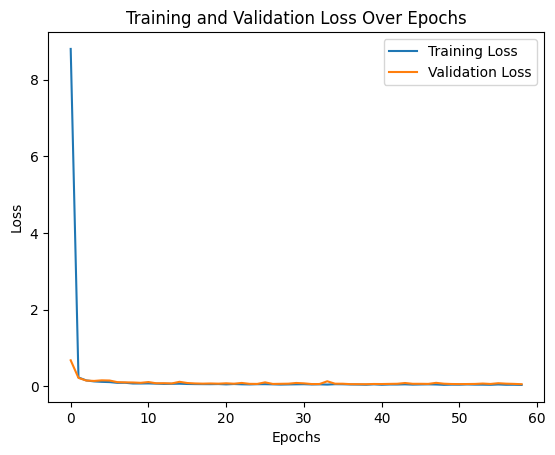

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

# Tyler Burguillos 11/11/2024

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
FCNN Model - RMSE: 0.2356, R²: 0.9212, MAPE: 2.3647%


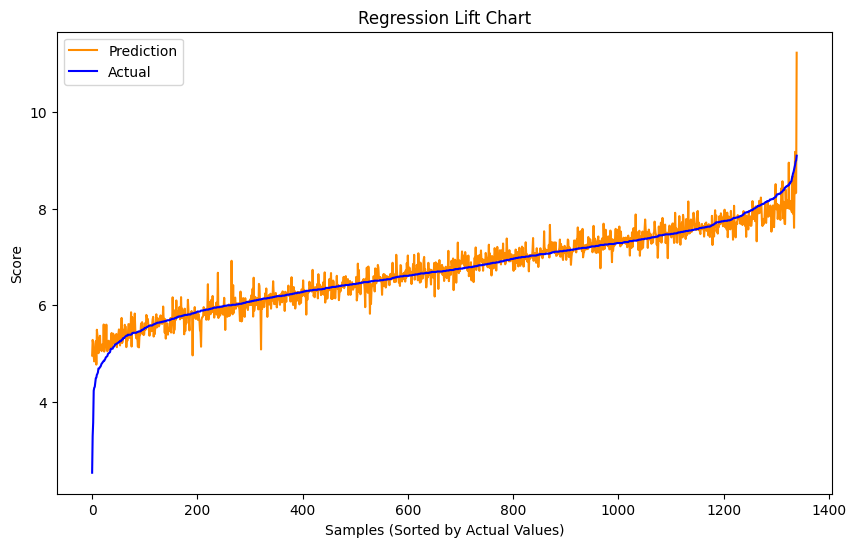

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)

# Tyler Burguillos 11/11/2024

### FCNN Model Design and Testing (Tyler Burguillos)

#### Model 1

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(300, activation='relu'))
model.add(BatchNormalization())

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_fnn_model_1.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)

# Tyler Burguillos 11/13/2024

Epoch 1/1000
164/168 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 39.6754 - root_mean_squared_error: 6.2889
Epoch 1: val_loss improved from inf to 14.98954, saving model to Tyler_fnn_model_1.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 39.4315 - root_mean_squared_error: 6.2687 - val_loss: 14.9895 - val_root_mean_squared_error: 3.8716
Epoch 2/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 7.1559 - root_mean_squared_error: 2.6354
Epoch 2: val_loss improved from 14.98954 to 1.67534, saving model to Tyler_fnn_model_1.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 7.1379 - root_mean_squared_error: 2.6318 - val_loss: 1.6753 - val_root_mean_squared_error: 1.2943
Epoch 3/1000
164/168 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.0760 - root_mean_squared_error: 1.0368
Epoch 3: val_loss improved from 1.67534 to 0.94568, saving model to Tyler_fnn_model_1.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.0730 - root_mean_squared_error: 1.0353 - val_loss: 0.9457 - val

Test RMSE: 0.20951852202415466


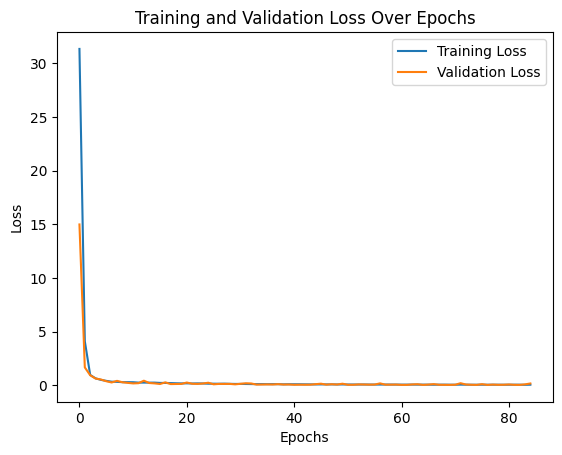

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

# Tyler Burguillos 11/13/2024

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
FCNN Model - RMSE: 0.2095, R²: 0.9377, MAPE: 2.2564%


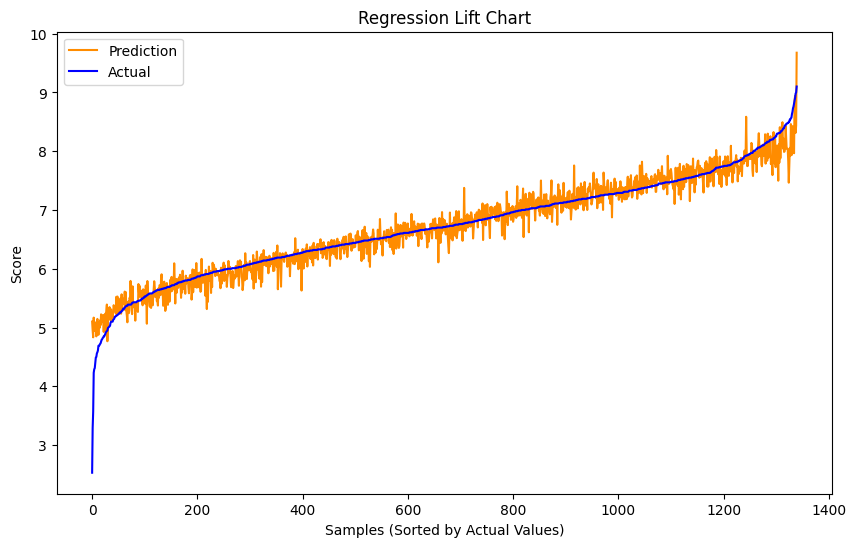

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)

# Tyler Burguillos 11/13/2024

#### Model 2

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(300, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_fnn_model_2.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)

# Tyler Burguillos 11/13/2024

Epoch 1/1000

Epoch 1: val_loss improved from inf to 20.53772, saving model to Tyler_fnn_model_2.keras
168/168 - 4s - 26ms/step - loss: 34.5710 - root_mean_squared_error: 5.8797 - val_loss: 20.5377 - val_root_mean_squared_error: 4.5319
Epoch 2/1000

Epoch 2: val_loss improved from 20.53772 to 2.54182, saving model to Tyler_fnn_model_2.keras
168/168 - 3s - 15ms/step - loss: 11.8926 - root_mean_squared_error: 3.4486 - val_loss: 2.5418 - val_root_mean_squared_error: 1.5943
Epoch 3/1000

Epoch 3: val_loss improved from 2.54182 to 1.30960, saving model to Tyler_fnn_model_2.keras
168/168 - 2s - 14ms/step - loss: 3.6725 - root_mean_squared_error: 1.9164 - val_loss: 1.3096 - val_root_mean_squared_error: 1.1444
Epoch 4/1000

Epoch 4: val_loss improved from 1.30960 to 1.18248, saving model to Tyler_fnn_model_2.keras
168/168 - 2s - 12ms/step - loss: 2.8867 - root_mean_squared_error: 1.6990 - val_loss: 1.1825 - val_root_mean_squared_error: 1.0874
Epoch 5/1000

Epoch 5: val_loss improved from 1.182

Test RMSE: 0.1514652967453003


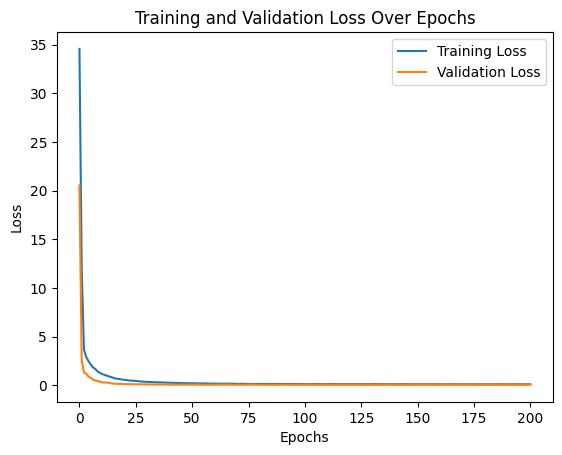

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

# Tyler Burguillos 11/13/2024

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
FCNN Model - RMSE: 0.1515, R²: 0.9674, MAPE: 1.3518%


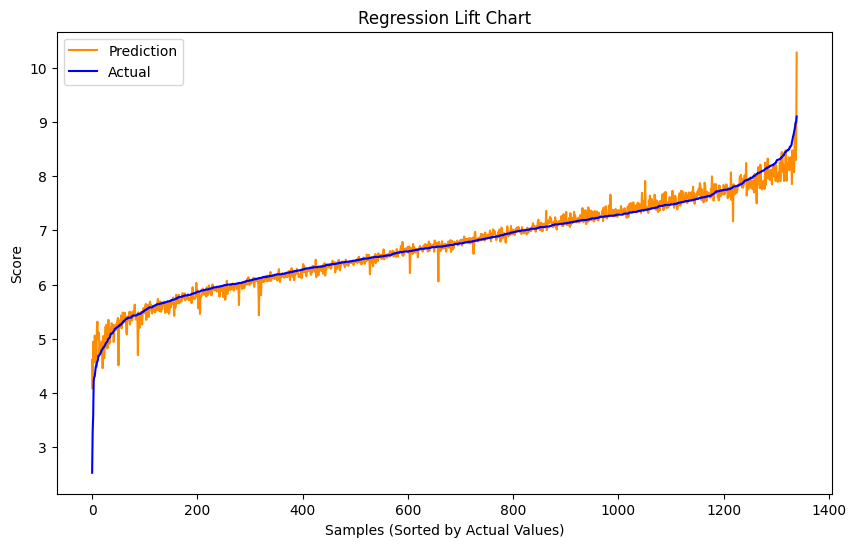

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Tyler Burguillos 11/13/2024


#### Model 3

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(300, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Second hidden layer
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_fnn_model_3.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Tyler Burguillos 11/13/2024


Epoch 1/1000

Epoch 1: val_loss improved from inf to 31.01163, saving model to Tyler_fnn_model_3.keras
168/168 - 6s - 34ms/step - loss: 39.5607 - root_mean_squared_error: 6.2897 - val_loss: 31.0116 - val_root_mean_squared_error: 5.5688
Epoch 2/1000

Epoch 2: val_loss improved from 31.01163 to 11.80589, saving model to Tyler_fnn_model_3.keras
168/168 - 2s - 13ms/step - loss: 21.6516 - root_mean_squared_error: 4.6531 - val_loss: 11.8059 - val_root_mean_squared_error: 3.4360
Epoch 3/1000

Epoch 3: val_loss improved from 11.80589 to 2.58946, saving model to Tyler_fnn_model_3.keras
168/168 - 3s - 17ms/step - loss: 7.7335 - root_mean_squared_error: 2.7809 - val_loss: 2.5895 - val_root_mean_squared_error: 1.6092
Epoch 4/1000

Epoch 4: val_loss improved from 2.58946 to 1.22598, saving model to Tyler_fnn_model_3.keras
168/168 - 3s - 16ms/step - loss: 3.8176 - root_mean_squared_error: 1.9539 - val_loss: 1.2260 - val_root_mean_squared_error: 1.1072
Epoch 5/1000

Epoch 5: val_loss improved from 1.

Test RMSE: 0.1423996239900589


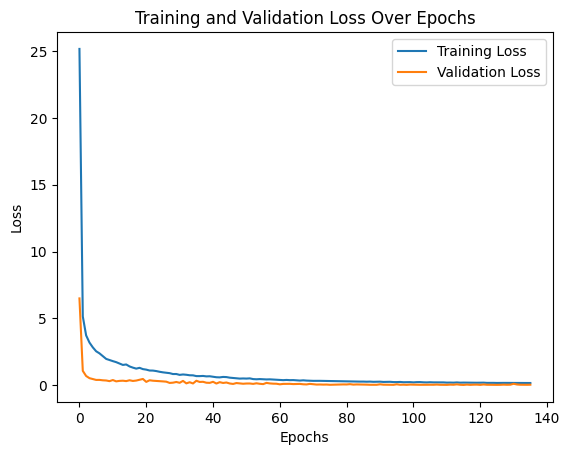

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Tyler Burguillos 11/13/2024

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
FCNN Model - RMSE: 0.1424, R²: 0.9712, MAPE: 1.1237%


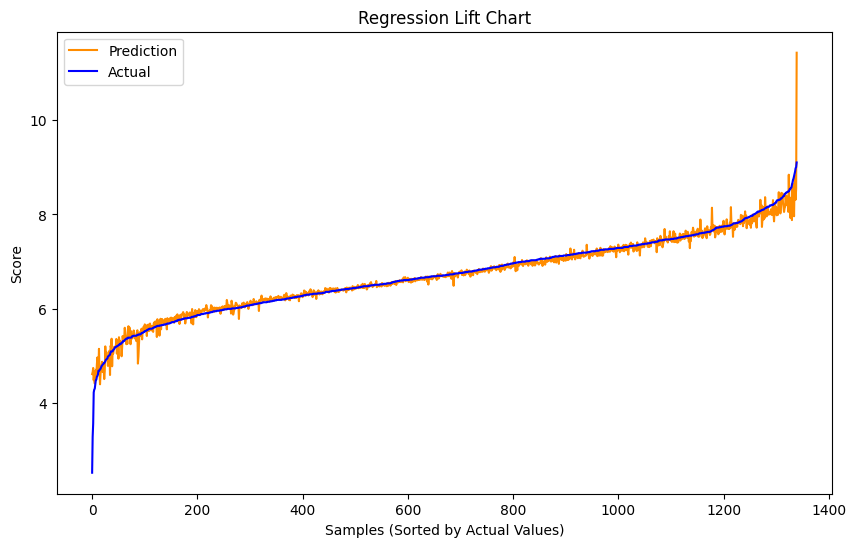

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Tyler Burguillos 11/13/2024

#### Model 4

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(300, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Second hidden layer
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Third hidden layer
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_fnn_model_4.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Tyler Burguillos 11/13/2024


Epoch 1/1000

Epoch 1: val_loss improved from inf to 6.24806, saving model to Tyler_fnn_model_4.keras
168/168 - 7s - 41ms/step - loss: 11.7813 - root_mean_squared_error: 3.4324 - val_loss: 6.2481 - val_root_mean_squared_error: 2.4996
Epoch 2/1000

Epoch 2: val_loss improved from 6.24806 to 1.55003, saving model to Tyler_fnn_model_4.keras
168/168 - 2s - 13ms/step - loss: 4.0083 - root_mean_squared_error: 2.0021 - val_loss: 1.5500 - val_root_mean_squared_error: 1.2450
Epoch 3/1000

Epoch 3: val_loss improved from 1.55003 to 0.89918, saving model to Tyler_fnn_model_4.keras
168/168 - 2s - 11ms/step - loss: 3.3197 - root_mean_squared_error: 1.8220 - val_loss: 0.8992 - val_root_mean_squared_error: 0.9483
Epoch 4/1000

Epoch 4: val_loss did not improve from 0.89918
168/168 - 2s - 15ms/step - loss: 2.8227 - root_mean_squared_error: 1.6801 - val_loss: 0.9748 - val_root_mean_squared_error: 0.9873
Epoch 5/1000

Epoch 5: val_loss improved from 0.89918 to 0.87184, saving model to Tyler_fnn_model_4.

Test RMSE: 0.12767139077186584


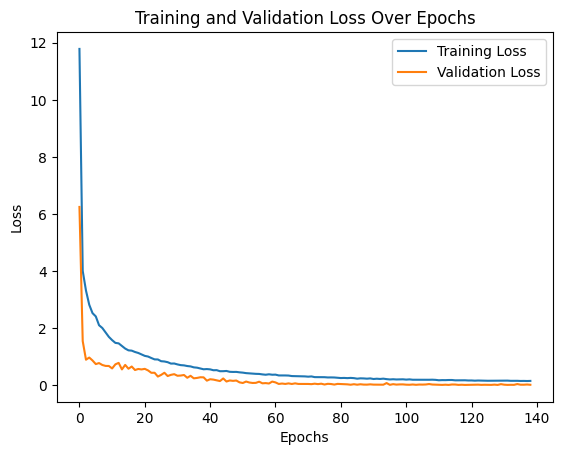

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Tyler Burguillos 11/13/2024


42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
FCNN Model - RMSE: 0.1277, R²: 0.9769, MAPE: 1.2031%


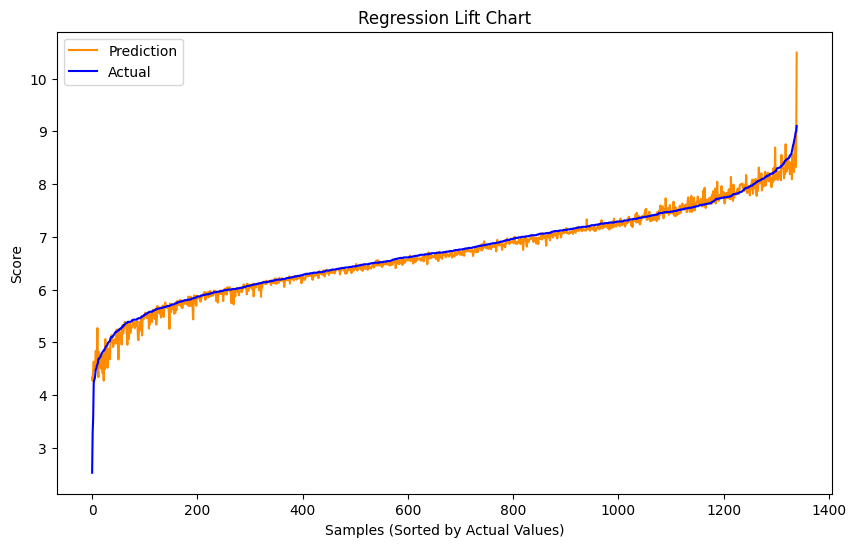

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Tyler Burguillos 11/13/2024


#### Model 5

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(300, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Second hidden layer
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Third hidden layer
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))

# Fourth hidden layer
model.add(Dense(32, activation='relu'))

# Output layer for regression
model.add(Dense(1))

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_fnn_model_5.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Tyler Burguillos 11/13/2024


Epoch 1/1000

Epoch 1: val_loss improved from inf to 9.61478, saving model to Tyler_fnn_model_5.keras
168/168 - 6s - 34ms/step - loss: 8.6056 - root_mean_squared_error: 2.9335 - val_loss: 9.6148 - val_root_mean_squared_error: 3.1008
Epoch 2/1000

Epoch 2: val_loss improved from 9.61478 to 3.40068, saving model to Tyler_fnn_model_5.keras
168/168 - 2s - 11ms/step - loss: 2.4993 - root_mean_squared_error: 1.5809 - val_loss: 3.4007 - val_root_mean_squared_error: 1.8441
Epoch 3/1000

Epoch 3: val_loss improved from 3.40068 to 2.14989, saving model to Tyler_fnn_model_5.keras
168/168 - 1s - 8ms/step - loss: 2.0183 - root_mean_squared_error: 1.4207 - val_loss: 2.1499 - val_root_mean_squared_error: 1.4663
Epoch 4/1000

Epoch 4: val_loss improved from 2.14989 to 2.00674, saving model to Tyler_fnn_model_5.keras
168/168 - 1s - 7ms/step - loss: 1.6468 - root_mean_squared_error: 1.2833 - val_loss: 2.0067 - val_root_mean_squared_error: 1.4166
Epoch 5/1000

Epoch 5: val_loss improved from 2.00674 to 1

Test RMSE: 0.1435873955488205


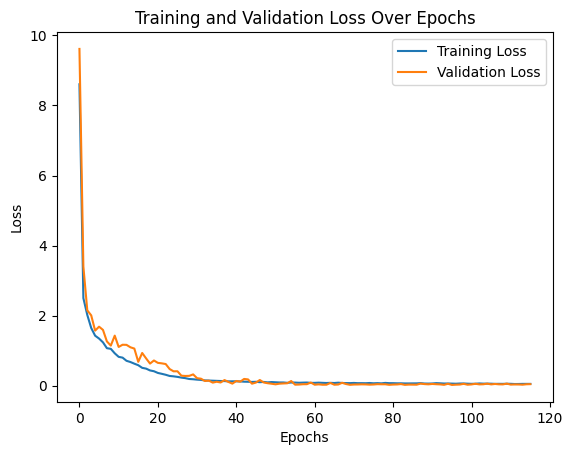

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Tyler Burguillos 11/13/2024


42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
FCNN Model - RMSE: 0.1436, R²: 0.9707, MAPE: 1.3836%


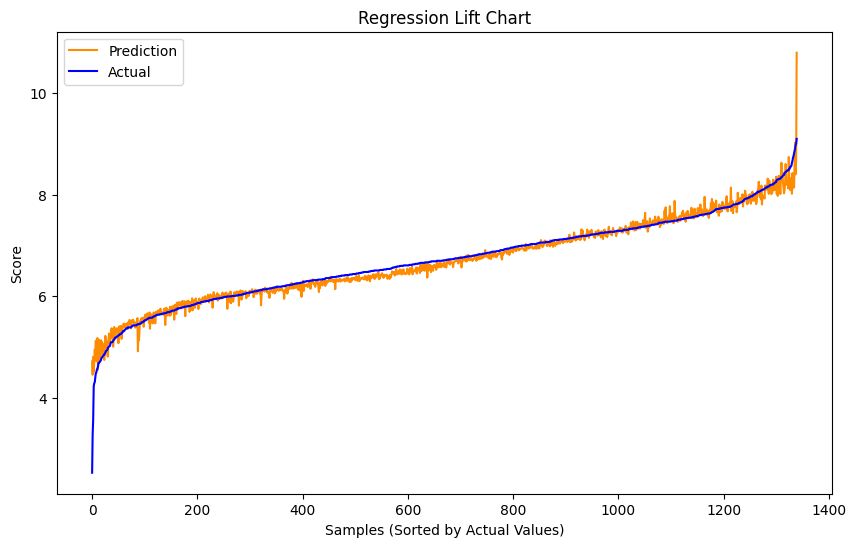

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Tyler Burguillos 11/13/2024


#### Model 6

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(300, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Second hidden layer
model.add(Dense(100, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Third hidden layer
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))

# Fourth hidden layer
model.add(Dense(32, activation='relu'))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_fnn_model_6.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Tyler Burguillos 11/13/2024


Epoch 1/1000

Epoch 1: val_loss improved from inf to 2.23350, saving model to Tyler_fnn_model_6.keras
168/168 - 5s - 32ms/step - loss: 3.1957 - root_mean_squared_error: 1.7876 - val_loss: 2.2335 - val_root_mean_squared_error: 1.4945
Epoch 2/1000

Epoch 2: val_loss improved from 2.23350 to 0.98652, saving model to Tyler_fnn_model_6.keras
168/168 - 2s - 13ms/step - loss: 1.1323 - root_mean_squared_error: 1.0641 - val_loss: 0.9865 - val_root_mean_squared_error: 0.9932
Epoch 3/1000

Epoch 3: val_loss did not improve from 0.98652
168/168 - 1s - 7ms/step - loss: 0.7815 - root_mean_squared_error: 0.8840 - val_loss: 1.1955 - val_root_mean_squared_error: 1.0934
Epoch 4/1000

Epoch 4: val_loss improved from 0.98652 to 0.83309, saving model to Tyler_fnn_model_6.keras
168/168 - 1s - 8ms/step - loss: 0.4898 - root_mean_squared_error: 0.6999 - val_loss: 0.8331 - val_root_mean_squared_error: 0.9127
Epoch 5/1000

Epoch 5: val_loss improved from 0.83309 to 0.09630, saving model to Tyler_fnn_model_6.ker

Test RMSE: 0.14059273898601532


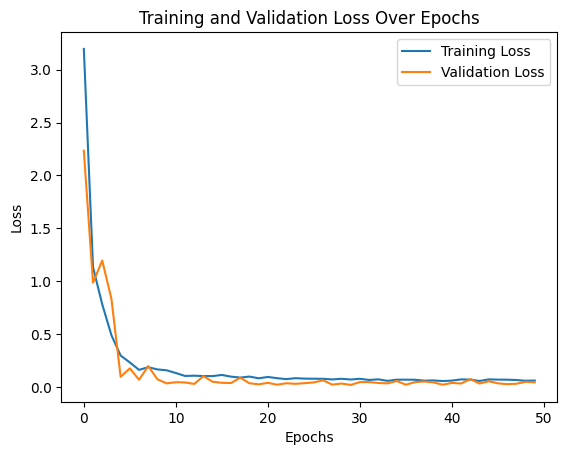

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Tyler Burguillos 11/13/2024


42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
FCNN Model - RMSE: 0.1406, R²: 0.9719, MAPE: 1.5250%


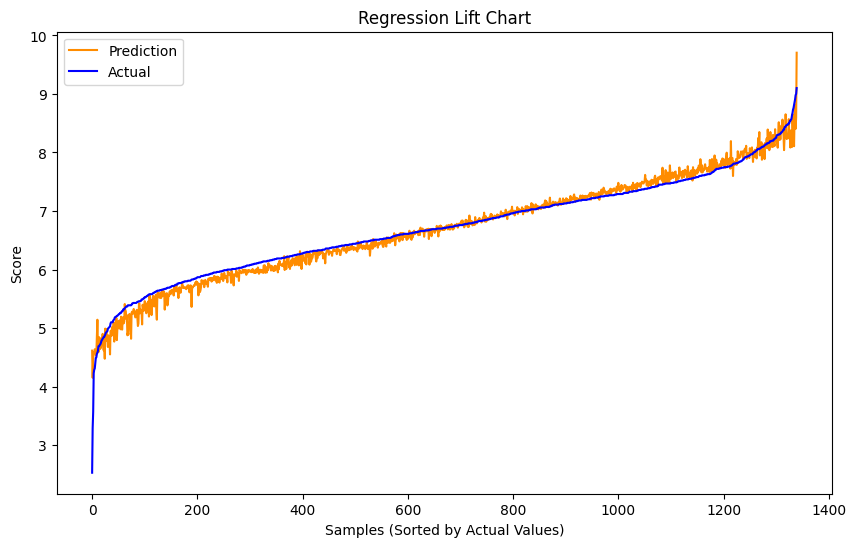

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Tyler Burguillos 11/13/2024


#### Model 4

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(300, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Second hidden layer
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Third hidden layer
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_fnn_model_7.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Tyler Burguillos 11/13/2024


Epoch 1/1000

Epoch 1: val_loss improved from inf to 6.69337, saving model to Tyler_fnn_model_7.keras
168/168 - 4s - 23ms/step - loss: 15.5251 - root_mean_squared_error: 3.9402 - val_loss: 6.6934 - val_root_mean_squared_error: 2.5872
Epoch 2/1000

Epoch 2: val_loss improved from 6.69337 to 1.48958, saving model to Tyler_fnn_model_7.keras
168/168 - 2s - 13ms/step - loss: 4.2064 - root_mean_squared_error: 2.0509 - val_loss: 1.4896 - val_root_mean_squared_error: 1.2205
Epoch 3/1000

Epoch 3: val_loss improved from 1.48958 to 0.80948, saving model to Tyler_fnn_model_7.keras
168/168 - 2s - 11ms/step - loss: 3.2925 - root_mean_squared_error: 1.8145 - val_loss: 0.8095 - val_root_mean_squared_error: 0.8997
Epoch 4/1000

Epoch 4: val_loss improved from 0.80948 to 0.74975, saving model to Tyler_fnn_model_7.keras
168/168 - 2s - 11ms/step - loss: 2.8847 - root_mean_squared_error: 1.6984 - val_loss: 0.7498 - val_root_mean_squared_error: 0.8659
Epoch 5/1000

Epoch 5: val_loss did not improve from 0.

Test RMSE: 0.13465674221515656


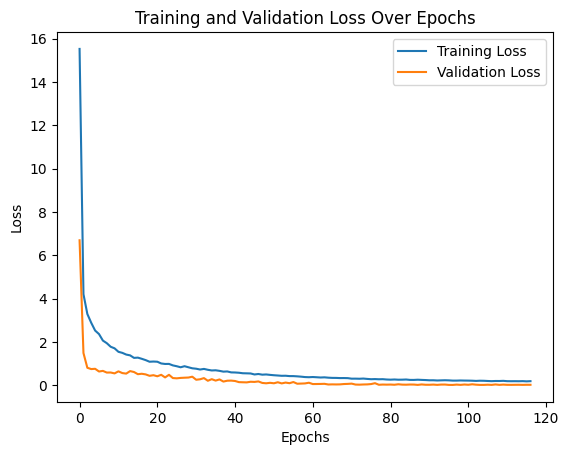

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Tyler Burguillos 11/13/2024


42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
FCNN Model - RMSE: 0.1347, R²: 0.9743, MAPE: 1.3656%


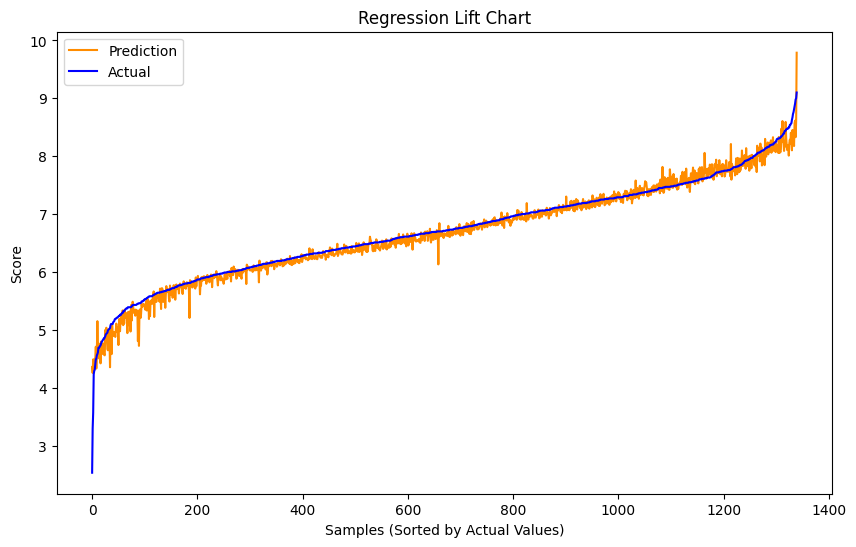

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Tyler Burguillos 11/13/2024


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test, titles_train, titles_test = train_test_split(
    X, y, titles, test_size=0.2, random_state=42, shuffle=True
)

results_df = pd.DataFrame({
    'Title': titles_test[:5].values,
    'Predicted Score': y_pred[:5].flatten(),
    'Actual Score': y_test[:5].flatten()
})

print(results_df)
# Tyler Burguillos 11/13/2024


                              Title  Predicted Score  Actual Score
0  Honoo no Alpenrose: Judy & Randy         6.555678          6.69
1                         Akuma-kun         6.722608          6.73
2                Kujibiki Unbalance         6.027606          6.08
3             Meikyuu Black Company         7.285039          7.26
4                 Aoharu x Kikanjuu         7.119590          7.16


#### Keras Tuning Model 4 with RandomSearch

In [ ]:
!pip install -q -U keras-tuner
# Tyler Burguillos 11/13/2024


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.2 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras_tuner import RandomSearch

# Define the model-building function for Keras Tuner
def build_model(hp):
    model = Sequential()
    model.add(Input(shape=(X_train.shape[1],)))
    model.add(BatchNormalization())

    # Tuning the number of units in the first layer
    model.add(Dense(units=hp.Int('units_1', min_value=128, max_value=512, step=64), activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(rate=hp.Float('dropout_1', min_value=0.2, max_value=0.5, step=0.1)))

    # Tuning the number of units in the second layer
    model.add(Dense(units=hp.Int('units_2', min_value=64, max_value=256, step=32), activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(rate=hp.Float('dropout_2', min_value=0.2, max_value=0.5, step=0.1)))

    # Tuning the number of units in the third layer
    model.add(Dense(units=hp.Int('units_3', min_value=32, max_value=128, step=16), activation='relu'))
    model.add(Dropout(rate=hp.Float('dropout_3', min_value=0.2, max_value=0.5, step=0.1)))

    # Output layer
    model.add(Dense(1))

    # Tuning the learning rate of the optimizer
    model.compile(
        optimizer=Adam(learning_rate=hp.Choice('learning_rate', values=[1e-2, 1e-3, 5e-4])),
        loss='mean_squared_error',
        metrics=[tf.keras.metrics.RootMeanSquaredError()]
    )

    return model

# Initialize Keras Tuner with RandomSearch
tuner = RandomSearch(
    build_model,
    objective='val_root_mean_squared_error',
    max_trials=10,
    executions_per_trial=1,
    directory='tuner_dir',
    project_name='anime_score_prediction'
)

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_fnn_hypertuning.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)


# Run the tuner search
tuner.search(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=150,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)

# Retrieve the best model
best_model = tuner.get_best_models(num_models=1)[0]

# Evaluate the best model
best_model.evaluate(X_test, y_test, verbose=2)

# Display the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best hyperparameters found:")
print(f"Units in first layer: {best_hps.get('units_1')}")
print(f"Units in second layer: {best_hps.get('units_2')}")
print(f"Units in third layer: {best_hps.get('units_3')}")
print(f"Dropout rate for first layer: {best_hps.get('dropout_1')}")
print(f"Dropout rate for second layer: {best_hps.get('dropout_2')}")
print(f"Dropout rate for third layer: {best_hps.get('dropout_3')}")
print(f"Learning rate: {best_hps.get('learning_rate')}")
# Tyler Burguillos 11/13/2024


Trial 10 Complete [00h 00m 46s]
val_root_mean_squared_error: 0.40909841656684875

Best val_root_mean_squared_error So Far: 0.12453621625900269
Total elapsed time: 00h 14m 26s


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


42/42 - 0s - 6ms/step - loss: 0.0155 - root_mean_squared_error: 0.1245
Best hyperparameters found:
Units in first layer: 384
Units in second layer: 64
Units in third layer: 64
Dropout rate for first layer: 0.2
Dropout rate for second layer: 0.4
Dropout rate for third layer: 0.2
Learning rate: 0.001


#### Model 4 Using Hyperparameters from Tuning

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(384, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))

# Second hidden layer
model.add(Dense(64, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Third hidden layer
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_fnn_model_using_tunedHyperparameters.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Tyler Burguillos 11/13/2024


Epoch 1/1000

Epoch 1: val_loss improved from inf to 3.38392, saving model to Tyler_fnn_model_using_tunedHyperparameters.keras
168/168 - 4s - 25ms/step - loss: 18.9971 - root_mean_squared_error: 4.3586 - val_loss: 3.3839 - val_root_mean_squared_error: 1.8395
Epoch 2/1000

Epoch 2: val_loss improved from 3.38392 to 0.91140, saving model to Tyler_fnn_model_using_tunedHyperparameters.keras
168/168 - 3s - 17ms/step - loss: 3.2666 - root_mean_squared_error: 1.8074 - val_loss: 0.9114 - val_root_mean_squared_error: 0.9547
Epoch 3/1000

Epoch 3: val_loss improved from 0.91140 to 0.66273, saving model to Tyler_fnn_model_using_tunedHyperparameters.keras
168/168 - 2s - 9ms/step - loss: 2.6212 - root_mean_squared_error: 1.6190 - val_loss: 0.6627 - val_root_mean_squared_error: 0.8141
Epoch 4/1000

Epoch 4: val_loss improved from 0.66273 to 0.62055, saving model to Tyler_fnn_model_using_tunedHyperparameters.keras
168/168 - 2s - 13ms/step - loss: 2.1765 - root_mean_squared_error: 1.4753 - val_loss: 0

Test RMSE: 0.10974617302417755


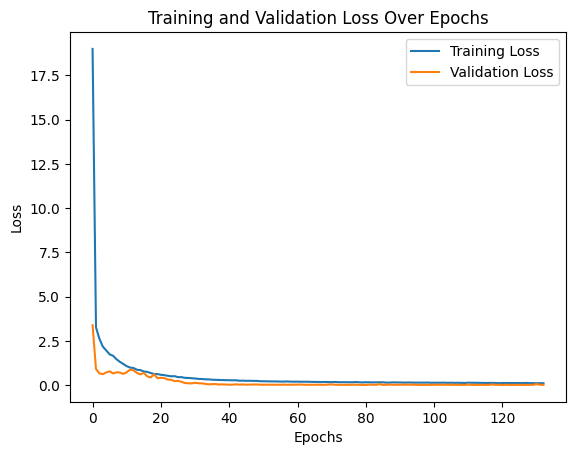

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Tyler Burguillos 11/13/2024


42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
FCNN Model - RMSE: 0.1097, R²: 0.9829, MAPE: 0.8905%


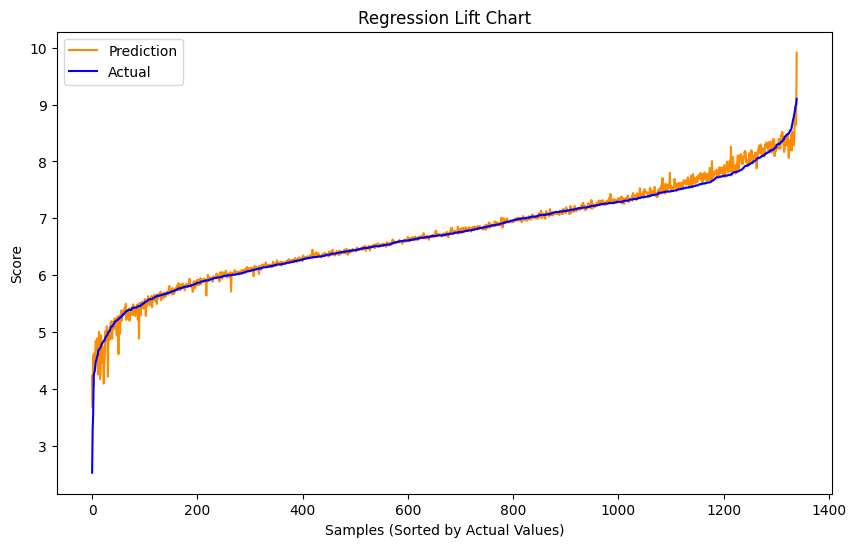

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Tyler Burguillos 11/13/2024


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test, titles_train, titles_test = train_test_split(
    X, y, titles, test_size=0.2, random_state=42, shuffle=True
)

results_df = pd.DataFrame({
    'Title': titles_test[:5].values,
    'Predicted Score': y_pred[:5].flatten(),
    'Actual Score': y_test[:5].flatten()
})

results_df
# Tyler Burguillos 11/13/2024


,Title,Predicted Score,Actual Score
0,Honoo no Alpenrose: Judy & Randy,6.669226,6.69
1,Akuma-kun,6.748363,6.73
2,Kujibiki Unbalance,6.132574,6.08
3,Meikyuu Black Company,7.307026,7.26
4,Aoharu x Kikanjuu,7.179444,7.16


### FCNN Model Design and Testing (Austin Nolte)

#### Model 1 Sigmoid and Adam

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

input_shape = X_train.shape[1]

model = Sequential()

# Input layer
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

model.add(Dense(512, activation='sigmoid'))
model.add(BatchNormalization())

model.add(Dense(256, activation='sigmoid'))
model.add(BatchNormalization())

model.add(Dense(128, activation='sigmoid'))
model.add(BatchNormalization())

# output layer
model.add(Dense(1))

# lower learing rate on Adam
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_fnn_model_1_AdamSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/20

Epoch 1/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 35.3676 - root_mean_squared_error: 5.9176
Epoch 1: val_loss improved from inf to 1.41145, saving model to AustinNolte_fnn_model_1_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 35.2967 - root_mean_squared_error: 5.9112 - val_loss: 1.4114 - val_root_mean_squared_error: 1.1880
Epoch 2/1000
164/168 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.9801 - root_mean_squared_error: 0.9704
Epoch 2: val_loss improved from 1.41145 to 0.33562, saving model to AustinNolte_fnn_model_1_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.9673 - root_mean_squared_error: 0.9635 - val_loss: 0.3356 - val_root_mean_squared_error: 0.5793
Epoch 3/1000
166/168 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1645 - root_mean_squared_error: 0.4053
Epoch 3: val_loss improved from 0.33562 to 0.14152, saving model to AustinNolte_fnn_model_1_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.1642 - root_

Test RMSE: 0.15603448450565338


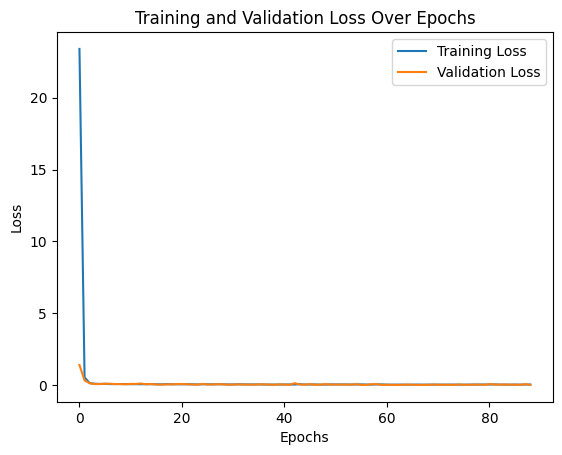

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Austin Nolte 11/20

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
FCNN Model - RMSE: 0.1560, R²: 0.9654, MAPE: 1.3468%


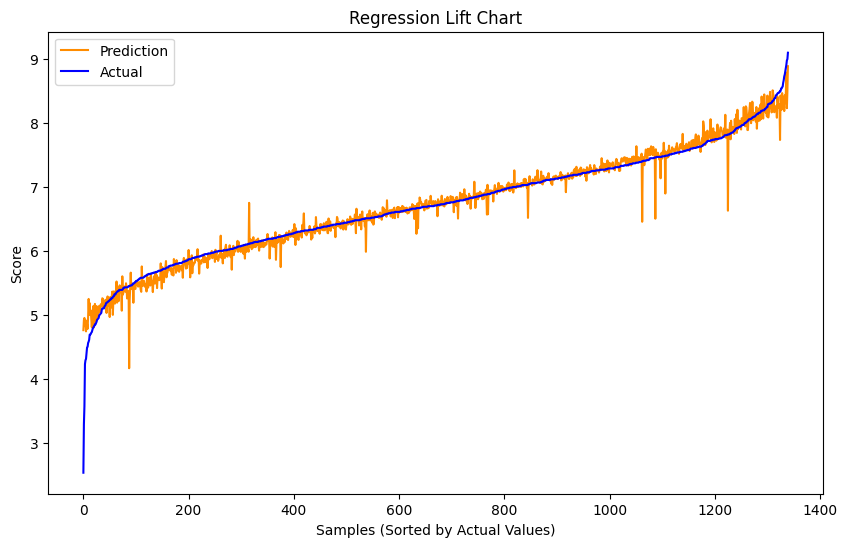

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Austin Nolte 11/20

#### Model 2 Sigmoid, relu and Adam

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

input_shape = X_train.shape[1]

model = Sequential()

# Input layer
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(128, activation='sigmoid'))
model.add(Dense(64, activation='sigmoid'))
model.add(Dense(32, activation='sigmoid'))

model.add(BatchNormalization())

# output layer
model.add(Dense(1))

# lower learing rate on Adam
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_fnn_model_2_AdamSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/20

Epoch 1/1000
166/168 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 40.1265 - root_mean_squared_error: 6.3270
Epoch 1: val_loss improved from inf to 15.04121, saving model to AustinNolte_fnn_model_2_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - loss: 40.0000 - root_mean_squared_error: 6.3166 - val_loss: 15.0412 - val_root_mean_squared_error: 3.8783
Epoch 2/1000
167/168 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 10.6654 - root_mean_squared_error: 3.2283
Epoch 2: val_loss improved from 15.04121 to 0.62389, saving model to AustinNolte_fnn_model_2_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 10.6120 - root_mean_squared_error: 3.2195 - val_loss: 0.6239 - val_root_mean_squared_error: 0.7899
Epoch 3/1000
164/168 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2880 - root_mean_squared_error: 0.5286
Epoch 3: val_loss improved from 0.62389 to 0.45894, saving model to AustinNolte_fnn_model_2_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.2844 - r

Test RMSE: 0.13279776275157928


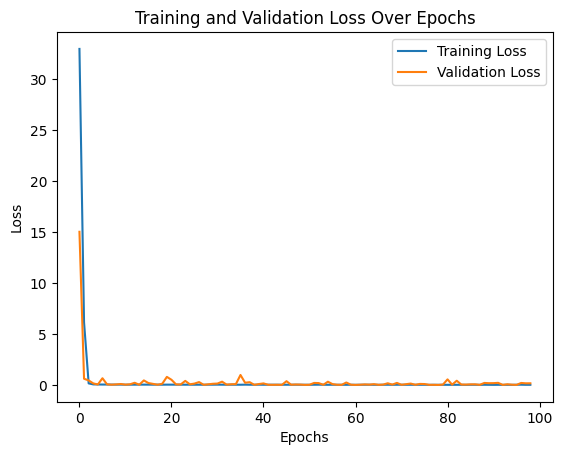

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Austin Nolte 11/20

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
FCNN Model - RMSE: 0.1328, R²: 0.9750, MAPE: 1.0956%


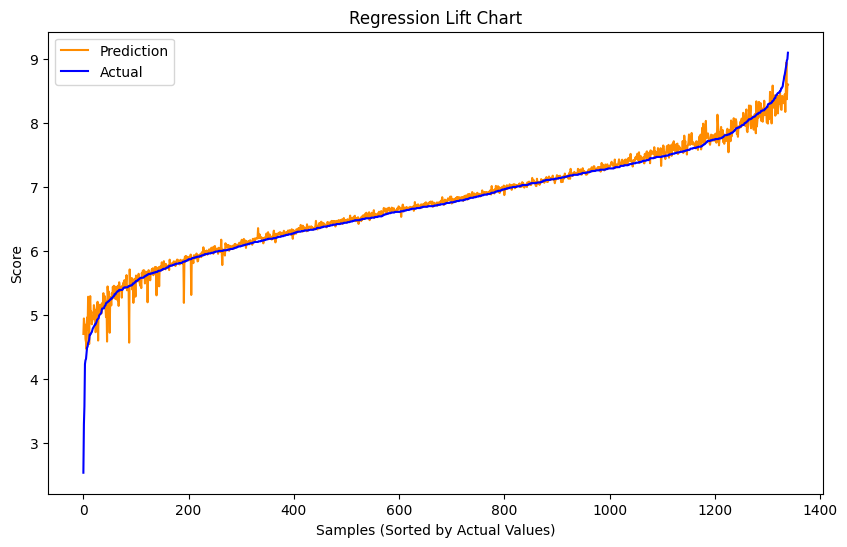

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Austin Nolte 11/20

#### Model 3 Sigmoid, relu and Adam

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

input_shape = X_train.shape[1]

model = Sequential()

# Input layer
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(128, activation='sigmoid'))
model.add(Dense(64, activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='sigmoid'))
model.add(BatchNormalization())

# output layer
model.add(Dense(1))

# lower learing rate on Adam
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_fnn_model_3_AdamSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/20

Epoch 1/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 42.1084 - root_mean_squared_error: 6.4854
Epoch 1: val_loss improved from inf to 29.44236, saving model to AustinNolte_fnn_model_3_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 42.0806 - root_mean_squared_error: 6.4832 - val_loss: 29.4424 - val_root_mean_squared_error: 5.4261
Epoch 2/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 20.9184 - root_mean_squared_error: 4.5587
Epoch 2: val_loss improved from 29.44236 to 7.17973, saving model to AustinNolte_fnn_model_3_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 20.8863 - root_mean_squared_error: 4.5550 - val_loss: 7.1797 - val_root_mean_squared_error: 2.6795
Epoch 3/1000
165/168 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.7588 - root_mean_squared_error: 1.9187
Epoch 3: val_loss improved from 7.17973 to 0.51244, saving model to AustinNolte_fnn_model_3_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 3.7227 - ro

Test RMSE: 0.13556043803691864


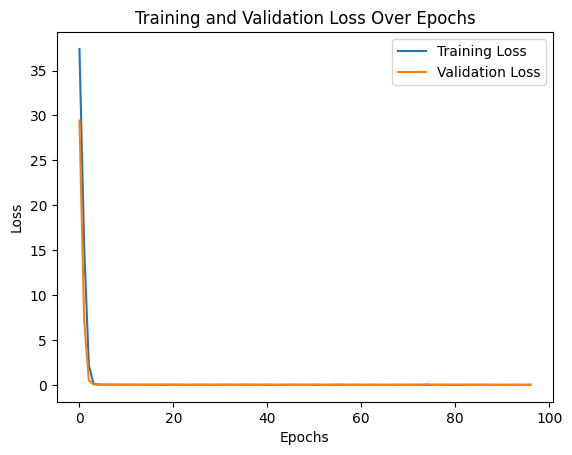

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Austin Nolte 11/20

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
FCNN Model - RMSE: 0.1356, R²: 0.9739, MAPE: 1.0503%


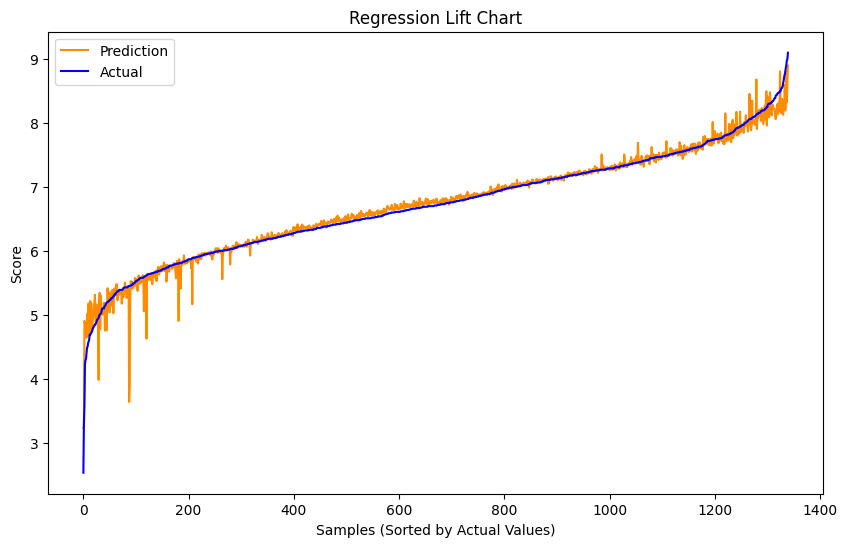

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Austin Nolte 11/20

#### Model 4 Sigmoid, relu and Adam

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

input_shape = X_train.shape[1]

model = Sequential()

# Input layer
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

model.add(Dense(1024, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(128, activation='sigmoid'))
model.add(Dense(64, activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='sigmoid'))
model.add(BatchNormalization())

# output layer
model.add(Dense(1))

# lower learing rate on Adam
model.compile(optimizer=Adam(learning_rate=0.0001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_fnn_model_4_AdamSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/20

Epoch 1/1000
167/168 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 45.8644 - root_mean_squared_error: 6.7721
Epoch 1: val_loss improved from inf to 45.22118, saving model to AustinNolte_fnn_model_4_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 45.8567 - root_mean_squared_error: 6.7716 - val_loss: 45.2212 - val_root_mean_squared_error: 6.7247
Epoch 2/1000
167/168 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 43.7914 - root_mean_squared_error: 6.6175
Epoch 2: val_loss improved from 45.22118 to 40.65336, saving model to AustinNolte_fnn_model_4_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 43.7866 - root_mean_squared_error: 6.6171 - val_loss: 40.6534 - val_root_mean_squared_error: 6.3760
Epoch 3/1000
166/168 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 42.0883 - root_mean_squared_error: 6.4875
Epoch 3: val_loss improved from 40.65336 to 39.75721, saving model to AustinNolte_fnn_model_4_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 42.0

Test RMSE: 0.14588773250579834


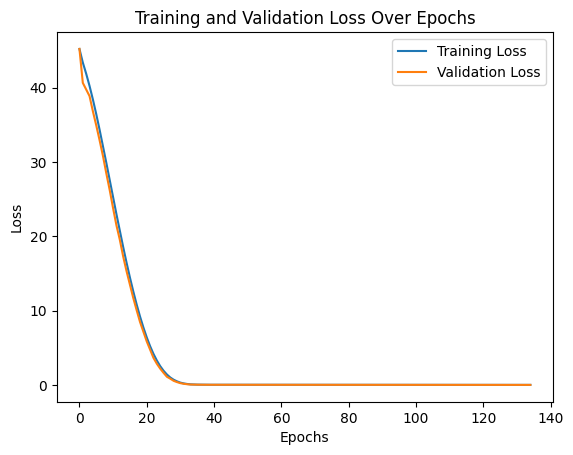

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Austin Nolte 11/20

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
FCNN Model - RMSE: 0.1459, R²: 0.9698, MAPE: 1.2284%


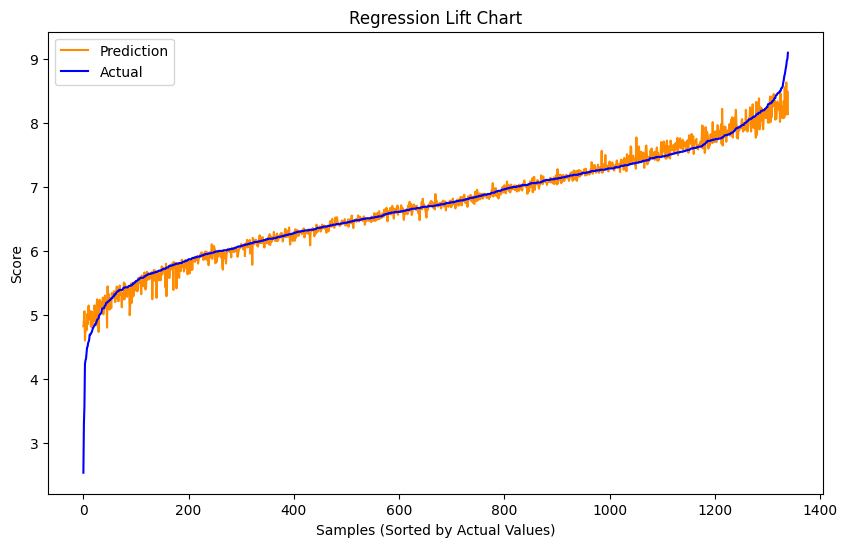

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Austin Nolte 11/20

#### Model 5 Sigmoid, relu and Adam

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

input_shape = X_train.shape[1]

model = Sequential()

# Input layer
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(128, activation='sigmoid'))
model.add(Dense(64, activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='sigmoid'))
model.add(BatchNormalization())

# output layer
model.add(Dense(1))

# lower learing rate on Adam
model.compile(optimizer=Adam(learning_rate=0.0001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_fnn_model_5_AdamSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=64,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/20

Epoch 1/1000
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 46.0378 - root_mean_squared_error: 6.7850
Epoch 1: val_loss improved from inf to 38.37860, saving model to AustinNolte_fnn_model_5_AdamSigmoid.keras
84/84 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 46.0318 - root_mean_squared_error: 6.7846 - val_loss: 38.3786 - val_root_mean_squared_error: 6.1950
Epoch 2/1000
82/84 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 44.9218 - root_mean_squared_error: 6.7023
Epoch 2: val_loss improved from 38.37860 to 37.52573, saving model to AustinNolte_fnn_model_5_AdamSigmoid.keras
84/84 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 44.9083 - root_mean_squared_error: 6.7013 - val_loss: 37.5257 - val_root_mean_squared_error: 6.1258
Epoch 3/1000
83/84 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 43.8647 - root_mean_squared_error: 6.6230
Epoch 3: val_loss improved from 37.52573 to 36.35347, saving model to AustinNolte_fnn_model_5_AdamSigmoid.keras
84/84 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 43.8649 - root_m

Test RMSE: 0.14823876321315765


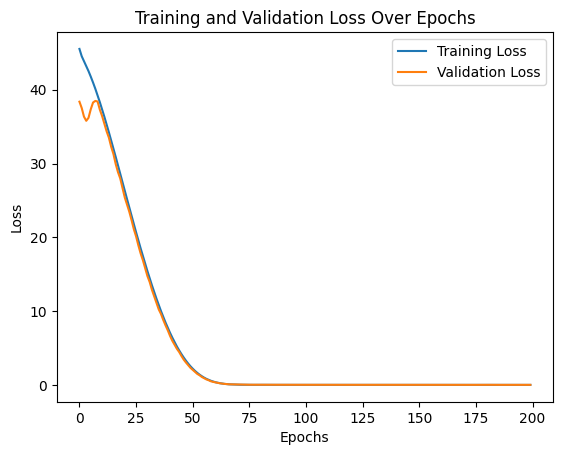

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Austin Nolte 11/20

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
FCNN Model - RMSE: 0.1482, R²: 0.9688, MAPE: 1.3009%


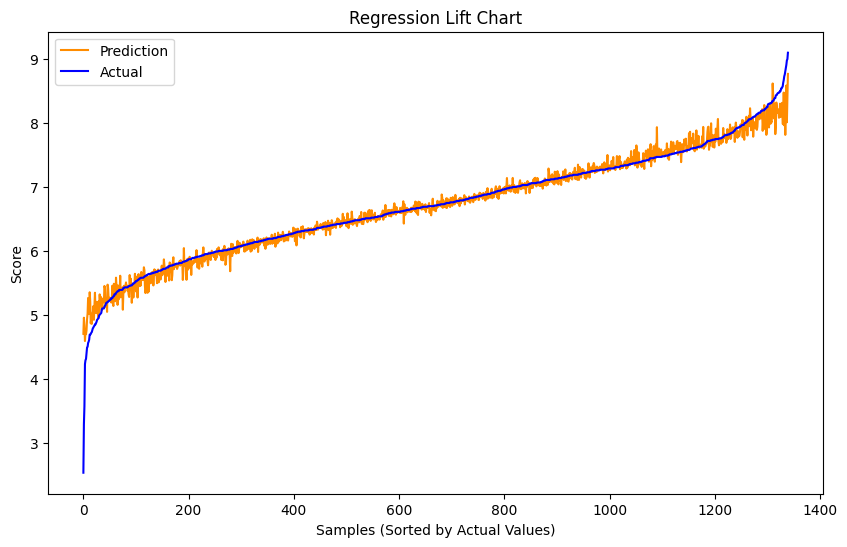

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Austin Nolte 11/20

#### Model 6 Sigmoid and SGD

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

input_shape = X_train.shape[1]

model = Sequential()

# Input layer
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

model.add(Dense(512, activation='sigmoid'))
model.add(BatchNormalization())

model.add(Dense(256, activation='sigmoid'))
model.add(BatchNormalization())

model.add(Dense(128, activation='sigmoid'))
model.add(BatchNormalization())

# output layer
model.add(Dense(1))

# lower learing rate on SGD
model.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_fnn_model_6_SGDSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/21

Epoch 1/1000
161/168 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 12.9071 - root_mean_squared_error: 3.3367
Epoch 1: val_loss improved from inf to 0.79924, saving model to AustinNolte_fnn_model_6_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 12.4876 - root_mean_squared_error: 3.2740 - val_loss: 0.7992 - val_root_mean_squared_error: 0.8940
Epoch 2/1000
165/168 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2094 - root_mean_squared_error: 0.4571
Epoch 2: val_loss improved from 0.79924 to 0.25668, saving model to AustinNolte_fnn_model_6_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.2092 - root_mean_squared_error: 0.4569 - val_loss: 0.2567 - val_root_mean_squared_error: 0.5066
Epoch 3/1000
165/168 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1679 - root_mean_squared_error: 0.4097
Epoch 3: val_loss improved from 0.25668 to 0.11139, saving model to AustinNolte_fnn_model_6_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.1679 - root_mean_s

Test RMSE: 0.19917502999305725


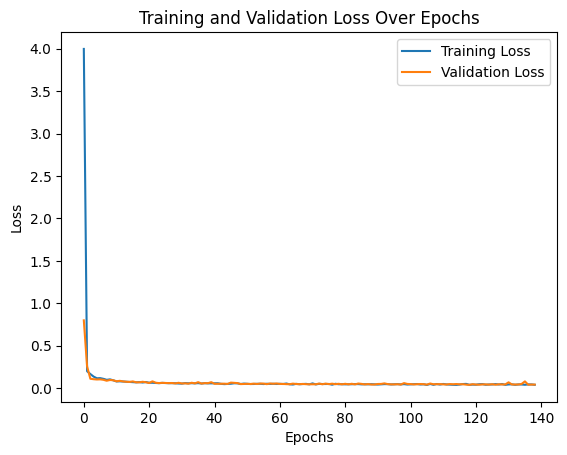

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Austin Nolte 11/21

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
FCNN Model - RMSE: 0.1992, R²: 0.9437, MAPE: 2.0315%


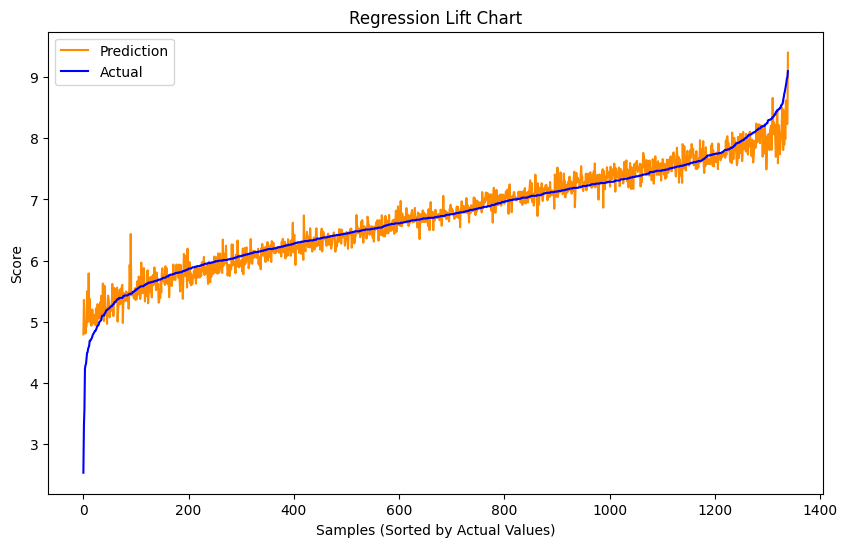

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Austin Nolte 11/21

#### Model 7 Sigmoid, relu and SGD

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

input_shape = X_train.shape[1]

model = Sequential()

# Input layer
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(128, activation='sigmoid'))
model.add(Dense(64, activation='sigmoid'))
model.add(Dense(32, activation='sigmoid'))

model.add(BatchNormalization())

# output layer
model.add(Dense(1))

# lower learing rate on SGD
model.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_fnn_model_7_SGDSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/21

Epoch 1/1000
161/168 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 11.8940 - root_mean_squared_error: 3.1890
Epoch 1: val_loss improved from inf to 0.75245, saving model to AustinNolte_fnn_model_7_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 11.5018 - root_mean_squared_error: 3.1279 - val_loss: 0.7524 - val_root_mean_squared_error: 0.8674
Epoch 2/1000
167/168 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1168 - root_mean_squared_error: 0.3415
Epoch 2: val_loss improved from 0.75245 to 0.54259, saving model to AustinNolte_fnn_model_7_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.1168 - root_mean_squared_error: 0.3415 - val_loss: 0.5426 - val_root_mean_squared_error: 0.7366
Epoch 3/1000
165/168 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0949 - root_mean_squared_error: 0.3077
Epoch 3: val_loss improved from 0.54259 to 0.29997, saving model to AustinNolte_fnn_model_7_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0948 - root_mean_

Test RMSE: 0.17278695106506348


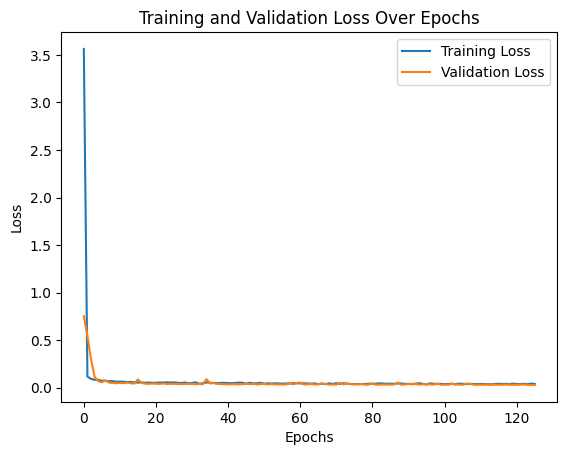

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Austin Nolte 11/20

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
FCNN Model - RMSE: 0.1728, R²: 0.9576, MAPE: 1.7597%


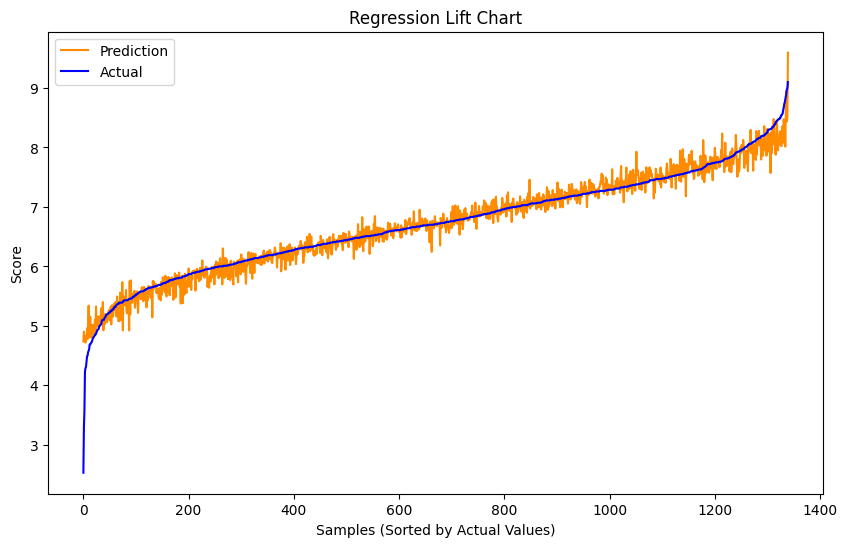

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Austin Nolte 11/20

#### Model 8 Sigmoid, relu and Adam

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam,SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

input_shape = X_train.shape[1]

model = Sequential()

# Input layer
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(128, activation='sigmoid'))
model.add(Dense(64, activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='sigmoid'))
model.add(BatchNormalization())

# output layer
model.add(Dense(1))

# lower learing rate on SGD
model.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_fnn_model_8_SGDSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/20

Epoch 1/1000
163/168 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 12.7963 - root_mean_squared_error: 3.3129
Epoch 1: val_loss improved from inf to 0.96729, saving model to AustinNolte_fnn_model_8_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 12.4828 - root_mean_squared_error: 3.2660 - val_loss: 0.9673 - val_root_mean_squared_error: 0.9835
Epoch 2/1000
166/168 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1777 - root_mean_squared_error: 0.4215
Epoch 2: val_loss improved from 0.96729 to 0.45165, saving model to AustinNolte_fnn_model_8_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1776 - root_mean_squared_error: 0.4213 - val_loss: 0.4516 - val_root_mean_squared_error: 0.6720
Epoch 3/1000
164/168 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1344 - root_mean_squared_error: 0.3665
Epoch 3: val_loss improved from 0.45165 to 0.16375, saving model to AustinNolte_fnn_model_8_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.1343 - root_mean_sq

Test RMSE: 0.17644929885864258


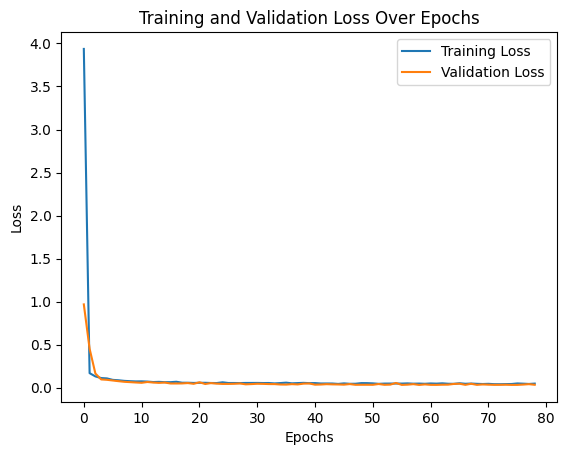

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Austin Nolte 11/20

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
FCNN Model - RMSE: 0.1764, R²: 0.9558, MAPE: 1.7338%


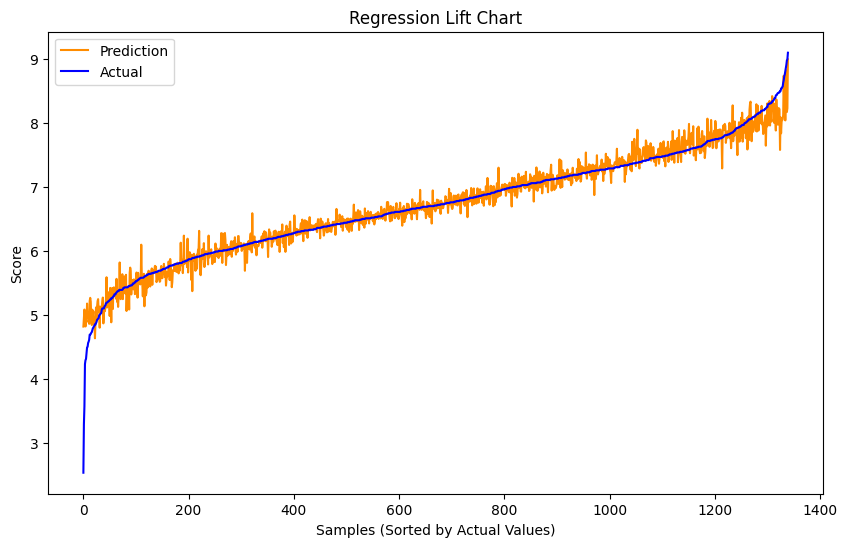

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Austin Nolte 11/20

#### Model 9 Sigmoid, relu and Adam

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam,SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

input_shape = X_train.shape[1]

model = Sequential()

# Input layer
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

model.add(Dense(1024, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(128, activation='sigmoid'))
model.add(Dense(64, activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='sigmoid'))
model.add(BatchNormalization())

# output layer
model.add(Dense(1))

# lower learing rate on SGD
model.compile(optimizer=SGD(learning_rate=0.0001, momentum=0.9), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_fnn_model_9_SGDSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/20

Epoch 1/1000
167/168 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 33.6299 - root_mean_squared_error: 5.7574
Epoch 1: val_loss improved from inf to 0.73312, saving model to AustinNolte_fnn_model_9_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 33.4808 - root_mean_squared_error: 5.7435 - val_loss: 0.7331 - val_root_mean_squared_error: 0.8562
Epoch 2/1000
165/168 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 1.1763 - root_mean_squared_error: 1.0734
Epoch 2: val_loss did not improve from 0.73312
168/168 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 1.1675 - root_mean_squared_error: 1.0692 - val_loss: 0.9171 - val_root_mean_squared_error: 0.9576
Epoch 3/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.4440 - root_mean_squared_error: 0.6658
Epoch 3: val_loss improved from 0.73312 to 0.42890, saving model to AustinNolte_fnn_model_9_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.4437 - root_mean_squared_error: 0.6656 - val_loss: 0.4289 - val_root_mean_squ

Test RMSE: 0.18722715973854065


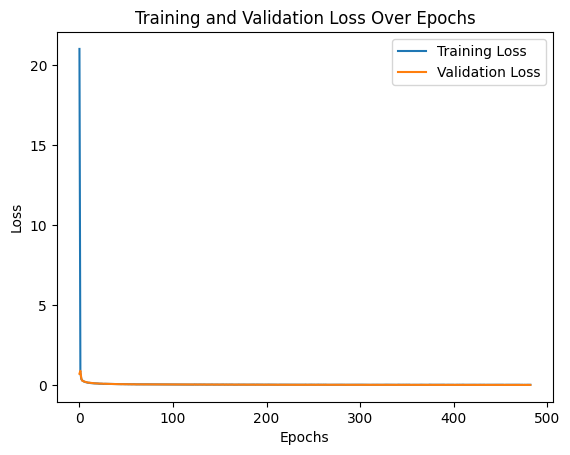

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Austin Nolte 11/20

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
FCNN Model - RMSE: 0.1872, R²: 0.9502, MAPE: 1.8870%


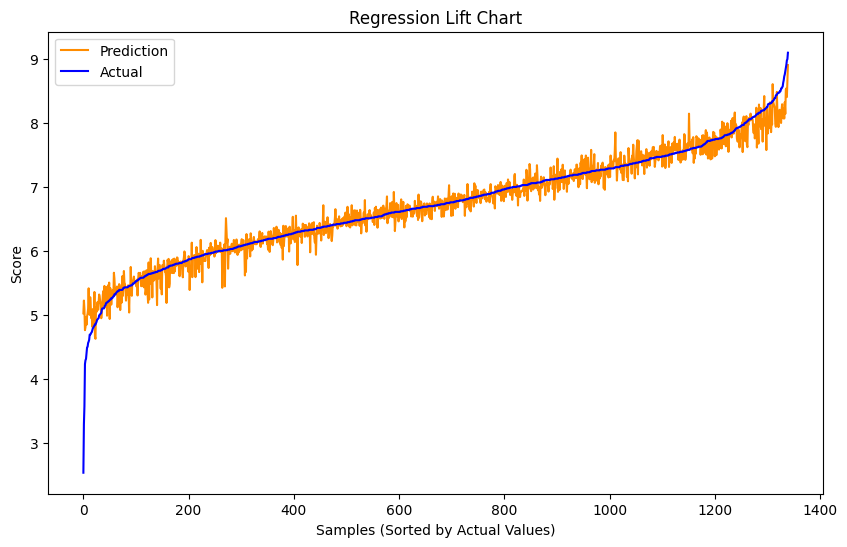

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Austin Nolte 11/20

#### Model 10 Sigmoid, relu and Adam

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam,SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

input_shape = X_train.shape[1]

model = Sequential()

# Input layer
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(128, activation='sigmoid'))
model.add(Dense(64, activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='sigmoid'))
model.add(BatchNormalization())

# output layer
model.add(Dense(1))

# lower learing rate on SGD
model.compile(optimizer=SGD(learning_rate=0.0001, momentum=0.9), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_fnn_model_10_SGDSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=64,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/20

Epoch 1/1000
83/84 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 40.4519 - root_mean_squared_error: 6.3513
Epoch 1: val_loss improved from inf to 18.71172, saving model to AustinNolte_fnn_model_10_SGDSigmoid.keras
84/84 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step - loss: 40.2751 - root_mean_squared_error: 6.3369 - val_loss: 18.7117 - val_root_mean_squared_error: 4.3257
Epoch 2/1000
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 12.4385 - root_mean_squared_error: 3.5032
Epoch 2: val_loss improved from 18.71172 to 1.77430, saving model to AustinNolte_fnn_model_10_SGDSigmoid.keras
84/84 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 12.3882 - root_mean_squared_error: 3.4956 - val_loss: 1.7743 - val_root_mean_squared_error: 1.3320
Epoch 3/1000
82/84 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 1.3033 - root_mean_squared_error: 1.1330
Epoch 3: val_loss improved from 1.77430 to 0.65058, saving model to AustinNolte_fnn_model_10_SGDSigmoid.keras
84/84 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 1.2899 - root_mean_s

Test RMSE: 0.2033805549144745


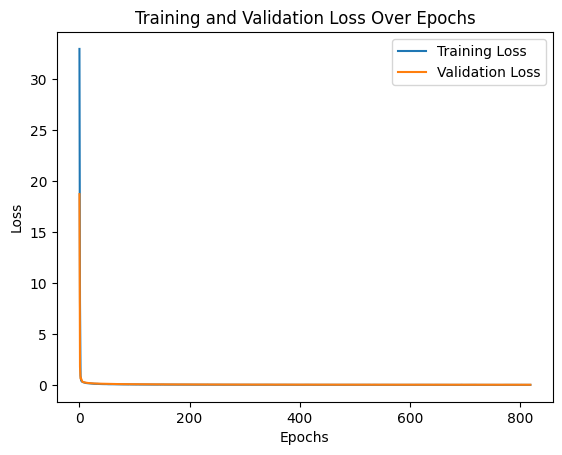

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Austin Nolte 11/20

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
FCNN Model - RMSE: 0.2034, R²: 0.9413, MAPE: 2.1577%


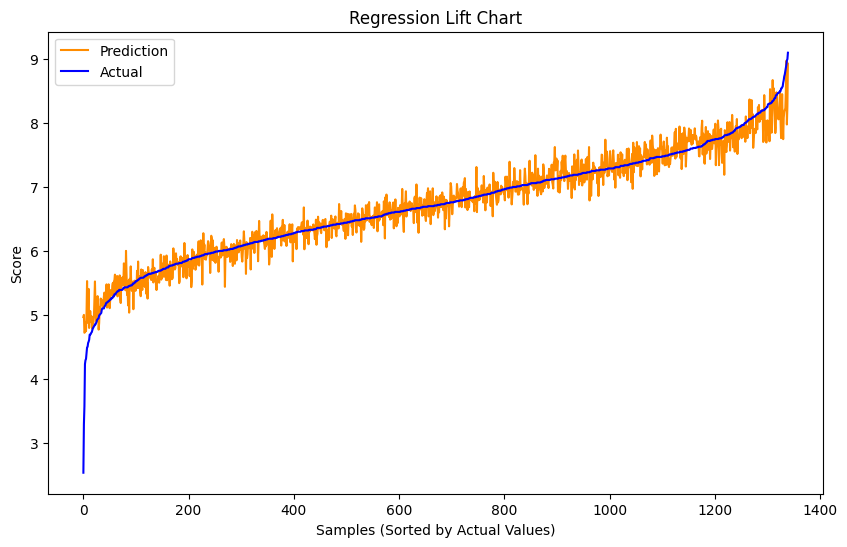

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Austin Nolte 11/20

#### HyperParameter tuning with keras tuner (model 4)

In [ ]:
!pip install -q -U keras-tuner

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras_tuner import RandomSearch

input_shape = X_train.shape[1]
def build_model(hp):
    model = Sequential()

    # Input layer
    model.add(Input(shape=(input_shape,)))
    model.add(BatchNormalization())

    model.add(Dense(units=hp.Int('units_1', min_value=512, max_value=1024, step=128), activation='relu'))
    model.add(BatchNormalization())

    model.add(Dense(units=hp.Int('units_2', min_value=256, max_value=512, step=64), activation='relu'))
    model.add(BatchNormalization())

    model.add(Dense(units=hp.Int('units_3', min_value=64, max_value=128, step=16), activation='sigmoid'))
    model.add(Dense(units=hp.Int('units_4', min_value=32, max_value=64, step=8), activation='sigmoid'))
    model.add(BatchNormalization())
    model.add(Dense(units=hp.Int('units_5', min_value=16, max_value=32, step=4), activation='relu'))
    model.add(Dense(units=hp.Int('units_6', min_value=2, max_value=16, step=2), activation='sigmoid'))
    model.add(BatchNormalization())

    # output layer
    model.add(Dense(1))

    # lower learing rate on Adam
    model.compile(
        optimizer=Adam(learning_rate=hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4, 1e-5, 1e-6])),
        loss='mean_squared_error',
        metrics=[tf.keras.metrics.RootMeanSquaredError()]
    )

    return model


# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_fnn_model_AdamSigmoid_keras_tuner.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Initialize Keras Tuner with RandomSearch
tuner = RandomSearch(
    build_model,
    objective='val_root_mean_squared_error',
    max_trials=10,
    executions_per_trial=1,
    directory='tuner_dir',
    project_name='anime_score_prediction2'
)

# Run the tuner search
tuner.search(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=2
)

# Retrieve the best model
best_model = tuner.get_best_models(num_models=1)[0]

# Evaluate the best model
best_model.evaluate(X_test, y_test, verbose=1)

# Display the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best hyperparameters found:")
print(f"Units in first layer: {best_hps.get('units_1')}")
print(f"Units in second layer: {best_hps.get('units_2')}")
print(f"Units in third layer: {best_hps.get('units_3')}")
print(f"Units in fourth layer: {best_hps.get('units_4')}")
print(f"Units in fifth layer: {best_hps.get('units_5')}")
print(f"Units in fifth layer: {best_hps.get('units_6')}")
print(f"Learning rate: {best_hps.get('learning_rate')}")

# Austin Nolte 11/22

Reloading Tuner from tuner_dir/anime_score_prediction2/tuner0.json


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 50 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0139 - root_mean_squared_error: 0.1175
Best hyperparameters found:
Units in first layer: 512
Units in second layer: 512
Units in third layer: 80
Units in fourth layer: 56
Units in fifth layer: 20
Units in fifth layer: 6
Learning rate: 0.01


#### Model 4 using parameters from keras tuner

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

input_shape = X_train.shape[1]

model = Sequential()

# Input layer
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(80, activation='sigmoid'))
model.add(Dense(56, activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dense(20, activation='relu'))
model.add(Dense(6, activation='sigmoid'))
model.add(BatchNormalization())

# output layer
model.add(Dense(1))

# lower learing rate on Adam
model.compile(optimizer=Adam(learning_rate=0.0001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_fnn_model_4_AdamSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/20

Epoch 1/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 46.0329 - root_mean_squared_error: 6.7846
Epoch 1: val_loss improved from inf to 49.79290, saving model to AustinNolte_fnn_model_4_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 46.0294 - root_mean_squared_error: 6.7843 - val_loss: 49.7929 - val_root_mean_squared_error: 7.0564
Epoch 2/1000
167/168 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 44.4142 - root_mean_squared_error: 6.6643
Epoch 2: val_loss improved from 49.79290 to 46.05980, saving model to AustinNolte_fnn_model_4_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 44.4105 - root_mean_squared_error: 6.6640 - val_loss: 46.0598 - val_root_mean_squared_error: 6.7867
Epoch 3/1000
167/168 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 43.5283 - root_mean_squared_error: 6.5976
Epoch 3: val_loss improved from 46.05980 to 43.42129, saving model to AustinNolte_fnn_model_4_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 43.

Test RMSE: 0.1591869592666626


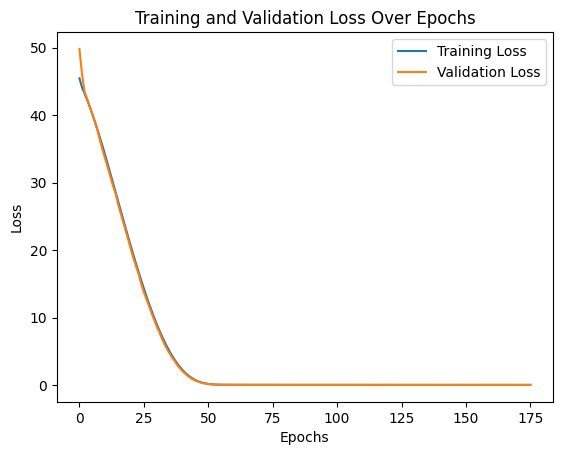

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Austin Nolte 11/20

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
FCNN Model - RMSE: 0.1592, R²: 0.9640, MAPE: 1.3090%


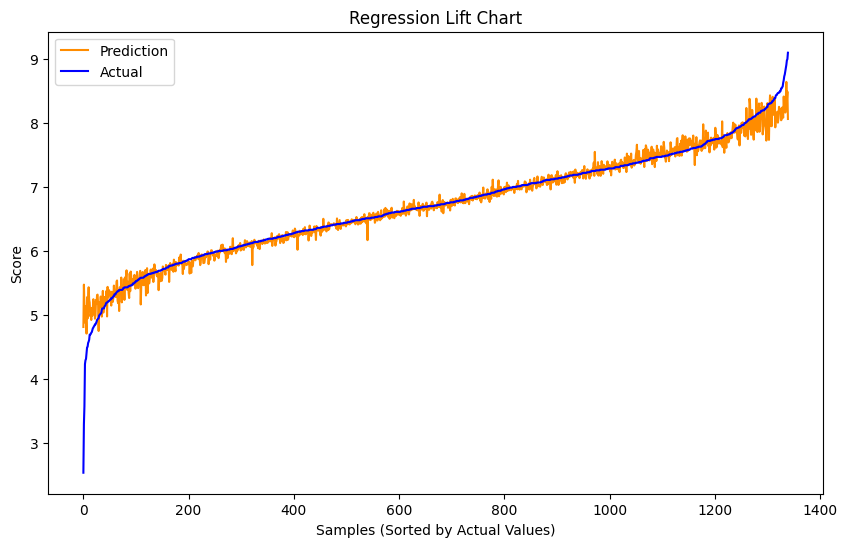

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Austin Nolte 11/20

### FCNN Model Design and Testing (Alan Lei)

#### Model 1

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(500, activation='tanh'))
model.add(BatchNormalization())


# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Alan_fnn_model_1.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Alan Lei 11/21

Epoch 1/1000
168/168 - 2s - 15ms/step - loss: 16.5656 - root_mean_squared_error: 4.0701 - val_loss: 1.6156 - val_root_mean_squared_error: 1.2711
Epoch 2/1000
168/168 - 1s - 5ms/step - loss: 1.3330 - root_mean_squared_error: 1.1545 - val_loss: 0.7584 - val_root_mean_squared_error: 0.8708
Epoch 3/1000
168/168 - 2s - 11ms/step - loss: 0.7619 - root_mean_squared_error: 0.8729 - val_loss: 0.5771 - val_root_mean_squared_error: 0.7597
Epoch 4/1000
168/168 - 2s - 13ms/step - loss: 0.6222 - root_mean_squared_error: 0.7888 - val_loss: 0.4707 - val_root_mean_squared_error: 0.6861
Epoch 5/1000
168/168 - 1s - 5ms/step - loss: 0.4804 - root_mean_squared_error: 0.6931 - val_loss: 0.4551 - val_root_mean_squared_error: 0.6746
Epoch 6/1000
168/168 - 1s - 8ms/step - loss: 0.4198 - root_mean_squared_error: 0.6479 - val_loss: 0.4497 - val_root_mean_squared_error: 0.6706
Epoch 7/1000
168/168 - 1s - 8ms/step - loss: 0.3808 - root_mean_squared_error: 0.6171 - val_loss: 0.3240 - val_root_mean_squared_error: 0.

Test RMSE: 0.18674606084823608


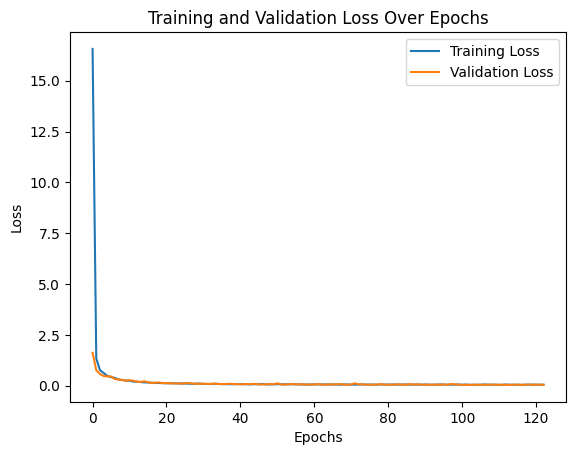

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Alan Lei 11/21


42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
FCNN Model - RMSE: 0.1867, R²: 0.9505, MAPE: 1.8767%


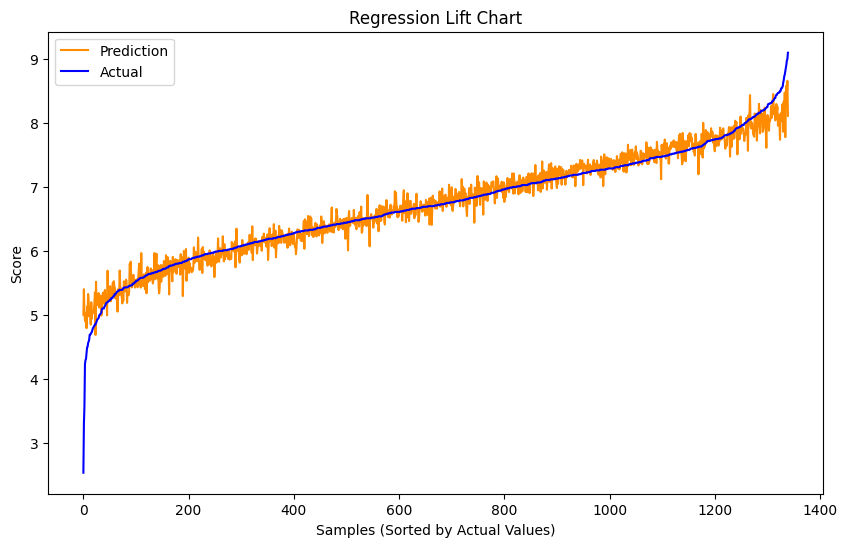

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Alan Lei 11/21


#### Model 2

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(750, activation='tanh'))
model.add(Dense(250, activation='tanh'))
model.add(BatchNormalization())


# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Alan_fnn_model_2.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)
# Alan Lei 11/21


Epoch 1/1000
168/168 - 4s - 22ms/step - loss: 10.1146 - root_mean_squared_error: 3.1804 - val_loss: 0.3556 - val_root_mean_squared_error: 0.5963
Epoch 2/1000
168/168 - 2s - 14ms/step - loss: 0.1979 - root_mean_squared_error: 0.4449 - val_loss: 0.1707 - val_root_mean_squared_error: 0.4131
Epoch 3/1000
168/168 - 2s - 15ms/step - loss: 0.1486 - root_mean_squared_error: 0.3855 - val_loss: 0.1508 - val_root_mean_squared_error: 0.3883
Epoch 4/1000
168/168 - 3s - 15ms/step - loss: 0.1464 - root_mean_squared_error: 0.3826 - val_loss: 0.1056 - val_root_mean_squared_error: 0.3250
Epoch 5/1000
168/168 - 2s - 13ms/step - loss: 0.1303 - root_mean_squared_error: 0.3610 - val_loss: 0.0741 - val_root_mean_squared_error: 0.2723
Epoch 6/1000
168/168 - 3s - 17ms/step - loss: 0.1199 - root_mean_squared_error: 0.3463 - val_loss: 0.1110 - val_root_mean_squared_error: 0.3332
Epoch 7/1000
168/168 - 1s - 9ms/step - loss: 0.1116 - root_mean_squared_error: 0.3341 - val_loss: 0.0737 - val_root_mean_squared_error:

Test RMSE: 0.22175651788711548


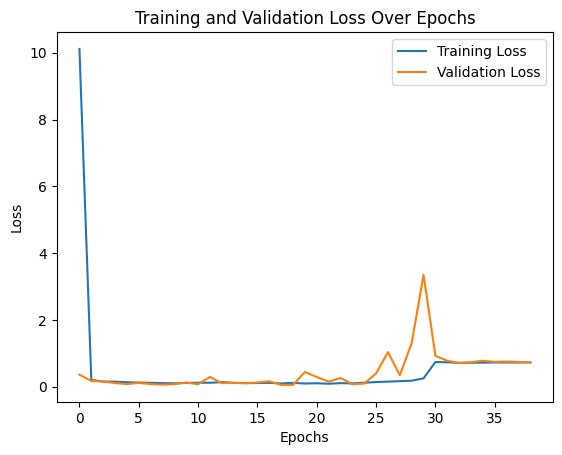

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Alan Lei 11/21


42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
FCNN Model - RMSE: 0.2218, R²: 0.9302, MAPE: 2.3209%


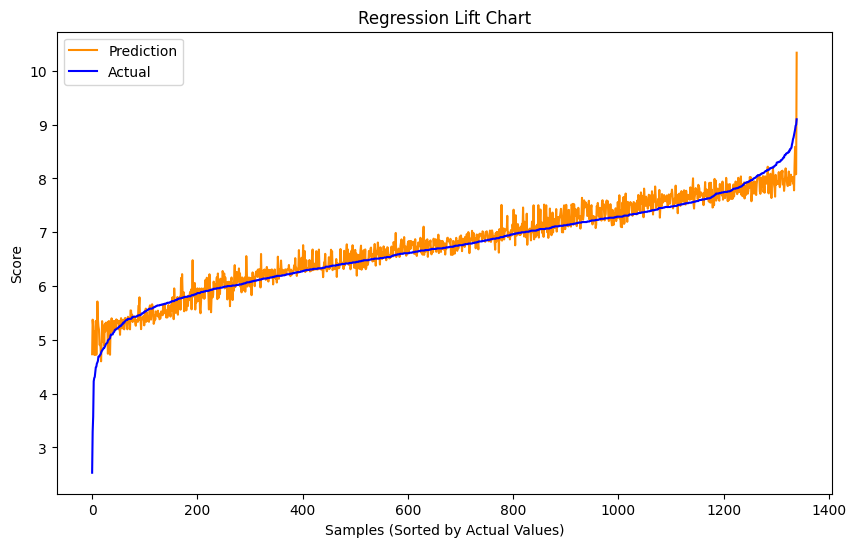

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Alan Lei 11/21


#### Model 3

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(500, activation='tanh'))
model.add(Dense(400, activation='tanh'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Alan_fnn_model_3.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Alan Lei 11/21


Epoch 1/1000

Epoch 1: val_loss improved from inf to 2.30291, saving model to Alan_fnn_model_3.keras
168/168 - 3s - 19ms/step - loss: 21.7303 - root_mean_squared_error: 4.6616 - val_loss: 2.3029 - val_root_mean_squared_error: 1.5175
Epoch 2/1000

Epoch 2: val_loss improved from 2.30291 to 0.97042, saving model to Alan_fnn_model_3.keras
168/168 - 3s - 19ms/step - loss: 3.2994 - root_mean_squared_error: 1.8164 - val_loss: 0.9704 - val_root_mean_squared_error: 0.9851
Epoch 3/1000

Epoch 3: val_loss improved from 0.97042 to 0.54509, saving model to Alan_fnn_model_3.keras
168/168 - 2s - 14ms/step - loss: 2.1076 - root_mean_squared_error: 1.4518 - val_loss: 0.5451 - val_root_mean_squared_error: 0.7383
Epoch 4/1000

Epoch 4: val_loss improved from 0.54509 to 0.40241, saving model to Alan_fnn_model_3.keras
168/168 - 2s - 11ms/step - loss: 1.6166 - root_mean_squared_error: 1.2714 - val_loss: 0.4024 - val_root_mean_squared_error: 0.6344
Epoch 5/1000

Epoch 5: val_loss improved from 0.40241 to 0.

Test RMSE: 0.17892944812774658


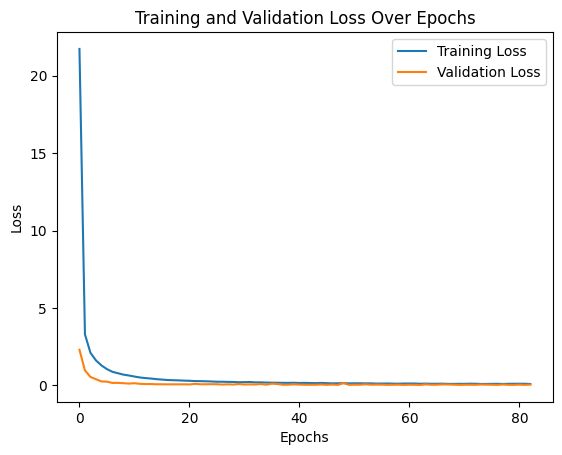

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Alan Lei 11/21


42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
FCNN Model - RMSE: 0.1789, R²: 0.9546, MAPE: 1.7336%


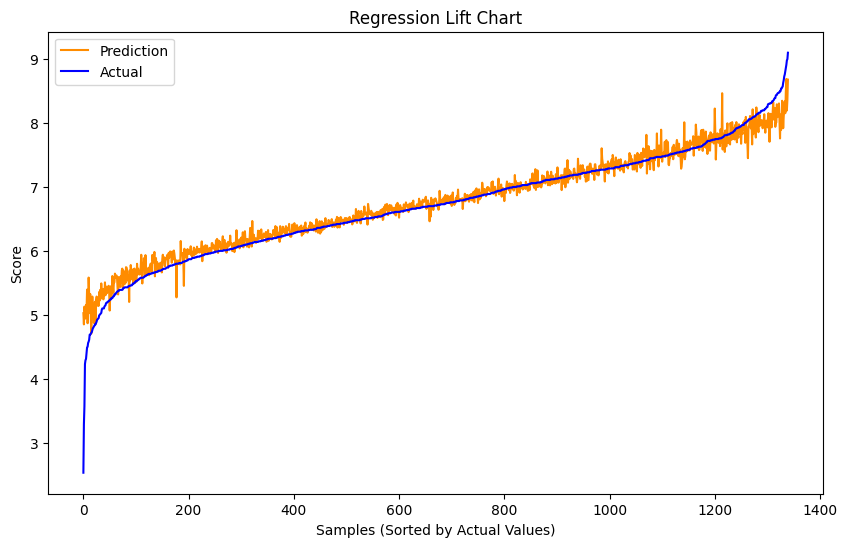

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Alan Lei 11/21


#### Model 4

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(512, activation='tanh'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Second hidden layer
model.add(Dense(256, activation='tanh'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Third hidden layer
model.add(Dense(128, activation='tanh'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.0015), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Alan_fnn_model_4.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Alan Lei 11/21


Epoch 1/1000

Epoch 1: val_loss improved from inf to 1.92842, saving model to Alan_fnn_model_4.keras
168/168 - 6s - 37ms/step - loss: 22.7195 - root_mean_squared_error: 4.7665 - val_loss: 1.9284 - val_root_mean_squared_error: 1.3887
Epoch 2/1000

Epoch 2: val_loss improved from 1.92842 to 0.85465, saving model to Alan_fnn_model_4.keras
168/168 - 4s - 24ms/step - loss: 3.2584 - root_mean_squared_error: 1.8051 - val_loss: 0.8546 - val_root_mean_squared_error: 0.9245
Epoch 3/1000

Epoch 3: val_loss improved from 0.85465 to 0.50659, saving model to Alan_fnn_model_4.keras
168/168 - 2s - 10ms/step - loss: 2.1870 - root_mean_squared_error: 1.4789 - val_loss: 0.5066 - val_root_mean_squared_error: 0.7118
Epoch 4/1000

Epoch 4: val_loss improved from 0.50659 to 0.30396, saving model to Alan_fnn_model_4.keras
168/168 - 2s - 10ms/step - loss: 1.6037 - root_mean_squared_error: 1.2664 - val_loss: 0.3040 - val_root_mean_squared_error: 0.5513
Epoch 5/1000

Epoch 5: val_loss improved from 0.30396 to 0.

Test RMSE: 0.1135510578751564


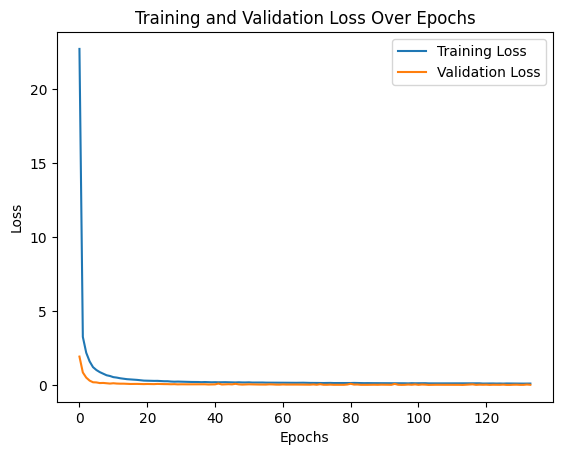

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Alan Lei 11/21


42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
FCNN Model - RMSE: 0.1136, R²: 0.9817, MAPE: 0.9998%


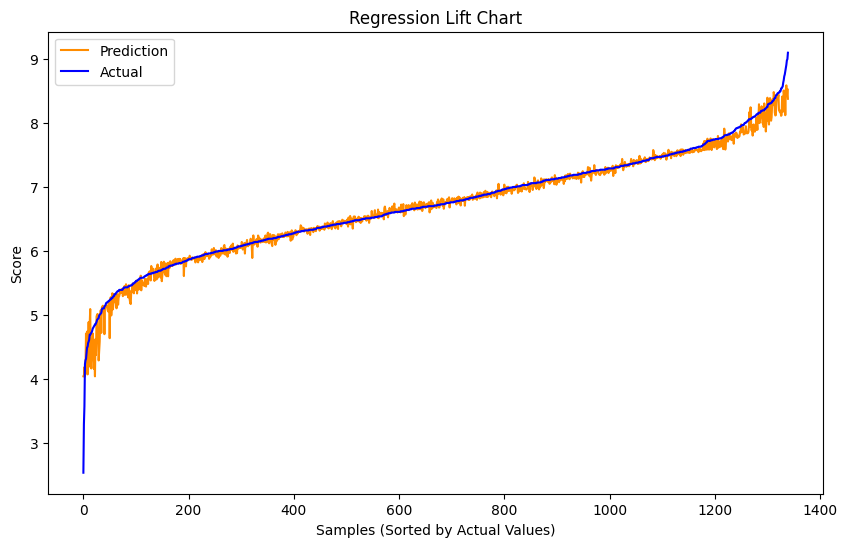

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Alan Lei 11/21


#### Model 5

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(500, activation='tanh'))
model.add(BatchNormalization())

model.add(Dense(400, activation='tanh'))
model.add(Dense(300, activation='tanh'))
model.add(Dense(200, activation='tanh'))
model.add(Dense(100, activation='tanh'))
model.add(Dense(50, activation='tanh'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=SGD(learning_rate=0.01), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Alan_fnn_model_5.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Alan Lei 11/21


Epoch 1/1000

Epoch 1: val_loss improved from inf to 0.40319, saving model to Alan_fnn_model_5.keras
168/168 - 2s - 14ms/step - loss: 3.7903 - root_mean_squared_error: 1.9469 - val_loss: 0.4032 - val_root_mean_squared_error: 0.6350
Epoch 2/1000

Epoch 2: val_loss improved from 0.40319 to 0.17674, saving model to Alan_fnn_model_5.keras
168/168 - 2s - 14ms/step - loss: 0.9238 - root_mean_squared_error: 0.9611 - val_loss: 0.1767 - val_root_mean_squared_error: 0.4204
Epoch 3/1000

Epoch 3: val_loss improved from 0.17674 to 0.16745, saving model to Alan_fnn_model_5.keras
168/168 - 1s - 8ms/step - loss: 0.6452 - root_mean_squared_error: 0.8032 - val_loss: 0.1675 - val_root_mean_squared_error: 0.4092
Epoch 4/1000

Epoch 4: val_loss improved from 0.16745 to 0.10646, saving model to Alan_fnn_model_5.keras
168/168 - 1s - 9ms/step - loss: 0.4985 - root_mean_squared_error: 0.7060 - val_loss: 0.1065 - val_root_mean_squared_error: 0.3263
Epoch 5/1000

Epoch 5: val_loss did not improve from 0.10646
1

Test RMSE: 0.19453078508377075


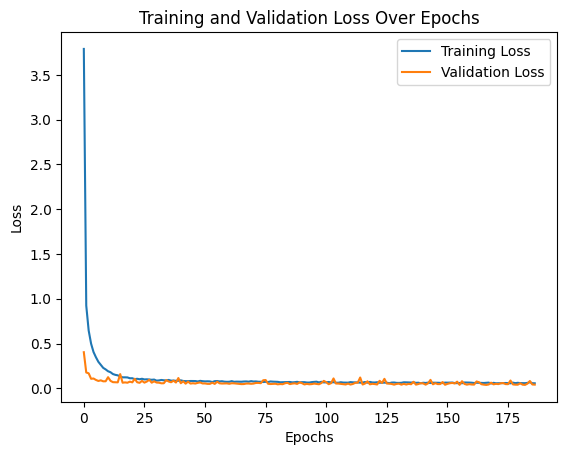

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Alan Lei 11/21


42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
FCNN Model - RMSE: 0.1945, R²: 0.9463, MAPE: 1.9756%


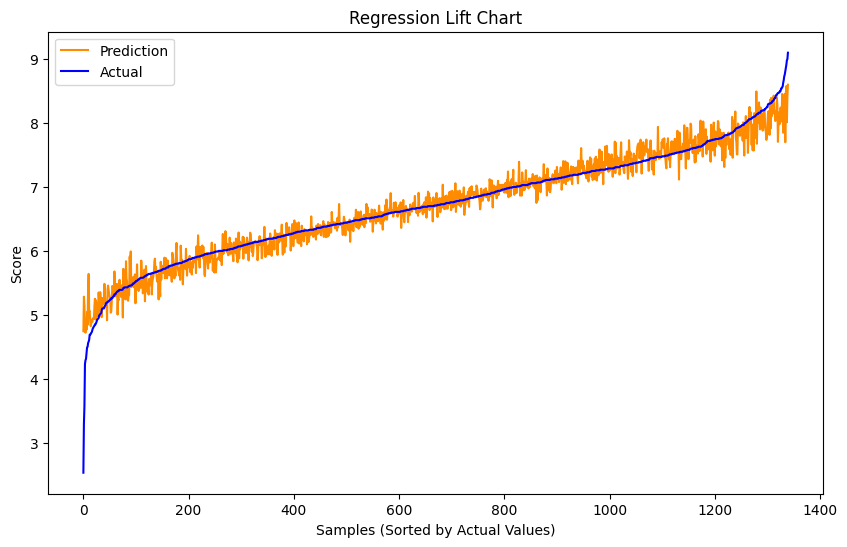

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Alan Lei 11/21


#### Model 6

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(512, activation='tanh'))
model.add(Dense(256, activation='tanh'))
model.add(Dense(128, activation='tanh'))
model.add(BatchNormalization())
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=SGD(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Alan_fnn_model_6.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Alan Lei 11/21


Epoch 1/1000

Epoch 1: val_loss improved from inf to 1.90905, saving model to Alan_fnn_model_6.keras
168/168 - 2s - 13ms/step - loss: 18.0215 - root_mean_squared_error: 4.2452 - val_loss: 1.9091 - val_root_mean_squared_error: 1.3817
Epoch 2/1000

Epoch 2: val_loss improved from 1.90905 to 0.55815, saving model to Alan_fnn_model_6.keras
168/168 - 3s - 16ms/step - loss: 2.8471 - root_mean_squared_error: 1.6873 - val_loss: 0.5582 - val_root_mean_squared_error: 0.7471
Epoch 3/1000

Epoch 3: val_loss improved from 0.55815 to 0.37592, saving model to Alan_fnn_model_6.keras
168/168 - 2s - 12ms/step - loss: 2.1324 - root_mean_squared_error: 1.4603 - val_loss: 0.3759 - val_root_mean_squared_error: 0.6131
Epoch 4/1000

Epoch 4: val_loss improved from 0.37592 to 0.32038, saving model to Alan_fnn_model_6.keras
168/168 - 1s - 7ms/step - loss: 1.9403 - root_mean_squared_error: 1.3929 - val_loss: 0.3204 - val_root_mean_squared_error: 0.5660
Epoch 5/1000

Epoch 5: val_loss improved from 0.32038 to 0.3

Test RMSE: 0.21157671511173248


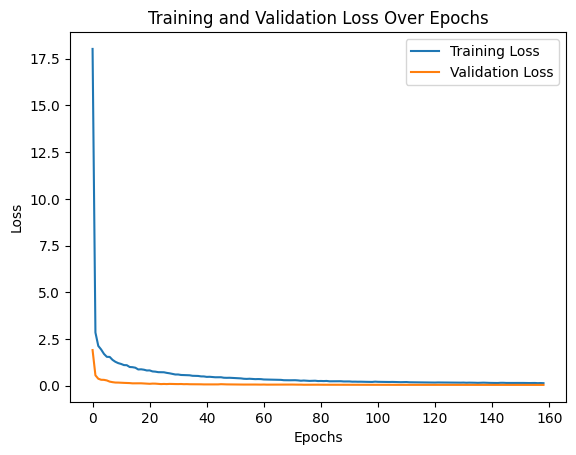

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
FCNN Model - RMSE: 0.2116, R²: 0.9365, MAPE: 1.9855%


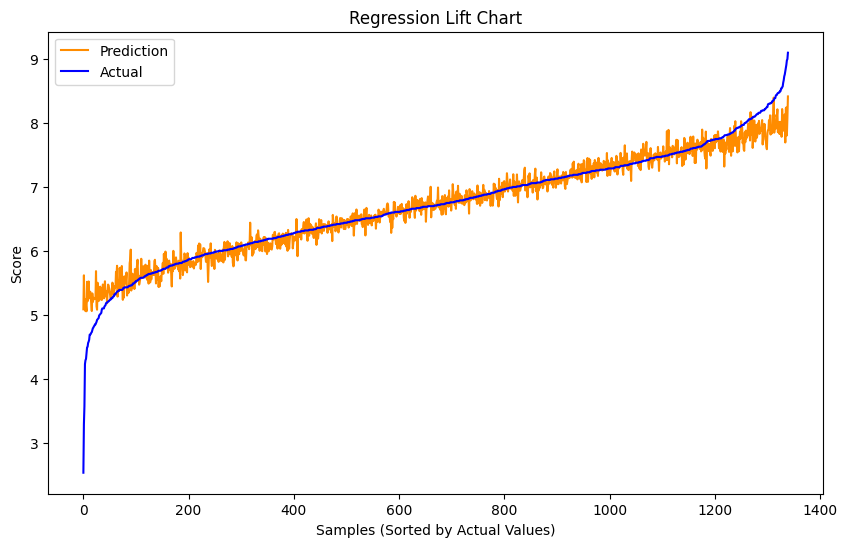

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Alan Lei 11/21


#### Model 7

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(500, activation='tanh'))
model.add(BatchNormalization())

model.add(Dense(400, activation='relu'))
model.add(Dense(300, activation='tanh'))
model.add(Dense(200, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))


# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=SGD(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Alan_fnn_model_7.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Alan Lei 11/21


Epoch 1/1000

Epoch 1: val_loss improved from inf to 1.90142, saving model to Alan_fnn_model_7.keras
168/168 - 3s - 20ms/step - loss: 19.1953 - root_mean_squared_error: 4.3812 - val_loss: 1.9014 - val_root_mean_squared_error: 1.3789
Epoch 2/1000

Epoch 2: val_loss improved from 1.90142 to 0.89594, saving model to Alan_fnn_model_7.keras
168/168 - 1s - 8ms/step - loss: 3.1818 - root_mean_squared_error: 1.7838 - val_loss: 0.8959 - val_root_mean_squared_error: 0.9465
Epoch 3/1000

Epoch 3: val_loss improved from 0.89594 to 0.62362, saving model to Alan_fnn_model_7.keras
168/168 - 1s - 8ms/step - loss: 2.2959 - root_mean_squared_error: 1.5152 - val_loss: 0.6236 - val_root_mean_squared_error: 0.7897
Epoch 4/1000

Epoch 4: val_loss improved from 0.62362 to 0.52451, saving model to Alan_fnn_model_7.keras
168/168 - 3s - 15ms/step - loss: 1.8836 - root_mean_squared_error: 1.3724 - val_loss: 0.5245 - val_root_mean_squared_error: 0.7242
Epoch 5/1000

Epoch 5: val_loss improved from 0.52451 to 0.45

Test RMSE: 0.19788184762001038


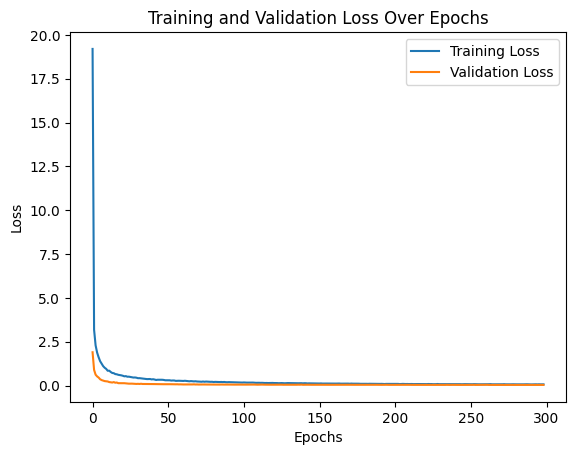

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
FCNN Model - RMSE: 0.1979, R²: 0.9444, MAPE: 2.0297%


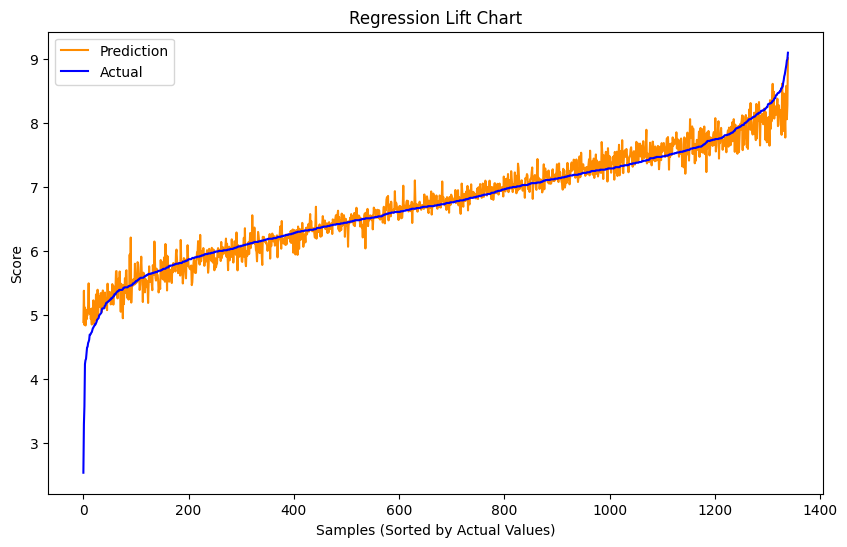

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Alan Lei 11/21


#### Model 8

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(600, activation='tanh'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(400, activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(200, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))


# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Alan_fnn_model_8.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Alan Lei 11/21


In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Alan Lei 11/21


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Alan Lei 11/21


#### Model 9

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(600, activation='tanh'))
model.add(Dense(500, activation='tanh'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(400, activation='sigmoid'))
model.add(Dense(300, activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(200, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.0001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_fnn_model_9.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Alan Lei 11/21


In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Alan Lei 11/21


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Alan Lei 11/21


#### Model 10

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(512, activation='tanh'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(256, activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=SGD(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_fnn_model_10.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Alan Lei 11/21


In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Alan Lei 11/21


### FCNN Model Design and Testing (Nishan Maharjan)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Second hidden layer
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

# Third hidden layer
model.add(Dense(64, activation='relu'))
model.add(BatchNormalization())

# Output layer for regression
model.add(Dense(1))

# Compile the model with a different learning rate
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback for controlling overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# ReduceLROnPlateau callback for dynamic learning rate adjustment
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=500,
    batch_size=64,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])
# Nishan Maharjan 11/21

Epoch 1/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 43.4091 - root_mean_squared_error: 6.5870 - val_loss: 33.1459 - val_root_mean_squared_error: 5.7573 - learning_rate: 0.0010
Epoch 2/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 26.5370 - root_mean_squared_error: 5.1417 - val_loss: 12.1697 - val_root_mean_squared_error: 3.4885 - learning_rate: 0.0010
Epoch 3/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 7.5736 - root_mean_squared_error: 2.7348 - val_loss: 2.2332 - val_root_mean_squared_error: 1.4944 - learning_rate: 0.0010
Epoch 4/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 1.5529 - root_mean_squared_error: 1.2452 - val_loss: 0.9565 - val_root_mean_squared_error: 0.9780 - learning_rate: 0.0010
Epoch 5/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.9806 - root_mean_squared_error: 0.9901 - val_loss: 0.7826 - val_root_mean_squared_error: 0.8847 - learning_rate: 0.0010
Epoch 6/500
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.7946 - root_mean_squared_erro

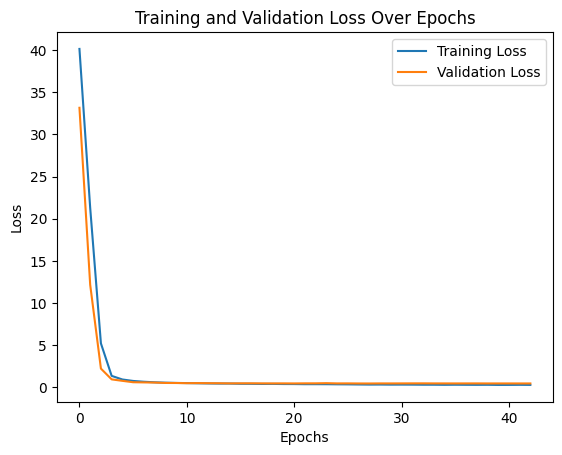

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Nishan Maharjan 11/21


42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
FCNN Model - RMSE: 0.6850, R²: 0.3340, MAPE: 8.1684%


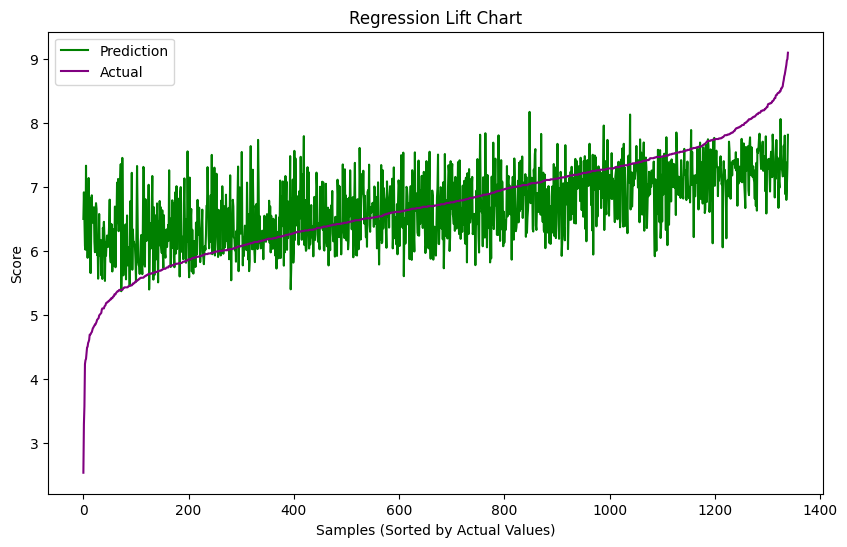

In [ ]:
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='green')
    plt.plot(t['y'].tolist(), label='Actual', color='purple')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Nishan Maharjan 11/21


**Hybrid Model (Nishan Maharjan)**

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D, Concatenate, GlobalAveragePooling1D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define input shapes for both CNN and FCNN branches
cnn_input_shape = X_train_cnn.shape[1:]
fcnn_input_shape = X_train.shape[1]

# CNN branch
cnn_input = Input(shape=cnn_input_shape, name='CNN_Input')
x = Conv1D(filters=32, kernel_size=3, activation='relu', padding='same')(cnn_input)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.2)(x)

x = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.2)(x)

x = GlobalAveragePooling1D()(x)

# FCNN branch
fcnn_input = Input(shape=(fcnn_input_shape,), name='FCNN_Input')
y = Dense(256, activation='relu')(fcnn_input)
y = BatchNormalization()(y)
y = Dropout(0.3)(y)

y = Dense(128, activation='relu')(y)
y = BatchNormalization()(y)
y = Dropout(0.3)(y)

# Concatenate the CNN and FCNN outputs
combined = Concatenate()([x, y])

# Final dense layers for regression
z = Dense(64, activation='relu')(combined)
z = BatchNormalization()(z)
z = Dropout(0.3)(z)

z = Dense(32, activation='relu')(z)
z = Dropout(0.2)(z)

# Output layer for regression
output = Dense(1, name='Output')(z)

# Define the model
hybrid_model = Model(inputs=[cnn_input, fcnn_input], outputs=output)

# Compile the model
hybrid_model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True)

# Train the model
history = hybrid_model.fit(
    [X_train_cnn, X_train],
    y_train,
    validation_data=([X_test_cnn, X_test], y_test),
    epochs=500,
    batch_size=64,
    callbacks=[early_stopping],
    verbose=2
)
# Nishan Maharjan 11/21


In [ ]:
# Evaluate the model
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

# Evaluation function
def evaluate_model(model, X_test_cnn, X_test, y_test):
    y_pred = model.predict([X_test_cnn, X_test])
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Regression lift chart
def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

# Evaluate the hybrid model and plot results
y_pred, rmse, r2, mape = evaluate_model(hybrid_model, X_test_cnn, X_test, y_test)
print(f"Hybrid Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Nishan Maharjan 11/21


In [ ]:
from sklearn.model_selection import train_test_split

titles_train, titles_test = train_test_split(
    titles, test_size=0.2, random_state=42, shuffle=True
)

results_df = pd.DataFrame({
    'Title': titles_test[:5].values,
    'Predicted Score': y_pred[:5].flatten(),
    'Actual Score': y_test[:5].flatten()
})

results_df
# Nishan Maharjan 11/21


## CNN Models

### Baseline CNN Model

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=64, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.3),

    # Second Conv1D layer
    Conv1D(filters=128, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.3),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(32, activation='relu'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)
# Tyler Burguillos 11/15/2024


Epoch 1/1000
168/168 - 25s - 150ms/step - loss: 19.3343 - root_mean_squared_error: 4.3971 - val_loss: 3.0259 - val_root_mean_squared_error: 1.7395
Epoch 2/1000
168/168 - 1s - 5ms/step - loss: 3.0176 - root_mean_squared_error: 1.7371 - val_loss: 0.8742 - val_root_mean_squared_error: 0.9350
Epoch 3/1000
168/168 - 1s - 5ms/step - loss: 2.0570 - root_mean_squared_error: 1.4342 - val_loss: 1.0058 - val_root_mean_squared_error: 1.0029
Epoch 4/1000
168/168 - 2s - 9ms/step - loss: 1.7179 - root_mean_squared_error: 1.3107 - val_loss: 0.7846 - val_root_mean_squared_error: 0.8858
Epoch 5/1000
168/168 - 2s - 9ms/step - loss: 1.5591 - root_mean_squared_error: 1.2486 - val_loss: 0.6672 - val_root_mean_squared_error: 0.8168
Epoch 6/1000
168/168 - 2s - 13ms/step - loss: 1.3634 - root_mean_squared_error: 1.1676 - val_loss: 0.5521 - val_root_mean_squared_error: 0.7431
Epoch 7/1000
168/168 - 1s - 6ms/step - loss: 1.2244 - root_mean_squared_error: 1.1065 - val_loss: 0.6245 - val_root_mean_squared_error: 0

Test RMSE: 0.6217171549797058


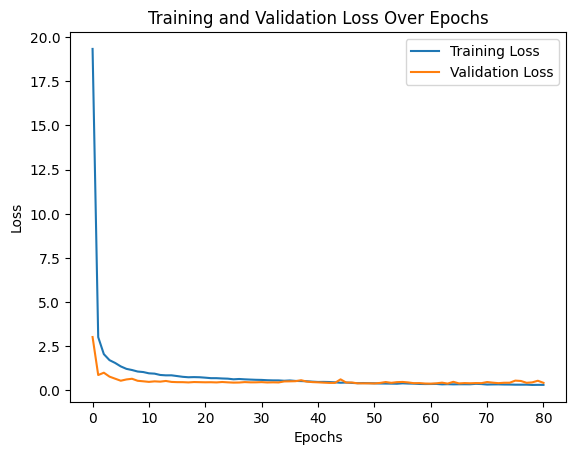

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Tyler Burguillos 11/15/2024


42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step
CNN Model - RMSE: 0.6217, R²: 0.4514, MAPE: 7.4526%


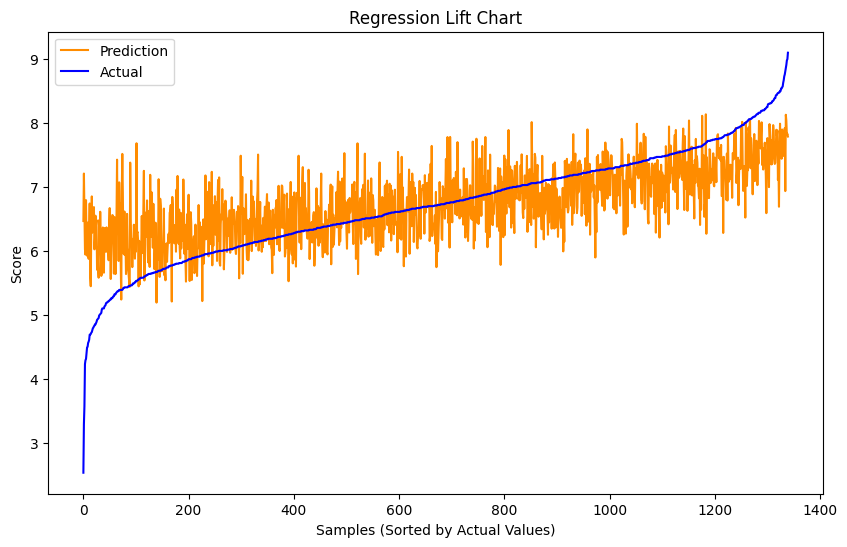

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
# Tyler Burguillos 11/15/2024


### CNN Model Design and Testing (Tyler Burguillos)

#### Model 1

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer with more filters and larger kernel size
    Conv1D(filters=128, kernel_size=5, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Second Conv1D layer with additional complexity
    Conv1D(filters=256, kernel_size=5, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Third Conv1D layer
    Conv1D(filters=128, kernel_size=3, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.1),
    Dense(64, activation='relu'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_cnn_model_1.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Tyler Burguillos 11/15/2024


Epoch 1/1000

Epoch 1: val_loss improved from inf to 2.76516, saving model to Tyler_cnn_model_1.keras
168/168 - 28s - 167ms/step - loss: 7.3393 - root_mean_squared_error: 2.7091 - val_loss: 2.7652 - val_root_mean_squared_error: 1.6629
Epoch 2/1000

Epoch 2: val_loss improved from 2.76516 to 0.80244, saving model to Tyler_cnn_model_1.keras
168/168 - 2s - 14ms/step - loss: 1.0974 - root_mean_squared_error: 1.0476 - val_loss: 0.8024 - val_root_mean_squared_error: 0.8958
Epoch 3/1000

Epoch 3: val_loss improved from 0.80244 to 0.69783, saving model to Tyler_cnn_model_1.keras
168/168 - 2s - 14ms/step - loss: 0.9199 - root_mean_squared_error: 0.9591 - val_loss: 0.6978 - val_root_mean_squared_error: 0.8354
Epoch 4/1000

Epoch 4: val_loss did not improve from 0.69783
168/168 - 2s - 11ms/step - loss: 0.8466 - root_mean_squared_error: 0.9201 - val_loss: 0.7501 - val_root_mean_squared_error: 0.8661
Epoch 5/1000

Epoch 5: val_loss improved from 0.69783 to 0.57406, saving model to Tyler_cnn_model_1

Test RMSE: 0.6629667282104492


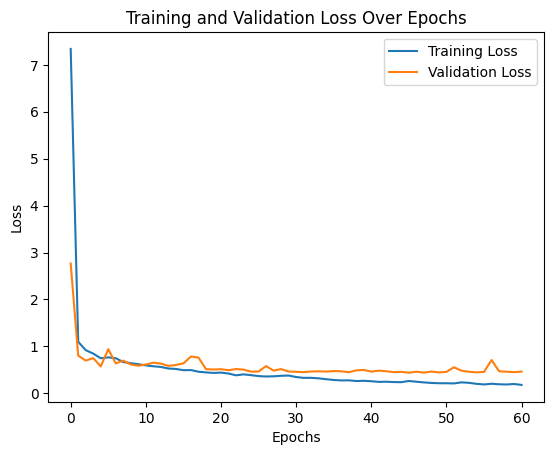

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Tyler Burguillos 11/15/2024


42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step
CNN Model - RMSE: 0.6630, R²: 0.3761, MAPE: 7.9210%


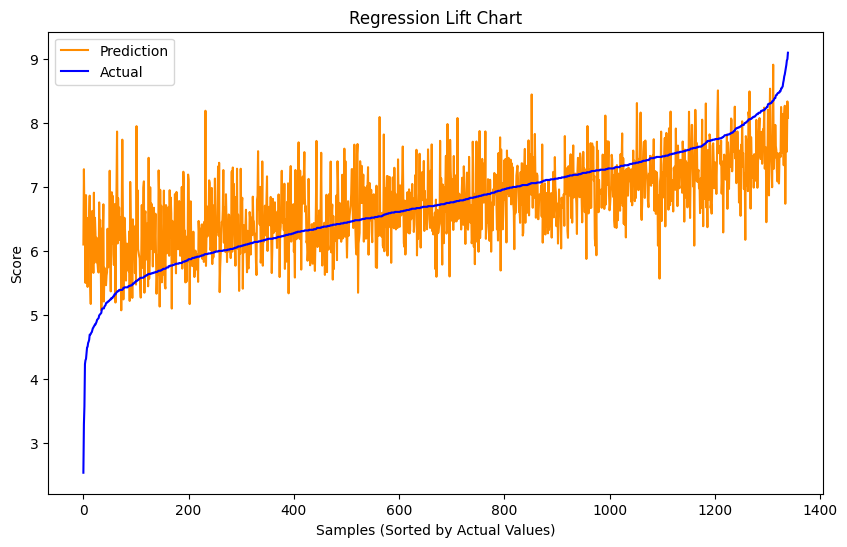

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
# Tyler Burguillos 11/15/2024


#### Model 2

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First convolutional layer
    Conv1D(filters=64, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.3),

    # Second convolutional layer
    Conv1D(filters=128, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.3),

    # Third convolutional layer
    Conv1D(filters=256, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.3),

    # Fourth convolutional layer
    Conv1D(filters=512, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.3),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # First dense layer
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    # Second dense layer
    Dense(64, activation='relu'),
    Dropout(0.3),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_cnn_model_2.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Tyler Burguillos 11/15/2024


Epoch 1/1000

Epoch 1: val_loss improved from inf to 1.88991, saving model to Tyler_cnn_model_2.keras
168/168 - 50s - 299ms/step - loss: 15.4564 - root_mean_squared_error: 3.9315 - val_loss: 1.8899 - val_root_mean_squared_error: 1.3747
Epoch 2/1000

Epoch 2: val_loss did not improve from 1.88991
168/168 - 2s - 10ms/step - loss: 4.4587 - root_mean_squared_error: 2.1116 - val_loss: 1.8912 - val_root_mean_squared_error: 1.3752
Epoch 3/1000

Epoch 3: val_loss improved from 1.88991 to 1.37327, saving model to Tyler_cnn_model_2.keras
168/168 - 2s - 12ms/step - loss: 3.6752 - root_mean_squared_error: 1.9171 - val_loss: 1.3733 - val_root_mean_squared_error: 1.1719
Epoch 4/1000

Epoch 4: val_loss improved from 1.37327 to 0.77223, saving model to Tyler_cnn_model_2.keras
168/168 - 3s - 17ms/step - loss: 3.2032 - root_mean_squared_error: 1.7898 - val_loss: 0.7722 - val_root_mean_squared_error: 0.8788
Epoch 5/1000

Epoch 5: val_loss did not improve from 0.77223
168/168 - 3s - 17ms/step - loss: 2.80

Test RMSE: 0.6491801142692566


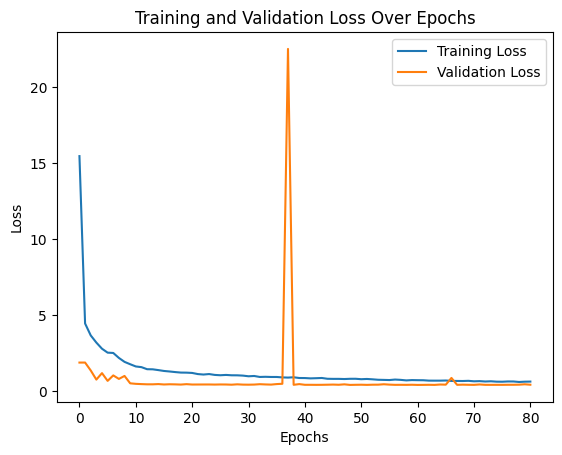

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Tyler Burguillos 11/15/2024


42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step
CNN Model - RMSE: 0.6492, R²: 0.4018, MAPE: 7.8277%


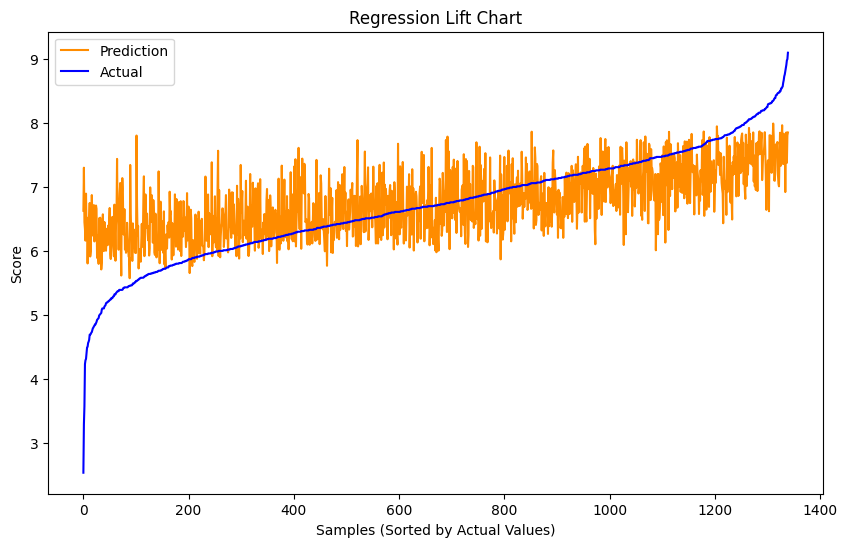

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
# Tyler Burguillos 11/15/2024


#### Model 3

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First convolutional layer
    Conv1D(filters=32, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # First dense layer
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    # Second dense layer
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_cnn_model_3.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Tyler Burguillos 11/15/2024


Epoch 1/1000

Epoch 1: val_loss improved from inf to 37.66483, saving model to Tyler_cnn_model_3.keras
168/168 - 10s - 58ms/step - loss: 41.2910 - root_mean_squared_error: 6.4258 - val_loss: 37.6648 - val_root_mean_squared_error: 6.1372
Epoch 2/1000

Epoch 2: val_loss improved from 37.66483 to 16.17720, saving model to Tyler_cnn_model_3.keras
168/168 - 1s - 4ms/step - loss: 27.4202 - root_mean_squared_error: 5.2364 - val_loss: 16.1772 - val_root_mean_squared_error: 4.0221
Epoch 3/1000

Epoch 3: val_loss improved from 16.17720 to 6.82070, saving model to Tyler_cnn_model_3.keras
168/168 - 1s - 7ms/step - loss: 13.9095 - root_mean_squared_error: 3.7295 - val_loss: 6.8207 - val_root_mean_squared_error: 2.6116
Epoch 4/1000

Epoch 4: val_loss improved from 6.82070 to 1.45348, saving model to Tyler_cnn_model_3.keras
168/168 - 1s - 4ms/step - loss: 6.1794 - root_mean_squared_error: 2.4858 - val_loss: 1.4535 - val_root_mean_squared_error: 1.2056
Epoch 5/1000

Epoch 5: val_loss did not improve f

Test RMSE: 0.6736741065979004


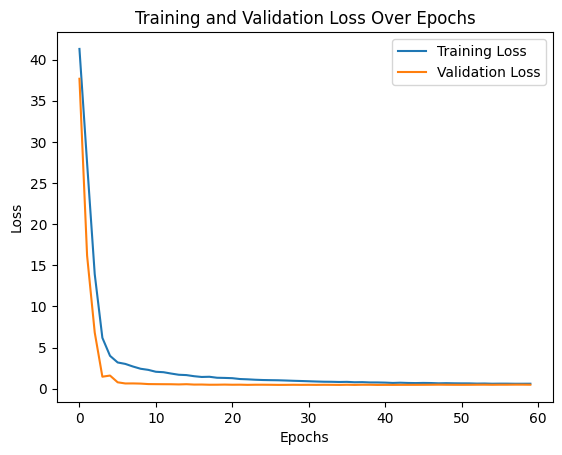

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Tyler Burguillos 11/15/2024


42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
CNN Model - RMSE: 0.6737, R²: 0.3558, MAPE: 8.0286%


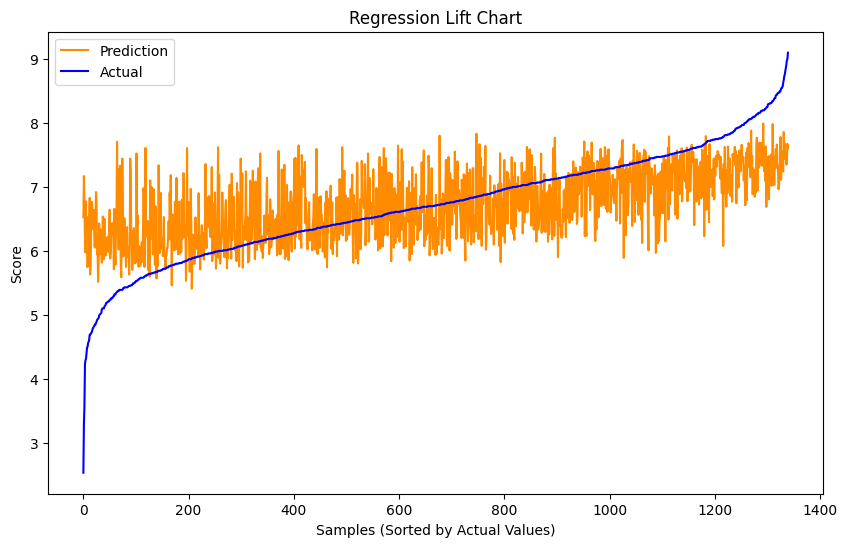

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
# Tyler Burguillos 11/15/2024


#### Model 4

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First convolutional layer
    Conv1D(filters=32, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    # First convolutional layer
    Conv1D(filters=64, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # First dense layer
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    # Second dense layer
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_cnn_model_4.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)

Epoch 1/1000

Epoch 1: val_loss improved from inf to 38.33822, saving model to Tyler_cnn_model_4.keras
168/168 - 23s - 137ms/step - loss: 41.5804 - root_mean_squared_error: 6.4483 - val_loss: 38.3382 - val_root_mean_squared_error: 6.1918
Epoch 2/1000

Epoch 2: val_loss improved from 38.33822 to 20.52249, saving model to Tyler_cnn_model_4.keras
168/168 - 4s - 21ms/step - loss: 28.5921 - root_mean_squared_error: 5.3472 - val_loss: 20.5225 - val_root_mean_squared_error: 4.5302
Epoch 3/1000

Epoch 3: val_loss improved from 20.52249 to 7.70545, saving model to Tyler_cnn_model_4.keras
168/168 - 2s - 11ms/step - loss: 14.1857 - root_mean_squared_error: 3.7664 - val_loss: 7.7055 - val_root_mean_squared_error: 2.7759
Epoch 4/1000

Epoch 4: val_loss improved from 7.70545 to 2.12277, saving model to Tyler_cnn_model_4.keras
168/168 - 2s - 13ms/step - loss: 5.8500 - root_mean_squared_error: 2.4187 - val_loss: 2.1228 - val_root_mean_squared_error: 1.4570
Epoch 5/1000

Epoch 5: val_loss improved from

Test RMSE: 0.6699541807174683


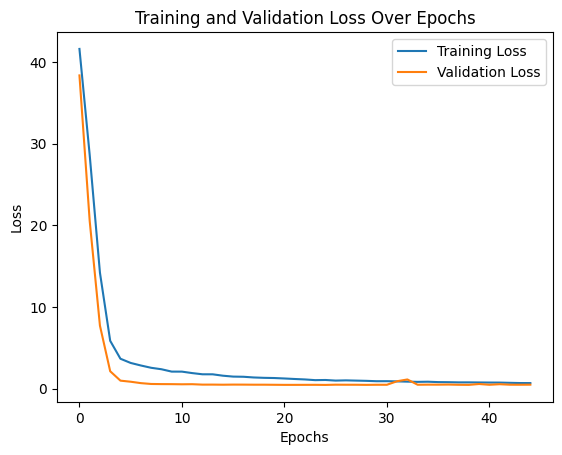

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step
CNN Model - RMSE: 0.6700, R²: 0.3629, MAPE: 8.0883%


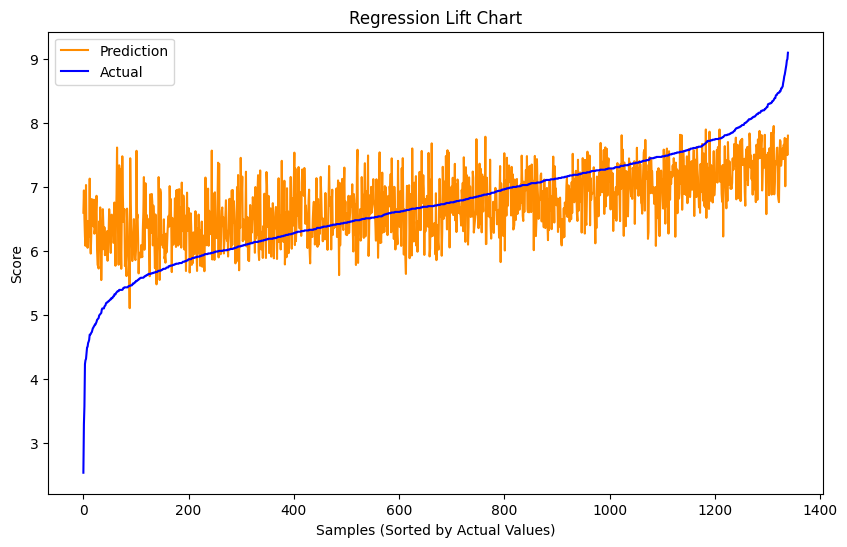

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

#### Model 5

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First convolutional layer
    Conv1D(filters=32, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    # First convolutional layer
    Conv1D(filters=64, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    # First convolutional layer
    Conv1D(filters=128, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # First dense layer
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    # Second dense layer
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_cnn_model_5.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)

Epoch 1/1000

Epoch 1: val_loss improved from inf to 33.13154, saving model to Tyler_cnn_model_5.keras
168/168 - 25s - 147ms/step - loss: 41.5541 - root_mean_squared_error: 6.4463 - val_loss: 33.1315 - val_root_mean_squared_error: 5.7560
Epoch 2/1000

Epoch 2: val_loss improved from 33.13154 to 20.97040, saving model to Tyler_cnn_model_5.keras
168/168 - 1s - 7ms/step - loss: 28.1633 - root_mean_squared_error: 5.3069 - val_loss: 20.9704 - val_root_mean_squared_error: 4.5793
Epoch 3/1000

Epoch 3: val_loss improved from 20.97040 to 7.02817, saving model to Tyler_cnn_model_5.keras
168/168 - 1s - 6ms/step - loss: 13.9759 - root_mean_squared_error: 3.7384 - val_loss: 7.0282 - val_root_mean_squared_error: 2.6511
Epoch 4/1000

Epoch 4: val_loss improved from 7.02817 to 1.39801, saving model to Tyler_cnn_model_5.keras
168/168 - 1s - 6ms/step - loss: 5.5860 - root_mean_squared_error: 2.3635 - val_loss: 1.3980 - val_root_mean_squared_error: 1.1824
Epoch 5/1000

Epoch 5: val_loss improved from 1.

Test RMSE: 0.6652436852455139


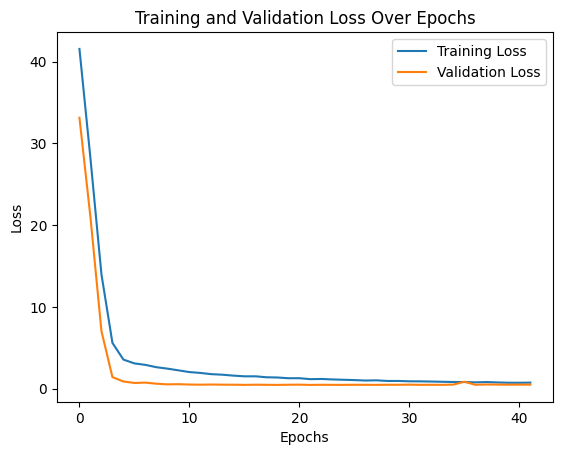

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step
CNN Model - RMSE: 0.6652, R²: 0.3719, MAPE: 7.9815%


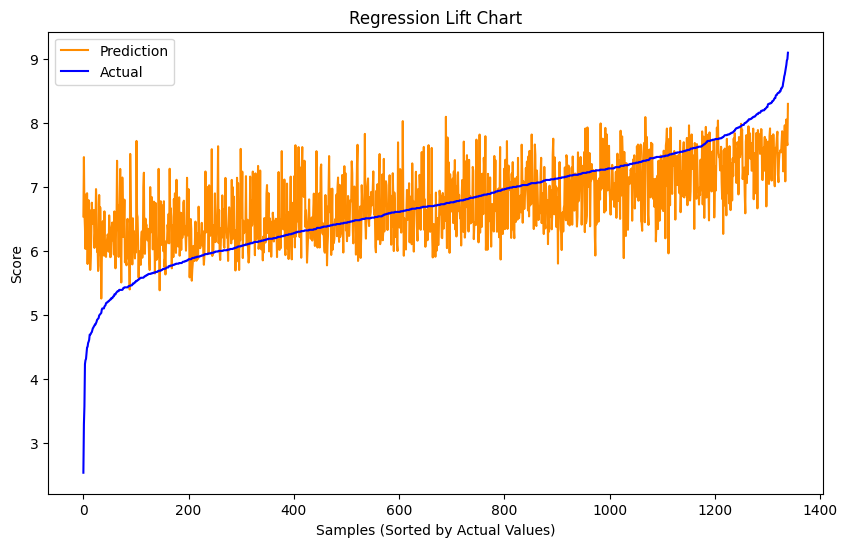

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

#### Model 6

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First convolutional layer
    Conv1D(filters=32, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    # First convolutional layer
    Conv1D(filters=64, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    # First convolutional layer
    Conv1D(filters=128, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # First dense layer
    Dense(300, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    # First dense layer
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    # Second dense layer
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_cnn_model_6.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)

Epoch 1/1000

Epoch 1: val_loss improved from inf to 31.78966, saving model to Tyler_cnn_model_6.keras
168/168 - 17s - 102ms/step - loss: 41.8558 - root_mean_squared_error: 6.4696 - val_loss: 31.7897 - val_root_mean_squared_error: 5.6382
Epoch 2/1000

Epoch 2: val_loss improved from 31.78966 to 19.85714, saving model to Tyler_cnn_model_6.keras
168/168 - 1s - 7ms/step - loss: 28.4676 - root_mean_squared_error: 5.3355 - val_loss: 19.8571 - val_root_mean_squared_error: 4.4561
Epoch 3/1000

Epoch 3: val_loss improved from 19.85714 to 6.53097, saving model to Tyler_cnn_model_6.keras
168/168 - 1s - 5ms/step - loss: 14.2208 - root_mean_squared_error: 3.7710 - val_loss: 6.5310 - val_root_mean_squared_error: 2.5556
Epoch 4/1000

Epoch 4: val_loss improved from 6.53097 to 2.54524, saving model to Tyler_cnn_model_6.keras
168/168 - 1s - 6ms/step - loss: 6.1224 - root_mean_squared_error: 2.4743 - val_loss: 2.5452 - val_root_mean_squared_error: 1.5954
Epoch 5/1000

Epoch 5: val_loss improved from 2.

Test RMSE: 0.6579459309577942


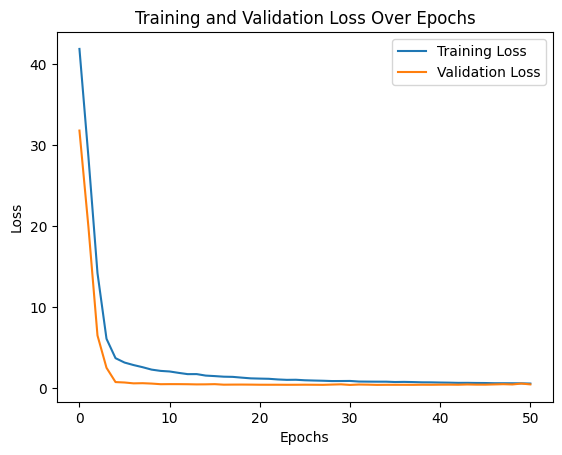

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step
CNN Model - RMSE: 0.6579, R²: 0.3856, MAPE: 7.9241%


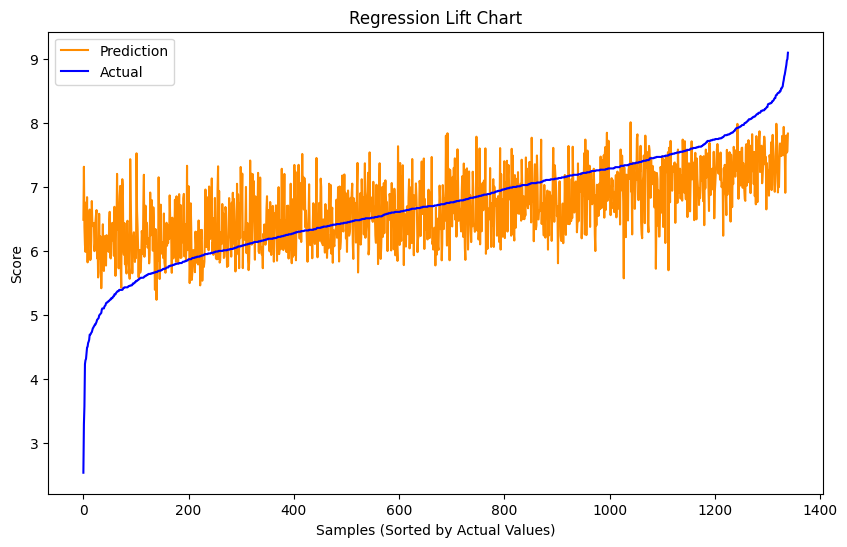

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

#### HyperParameter tuning with keras tuner (model 5)

In [ ]:
!pip install -q -U keras-tuner

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras_tuner import RandomSearch

# Define the model-building function for Keras Tuner
def build_model(hp):
    model = Sequential()

    # First convolutional layer
    model.add(Conv1D(
        filters=hp.Int('filters_1', min_value=16, max_value=64, step=16),
        kernel_size=hp.Choice('kernel_size_1', values=[3, 5]),
        activation='relu',
        input_shape=(X_train_cnn.shape[1], X_train_cnn.shape[2])
    ))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=2))

    # Second convolutional layer
    model.add(Conv1D(
        filters=hp.Int('filters_2', min_value=32, max_value=128, step=32),
        kernel_size=hp.Choice('kernel_size_2', values=[3, 5]),
        activation='relu'
    ))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=2))

    # Third convolutional layer
    model.add(Conv1D(
        filters=hp.Int('filters_3', min_value=64, max_value=256, step=64),
        kernel_size=hp.Choice('kernel_size_3', values=[3, 5]),
        activation='relu'
    ))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=2))

    # Flatten and dense layers
    model.add(Flatten())

    # First dense layer
    model.add(Dense(
        units=hp.Int('units_1', min_value=64, max_value=256, step=64),
        activation='relu'
    ))
    model.add(BatchNormalization())
    model.add(Dropout(hp.Float('dropout_1', min_value=0.2, max_value=0.5, step=0.1)))

    # Second dense layer
    model.add(Dense(
        units=hp.Int('units_2', min_value=32, max_value=128, step=32),
        activation='relu'
    ))
    model.add(BatchNormalization())
    model.add(Dropout(hp.Float('dropout_2', min_value=0.2, max_value=0.5, step=0.1)))

    # Output layer for regression
    model.add(Dense(1))

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=hp.Float('learning_rate', min_value=1e-4, max_value=1e-3, sampling='log')),
        loss='mean_squared_error',
        metrics=[tf.keras.metrics.RootMeanSquaredError()]
    )

    return model

# Initialize Keras Tuner with RandomSearch
tuner = RandomSearch(
    build_model,
    objective='val_root_mean_squared_error',
    max_trials=10,  # Number of hyperparameter configurations to try
    executions_per_trial=1,
    directory='tuner_results',
    project_name='anime_score_prediction'
)

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Search for the best hyperparameters
tuner.search(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)



Trial 10 Complete [00h 01m 32s]
val_root_mean_squared_error: 0.6205058097839355

Best val_root_mean_squared_error So Far: 0.6205058097839355
Total elapsed time: 00h 17m 33s


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 46 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


168/168 - 24s - 140ms/step - loss: 1.0631 - root_mean_squared_error: 1.0311 - val_loss: 0.4076 - val_root_mean_squared_error: 0.6384
Epoch 2/100
168/168 - 4s - 24ms/step - loss: 0.9915 - root_mean_squared_error: 0.9957 - val_loss: 0.4703 - val_root_mean_squared_error: 0.6858
Epoch 3/100
168/168 - 1s - 7ms/step - loss: 0.9275 - root_mean_squared_error: 0.9631 - val_loss: 0.4437 - val_root_mean_squared_error: 0.6661
Epoch 4/100
168/168 - 1s - 6ms/step - loss: 0.9096 - root_mean_squared_error: 0.9538 - val_loss: 0.4045 - val_root_mean_squared_error: 0.6360
Epoch 5/100
168/168 - 1s - 6ms/step - loss: 0.8934 - root_mean_squared_error: 0.9452 - val_loss: 0.4363 - val_root_mean_squared_error: 0.6605
Epoch 6/100
168/168 - 1s - 9ms/step - loss: 0.8891 - root_mean_squared_error: 0.9429 - val_loss: 0.3730 - val_root_mean_squared_error: 0.6107
Epoch 7/100
168/168 - 2s - 10ms/step - loss: 0.8718 - root_mean_squared_error: 0.9337 - val_loss: 0.3958 - val_root_mean_squared_error: 0.6292
Epoch 8/100
1

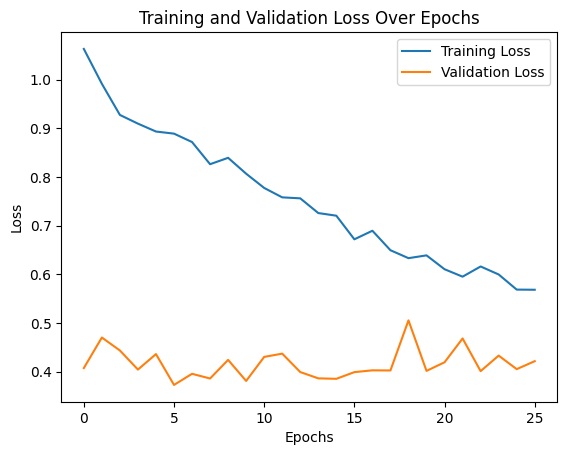

42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step
Best CNN Model - RMSE: 0.6107, R²: 0.4706, MAPE: 7.2814%


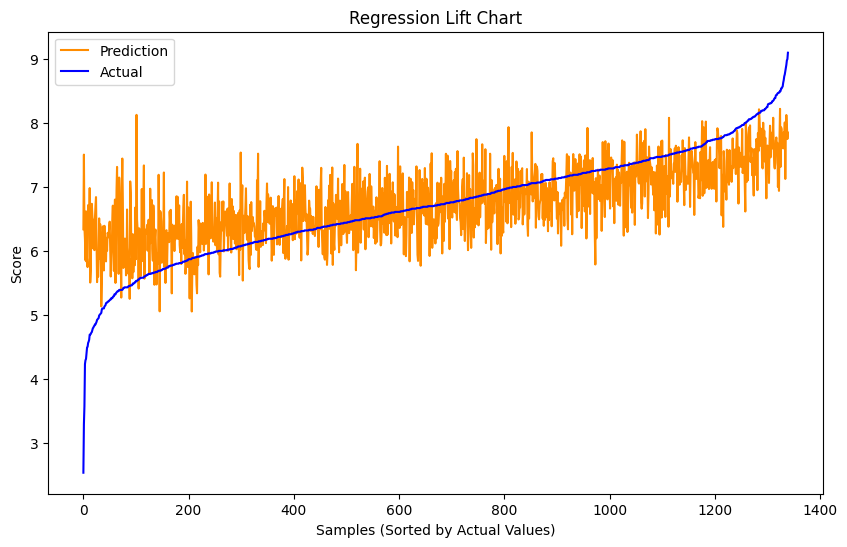

In [ ]:
# Retrieve the best model
best_model = tuner.get_best_models(num_models=1)[0]

# Plot training and validation loss
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

# Define the evaluate_model function
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

#Re-train the best model to capture the training history
history = best_model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

# Run the regression lift chart for the best model
y_pred, rmse, r2, mape = evaluate_model(best_model, X_test_cnn, y_test)
print(f"Best CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")
chart_regression(y_pred, y_test)

#### Model 7

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=64, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),

    # Second Conv1D layer
    Conv1D(filters=128, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(32, activation='relu'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_cnn_model_7.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)

Epoch 1/1000

Epoch 1: val_loss improved from inf to 1.63589, saving model to Tyler_cnn_model_7.keras
168/168 - 15s - 87ms/step - loss: 14.1952 - root_mean_squared_error: 3.7677 - val_loss: 1.6359 - val_root_mean_squared_error: 1.2790
Epoch 2/1000

Epoch 2: val_loss improved from 1.63589 to 0.60414, saving model to Tyler_cnn_model_7.keras
168/168 - 10s - 62ms/step - loss: 2.1152 - root_mean_squared_error: 1.4544 - val_loss: 0.6041 - val_root_mean_squared_error: 0.7773
Epoch 3/1000

Epoch 3: val_loss improved from 0.60414 to 0.53965, saving model to Tyler_cnn_model_7.keras
168/168 - 2s - 15ms/step - loss: 1.6923 - root_mean_squared_error: 1.3009 - val_loss: 0.5397 - val_root_mean_squared_error: 0.7346
Epoch 4/1000

Epoch 4: val_loss improved from 0.53965 to 0.53119, saving model to Tyler_cnn_model_7.keras
168/168 - 1s - 8ms/step - loss: 1.4919 - root_mean_squared_error: 1.2214 - val_loss: 0.5312 - val_root_mean_squared_error: 0.7288
Epoch 5/1000

Epoch 5: val_loss did not improve from 0

Test RMSE: 0.633487343788147


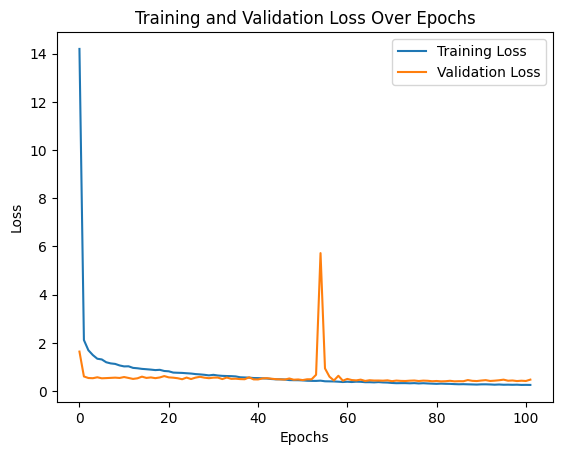

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
CNN Model - RMSE: 0.6335, R²: 0.4304, MAPE: 7.5385%


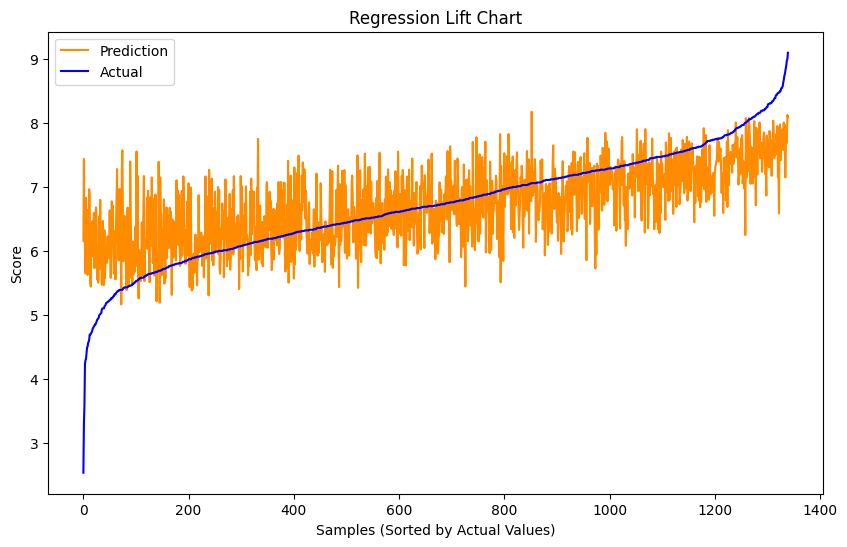

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

#### Model 8

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=64, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.1),

    # Second Conv1D layer
    Conv1D(filters=128, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.1),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(32, activation='relu'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_cnn_model_8.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)

Epoch 1/1000

Epoch 1: val_loss improved from inf to 1.77955, saving model to Tyler_cnn_model_8.keras
168/168 - 13s - 80ms/step - loss: 3.2817 - root_mean_squared_error: 1.8115 - val_loss: 1.7796 - val_root_mean_squared_error: 1.3340
Epoch 2/1000

Epoch 2: val_loss improved from 1.77955 to 0.76142, saving model to Tyler_cnn_model_8.keras
168/168 - 1s - 8ms/step - loss: 1.1563 - root_mean_squared_error: 1.0753 - val_loss: 0.7614 - val_root_mean_squared_error: 0.8726
Epoch 3/1000

Epoch 3: val_loss improved from 0.76142 to 0.71400, saving model to Tyler_cnn_model_8.keras
168/168 - 1s - 6ms/step - loss: 1.0598 - root_mean_squared_error: 1.0295 - val_loss: 0.7140 - val_root_mean_squared_error: 0.8450
Epoch 4/1000

Epoch 4: val_loss improved from 0.71400 to 0.51907, saving model to Tyler_cnn_model_8.keras
168/168 - 1s - 7ms/step - loss: 0.9036 - root_mean_squared_error: 0.9506 - val_loss: 0.5191 - val_root_mean_squared_error: 0.7205
Epoch 5/1000

Epoch 5: val_loss did not improve from 0.519

Test RMSE: 0.6015179753303528


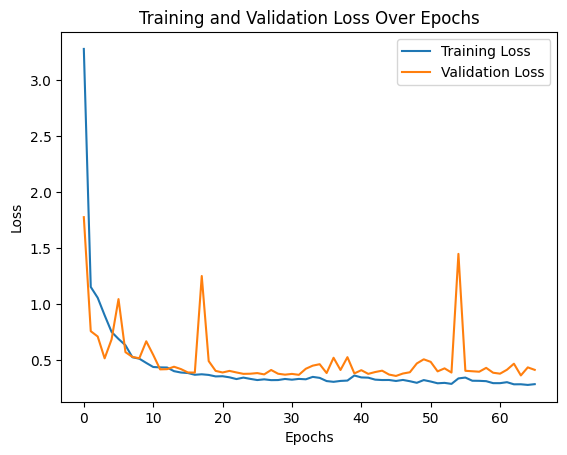

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
CNN Model - RMSE: 0.6015, R²: 0.4864, MAPE: 7.0848%


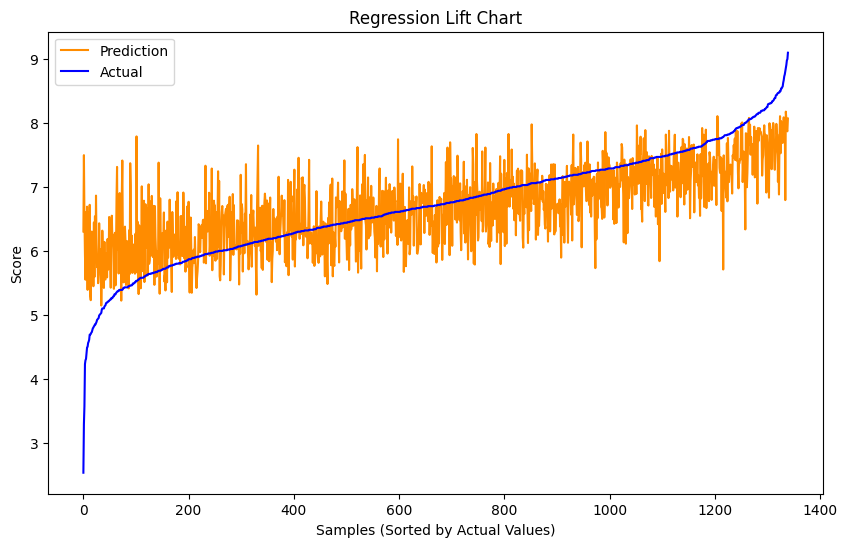

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

#### Model 9

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=64, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.1),

    # Second Conv1D layer
    Conv1D(filters=128, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.1),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(32, activation='relu'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.002), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_cnn_model_9.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)

Epoch 1/1000

Epoch 1: val_loss improved from inf to 2.70154, saving model to Tyler_cnn_model_9.keras
168/168 - 12s - 74ms/step - loss: 3.1563 - root_mean_squared_error: 1.7766 - val_loss: 2.7015 - val_root_mean_squared_error: 1.6436
Epoch 2/1000

Epoch 2: val_loss improved from 2.70154 to 0.86160, saving model to Tyler_cnn_model_9.keras
168/168 - 1s - 6ms/step - loss: 1.2367 - root_mean_squared_error: 1.1121 - val_loss: 0.8616 - val_root_mean_squared_error: 0.9282
Epoch 3/1000

Epoch 3: val_loss improved from 0.86160 to 0.72150, saving model to Tyler_cnn_model_9.keras
168/168 - 1s - 6ms/step - loss: 1.1102 - root_mean_squared_error: 1.0536 - val_loss: 0.7215 - val_root_mean_squared_error: 0.8494
Epoch 4/1000

Epoch 4: val_loss did not improve from 0.72150
168/168 - 1s - 6ms/step - loss: 0.9599 - root_mean_squared_error: 0.9798 - val_loss: 0.7435 - val_root_mean_squared_error: 0.8622
Epoch 5/1000

Epoch 5: val_loss improved from 0.72150 to 0.69411, saving model to Tyler_cnn_model_9.ker

Test RMSE: 0.6160370111465454


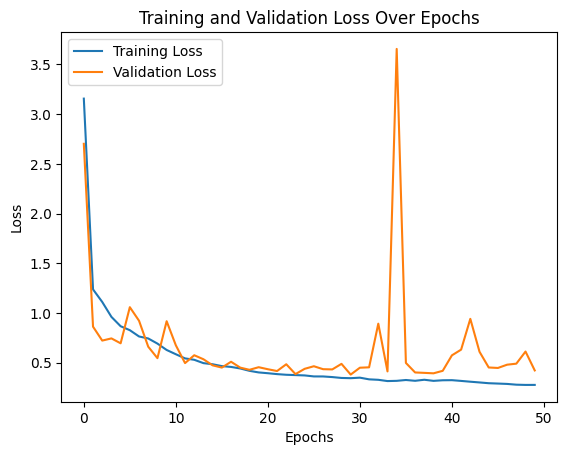

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
CNN Model - RMSE: 0.6160, R²: 0.4613, MAPE: 7.3028%


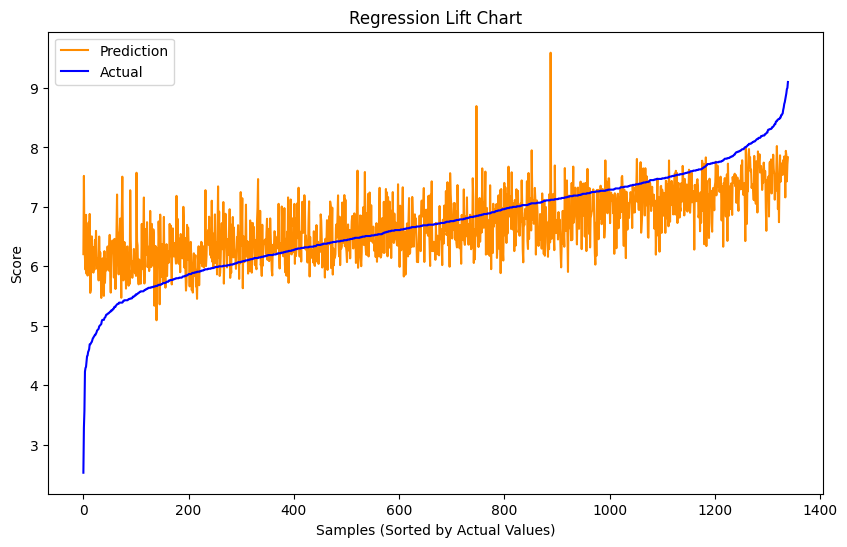

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

#### Model 10

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=64, kernel_size=5, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.1),

    # Second Conv1D layer
    Conv1D(filters=128, kernel_size=5, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.1),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(32, activation='relu'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.002), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_cnn_model_10.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)

Epoch 1/1000

Epoch 1: val_loss improved from inf to 1.60167, saving model to Tyler_cnn_model_10.keras
168/168 - 16s - 97ms/step - loss: 5.8287 - root_mean_squared_error: 2.4143 - val_loss: 1.6017 - val_root_mean_squared_error: 1.2656
Epoch 2/1000

Epoch 2: val_loss improved from 1.60167 to 0.71008, saving model to Tyler_cnn_model_10.keras
168/168 - 1s - 7ms/step - loss: 1.4513 - root_mean_squared_error: 1.2047 - val_loss: 0.7101 - val_root_mean_squared_error: 0.8427
Epoch 3/1000

Epoch 3: val_loss improved from 0.71008 to 0.64427, saving model to Tyler_cnn_model_10.keras
168/168 - 1s - 7ms/step - loss: 1.2731 - root_mean_squared_error: 1.1283 - val_loss: 0.6443 - val_root_mean_squared_error: 0.8027
Epoch 4/1000

Epoch 4: val_loss improved from 0.64427 to 0.51873, saving model to Tyler_cnn_model_10.keras
168/168 - 1s - 6ms/step - loss: 1.1147 - root_mean_squared_error: 1.0558 - val_loss: 0.5187 - val_root_mean_squared_error: 0.7202
Epoch 5/1000

Epoch 5: val_loss did not improve from 0

Test RMSE: 0.6456435322761536


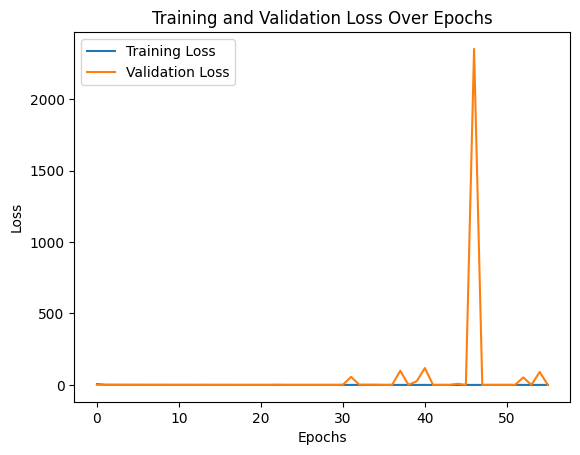

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
CNN Model - RMSE: 0.6456, R²: 0.4083, MAPE: 7.7286%


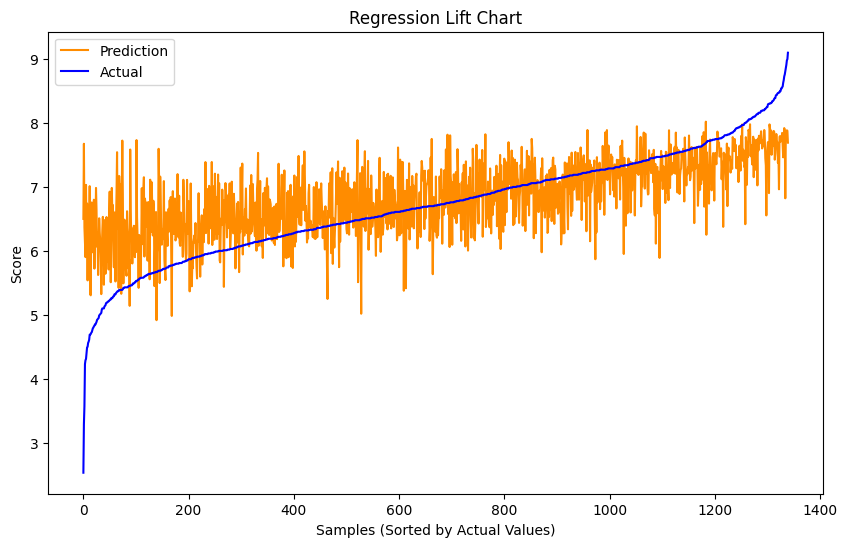

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

#### Model 11

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=64, kernel_size=5, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.1),

    # Second Conv1D layer
    Conv1D(filters=128, kernel_size=5, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.1),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(32, activation='relu'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.002), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_cnn_model_11.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)

Epoch 1/1000

Epoch 1: val_loss improved from inf to 1.23322, saving model to Tyler_cnn_model_11.keras
168/168 - 13s - 80ms/step - loss: 6.3236 - root_mean_squared_error: 2.5147 - val_loss: 1.2332 - val_root_mean_squared_error: 1.1105
Epoch 2/1000

Epoch 2: val_loss improved from 1.23322 to 0.67489, saving model to Tyler_cnn_model_11.keras
168/168 - 11s - 64ms/step - loss: 1.4360 - root_mean_squared_error: 1.1983 - val_loss: 0.6749 - val_root_mean_squared_error: 0.8215
Epoch 3/1000

Epoch 3: val_loss improved from 0.67489 to 0.53029, saving model to Tyler_cnn_model_11.keras
168/168 - 1s - 5ms/step - loss: 1.2334 - root_mean_squared_error: 1.1106 - val_loss: 0.5303 - val_root_mean_squared_error: 0.7282
Epoch 4/1000

Epoch 4: val_loss did not improve from 0.53029
168/168 - 1s - 4ms/step - loss: 1.1124 - root_mean_squared_error: 1.0547 - val_loss: 0.7407 - val_root_mean_squared_error: 0.8606
Epoch 5/1000

Epoch 5: val_loss improved from 0.53029 to 0.49393, saving model to Tyler_cnn_model_

Test RMSE: 0.6747027635574341


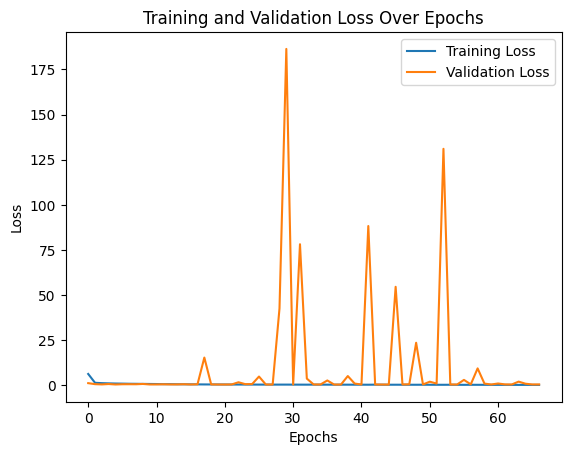

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
CNN Model - RMSE: 0.6747, R²: 0.3539, MAPE: 8.1005%


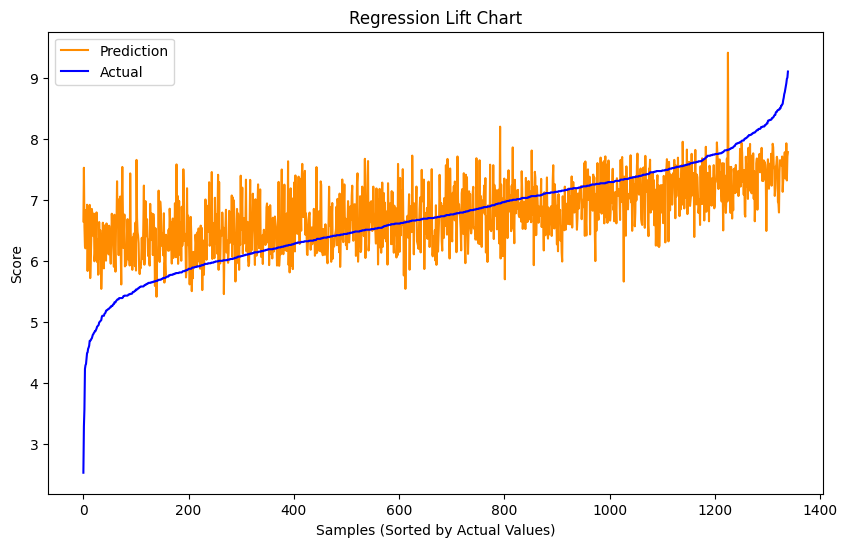

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

#### Model 4

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First convolutional layer
    Conv1D(filters=32, kernel_size=3, strides=2, padding='same', activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    # Second convolutional layer
    Conv1D(filters=64, kernel_size=3, strides=2, padding='same', activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    # Second convolutional layer
    Conv1D(filters=128, kernel_size=3, strides=2, padding='same', activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # First dense layer
    Dense(384, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),

    # Second dense layer
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.4),

    # Third dense layer
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_cnn_model_12.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)

Epoch 1/1000

Epoch 1: val_loss improved from inf to 37.38132, saving model to Tyler_cnn_model_12.keras
168/168 - 29s - 173ms/step - loss: 40.8959 - root_mean_squared_error: 6.3950 - val_loss: 37.3813 - val_root_mean_squared_error: 6.1140
Epoch 2/1000

Epoch 2: val_loss improved from 37.38132 to 18.57958, saving model to Tyler_cnn_model_12.keras
168/168 - 18s - 109ms/step - loss: 26.4608 - root_mean_squared_error: 5.1440 - val_loss: 18.5796 - val_root_mean_squared_error: 4.3104
Epoch 3/1000

Epoch 3: val_loss improved from 18.57958 to 5.87098, saving model to Tyler_cnn_model_12.keras
168/168 - 1s - 7ms/step - loss: 11.8388 - root_mean_squared_error: 3.4408 - val_loss: 5.8710 - val_root_mean_squared_error: 2.4230
Epoch 4/1000

Epoch 4: val_loss improved from 5.87098 to 1.77667, saving model to Tyler_cnn_model_12.keras
168/168 - 1s - 7ms/step - loss: 4.6616 - root_mean_squared_error: 2.1591 - val_loss: 1.7767 - val_root_mean_squared_error: 1.3329
Epoch 5/1000

Epoch 5: val_loss improved 

Test RMSE: 0.6733697056770325


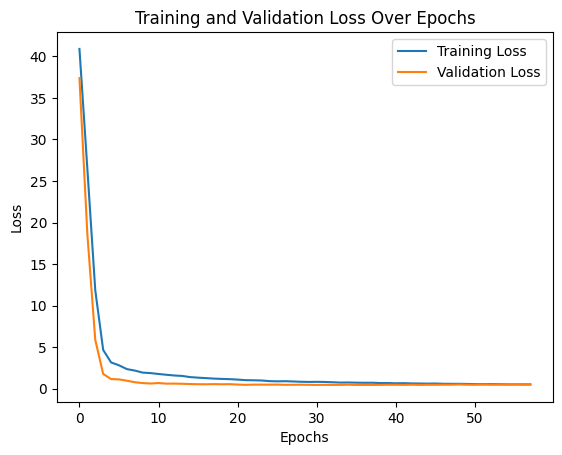

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step
CNN Model - RMSE: 0.6734, R²: 0.3564, MAPE: 8.0836%


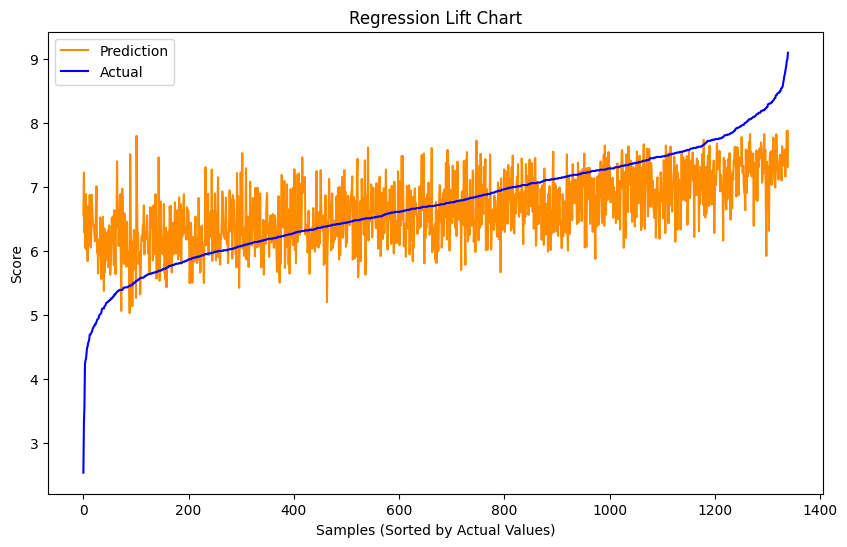

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

### CNN Model Design and Testing (Austin Nolte)

#### Model 1

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    Conv1D(filters=256, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    Conv1D(filters=128, kernel_size=3, activation='sigmoid'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),

    Conv1D(filters=64, kernel_size=3, activation='sigmoid'),
    BatchNormalization(),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dense(64, activation='sigmoid'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_cnn_model_1_AdamSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/21

Epoch 1/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 18.8309 - root_mean_squared_error: 4.2444
Epoch 1: val_loss improved from inf to 37.74364, saving model to AustinNolte_cnn_model_1_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 18.7729 - root_mean_squared_error: 4.2371 - val_loss: 37.7436 - val_root_mean_squared_error: 6.1436
Epoch 2/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4901 - root_mean_squared_error: 0.7000
Epoch 2: val_loss improved from 37.74364 to 1.90172, saving model to AustinNolte_cnn_model_1_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.4902 - root_mean_squared_error: 0.7000 - val_loss: 1.9017 - val_root_mean_squared_error: 1.3790
Epoch 3/1000
164/168 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4777 - root_mean_squared_error: 0.6908
Epoch 3: val_loss improved from 1.90172 to 0.50598, saving model to AustinNolte_cnn_model_1_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.4770 - root_

Test RMSE: 0.5937122702598572


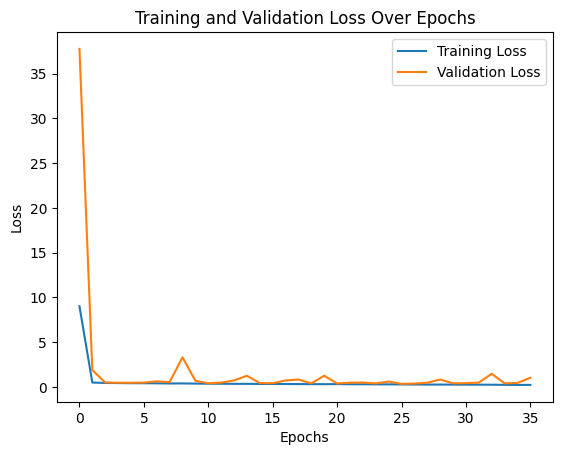

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

# Austin Nolte 11/21

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
CNN Model - RMSE: 0.5937, R²: 0.4997, MAPE: 7.0497%


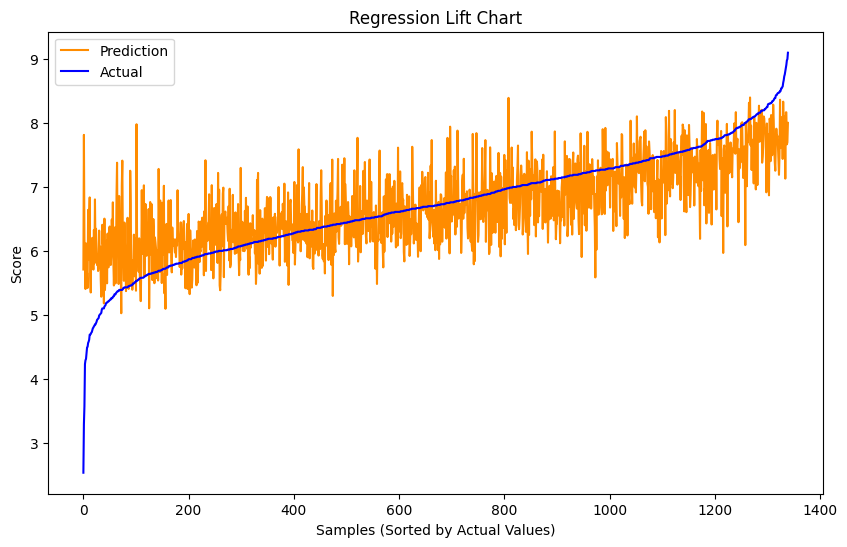

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

# Austin Nolte 11/21

#### Model 2

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    Conv1D(filters=256, kernel_size=5, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),

    Conv1D(filters=128, kernel_size=5, activation='sigmoid'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),

    Conv1D(filters=64, kernel_size=5, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),


    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dense(64, activation='sigmoid'),
    BatchNormalization(),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_cnn_model_2_AdamSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/21

Epoch 1/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 46.2339 - root_mean_squared_error: 6.7993
Epoch 1: val_loss improved from inf to 36.59268, saving model to AustinNolte_cnn_model_2_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step - loss: 46.2277 - root_mean_squared_error: 6.7989 - val_loss: 36.5927 - val_root_mean_squared_error: 6.0492
Epoch 2/1000
162/168 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 42.7736 - root_mean_squared_error: 6.5398
Epoch 2: val_loss improved from 36.59268 to 34.81927, saving model to AustinNolte_cnn_model_2_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 42.7300 - root_mean_squared_error: 6.5365 - val_loss: 34.8193 - val_root_mean_squared_error: 5.9008
Epoch 3/1000
166/168 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 39.1563 - root_mean_squared_error: 6.2574
Epoch 3: val_loss did not improve from 34.81927
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 39.1436 - root_mean_squared_error: 6.2564 - val_loss: 35.7737 - val_roo

Test RMSE: 0.6610476970672607


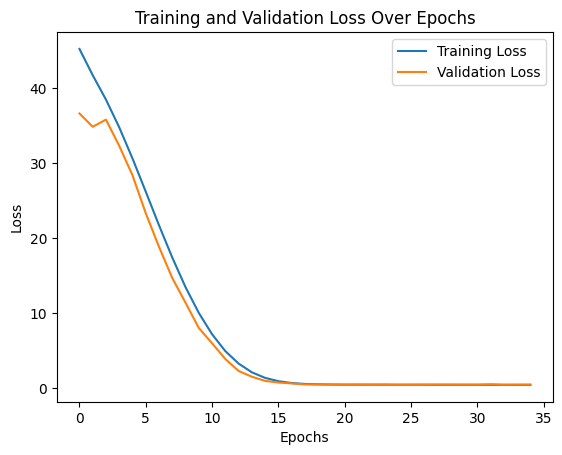

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

# Austin Nolte 11/21

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
CNN Model - RMSE: 0.6610, R²: 0.3798, MAPE: 7.9419%


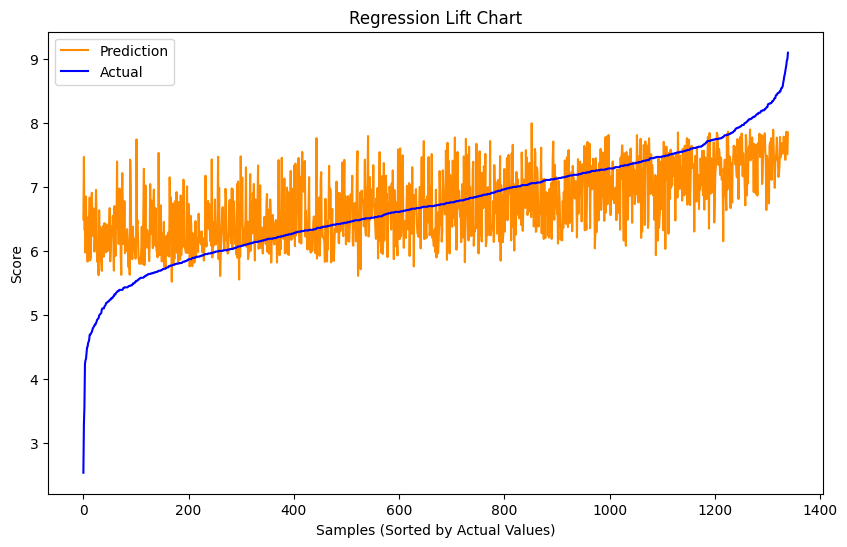

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

# Austin Nolte 11/21

#### Model 3

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    Conv1D(filters=256, kernel_size=3, activation='sigmoid'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    Conv1D(filters=512, kernel_size=5, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    Conv1D(filters=128, kernel_size=3, activation='sigmoid'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),


    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dense(64, activation='sigmoid'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_cnn_model_3_AdamSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/21

Epoch 1/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 44.7263 - root_mean_squared_error: 6.6834
Epoch 1: val_loss improved from inf to 54.29786, saving model to AustinNolte_cnn_model_3_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step - loss: 44.6990 - root_mean_squared_error: 6.6814 - val_loss: 54.2979 - val_root_mean_squared_error: 7.3687
Epoch 2/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 29.9026 - root_mean_squared_error: 5.4666
Epoch 2: val_loss improved from 54.29786 to 44.23928, saving model to AustinNolte_cnn_model_3_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 29.8875 - root_mean_squared_error: 5.4652 - val_loss: 44.2393 - val_root_mean_squared_error: 6.6513
Epoch 3/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 20.6045 - root_mean_squared_error: 4.5369
Epoch 3: val_loss improved from 44.23928 to 20.28376, saving model to AustinNolte_cnn_model_3_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 20.

Test RMSE: 0.46674320101737976


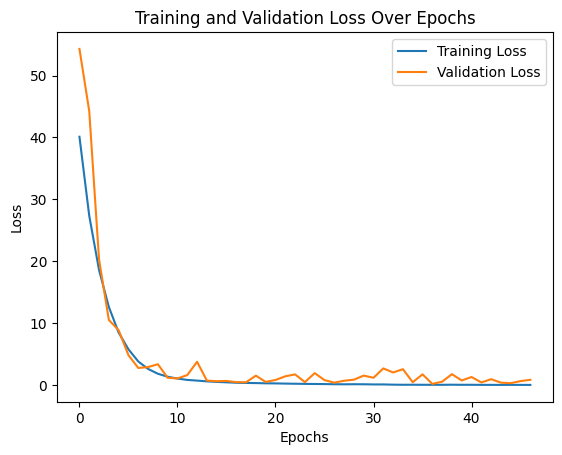

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

# Austin Nolte 11/21

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
CNN Model - RMSE: 0.4667, R²: 0.6908, MAPE: 5.5144%


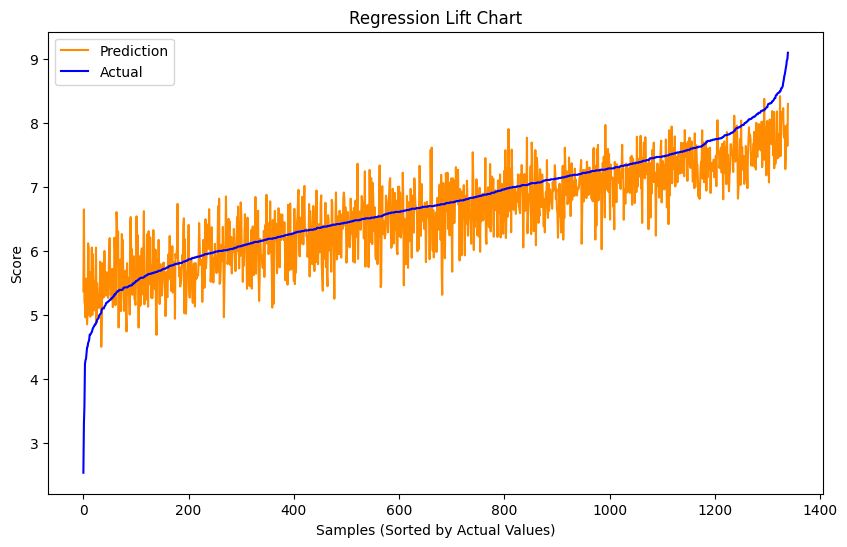

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

# Austin Nolte 11/21

#### Model 4

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    Conv1D(filters=128, kernel_size=5, activation='sigmoid'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    Conv1D(filters=64, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),

    Conv1D(filters=32, kernel_size=3, activation='sigmoid'),
    BatchNormalization(),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dense(32, activation='sigmoid'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.00001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_cnn_model_4_AdamSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/21

Epoch 1/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 48.7328 - root_mean_squared_error: 6.9809
Epoch 1: val_loss improved from inf to 43.09839, saving model to AustinNolte_cnn_model_4_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 48.7330 - root_mean_squared_error: 6.9809 - val_loss: 43.0984 - val_root_mean_squared_error: 6.5649
Epoch 2/1000
157/168 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 48.4872 - root_mean_squared_error: 6.9632
Epoch 2: val_loss did not improve from 43.09839
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 48.4708 - root_mean_squared_error: 6.9621 - val_loss: 44.7276 - val_root_mean_squared_error: 6.6879
Epoch 3/1000
160/168 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 47.9013 - root_mean_squared_error: 6.9211
Epoch 3: val_loss did not improve from 43.09839
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 47.8910 - root_mean_squared_error: 6.9203 - val_loss: 45.5182 - val_root_mean_squared_error: 6.7467
Epoch 4/1000
159/168 ━━━━━━━━━━━━━━

Test RMSE: 0.22788342833518982


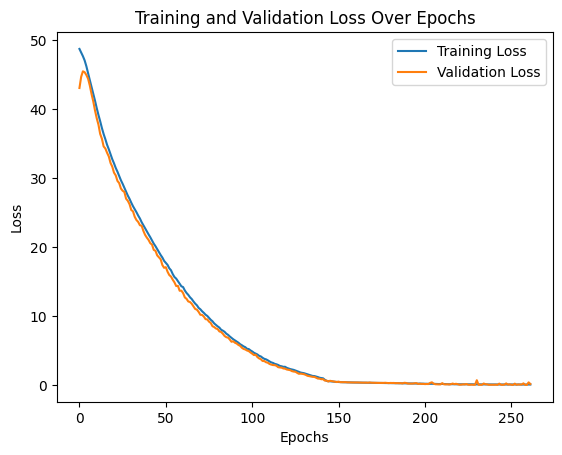

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

# Austin Nolte 11/21

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
CNN Model - RMSE: 0.2279, R²: 0.9263, MAPE: 2.2175%


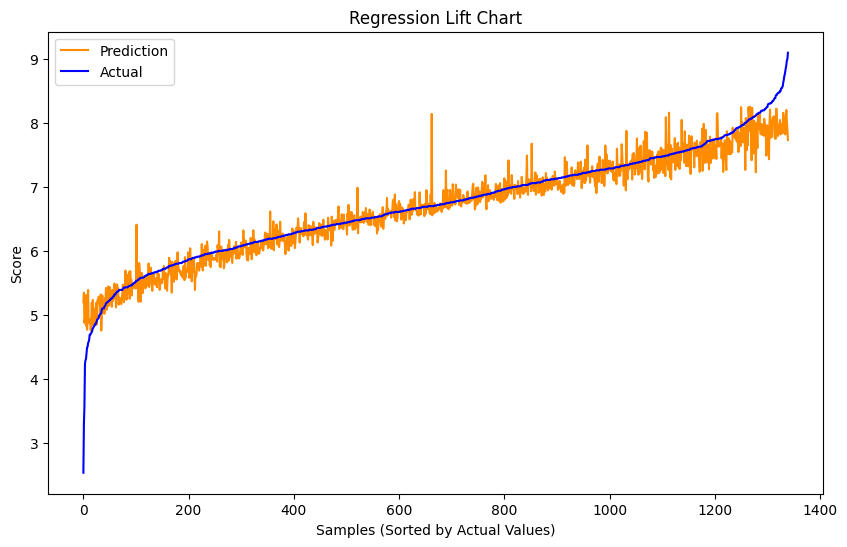

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

# Austin Nolte 11/21

#### Model 5

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    Conv1D(filters=128, kernel_size=5, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=3),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(512, activation='relu'),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dense(128, activation='sigmoid'),
    Dense(64, activation='sigmoid'),
    BatchNormalization(),
    Dense(32, activation='relu'),
    Dense(16, activation='sigmoid'),



    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_cnn_model_1_AdamSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/21

Epoch 1/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 28.7305 - root_mean_squared_error: 5.3253
Epoch 1: val_loss improved from inf to 15.54707, saving model to AustinNolte_cnn_model_1_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - loss: 28.6855 - root_mean_squared_error: 5.3210 - val_loss: 15.5471 - val_root_mean_squared_error: 3.9430
Epoch 2/1000
163/168 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 11.3075 - root_mean_squared_error: 3.3584
Epoch 2: val_loss improved from 15.54707 to 6.46922, saving model to AustinNolte_cnn_model_1_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 11.2412 - root_mean_squared_error: 3.3482 - val_loss: 6.4692 - val_root_mean_squared_error: 2.5435
Epoch 3/1000
164/168 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3968 - root_mean_squared_error: 2.3193
Epoch 3: val_loss improved from 6.46922 to 3.01032, saving model to AustinNolte_cnn_model_1_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 5.3689 - ro

Test RMSE: 0.65505051612854


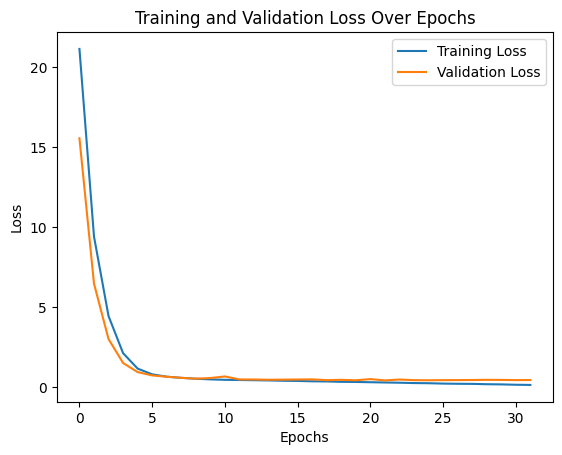

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

# Austin Nolte 11/21

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
CNN Model - RMSE: 0.6551, R²: 0.3910, MAPE: 7.8576%


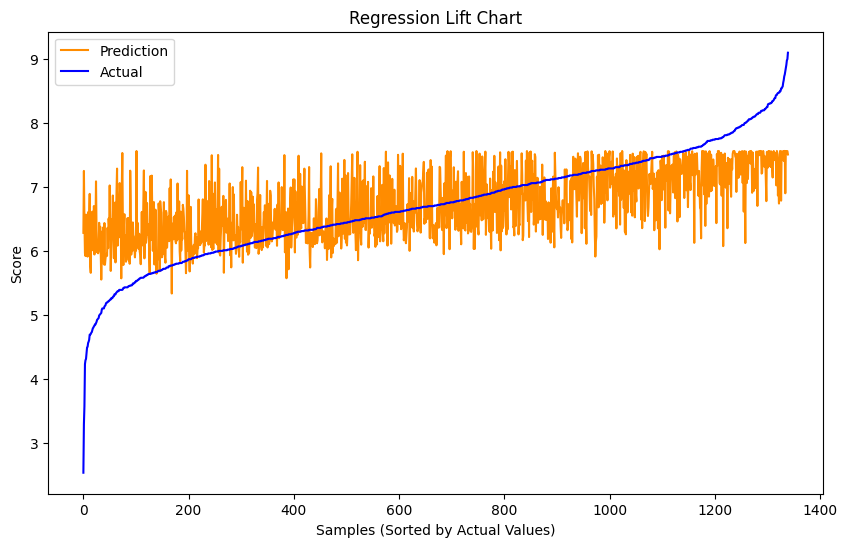

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

# Austin Nolte 11/21

#### Model 6

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    Conv1D(filters=128, kernel_size=5, activation='sigmoid'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    Conv1D(filters=64, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),

    Conv1D(filters=32, kernel_size=3, activation='relu'),
    MaxPooling1D(pool_size=2),
    BatchNormalization(),
    Dropout(0.2),

    Conv1D(filters=16, kernel_size=2, activation='sigmoid'),
    BatchNormalization(),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dense(32, activation='relu'),
    BatchNormalization(),
    Dense(16, activation='sigmoid'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.00001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_cnn_model_6_AdamSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/22

Epoch 1/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 50.8179 - root_mean_squared_error: 7.1286
Epoch 1: val_loss improved from inf to 50.81886, saving model to AustinNolte_cnn_model_6_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 50.8159 - root_mean_squared_error: 7.1285 - val_loss: 50.8189 - val_root_mean_squared_error: 7.1287
Epoch 2/1000
167/168 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 50.3454 - root_mean_squared_error: 7.0954
Epoch 2: val_loss did not improve from 50.81886
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 50.3436 - root_mean_squared_error: 7.0953 - val_loss: 52.2567 - val_root_mean_squared_error: 7.2289
Epoch 3/1000
165/168 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 50.1021 - root_mean_squared_error: 7.0782
Epoch 3: val_loss improved from 50.81886 to 50.45841, saving model to AustinNolte_cnn_model_6_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 50.0977 - root_mean_squared_error: 7.0779 - val_loss: 50.4584 - val_roo

Test RMSE: 0.4081066846847534


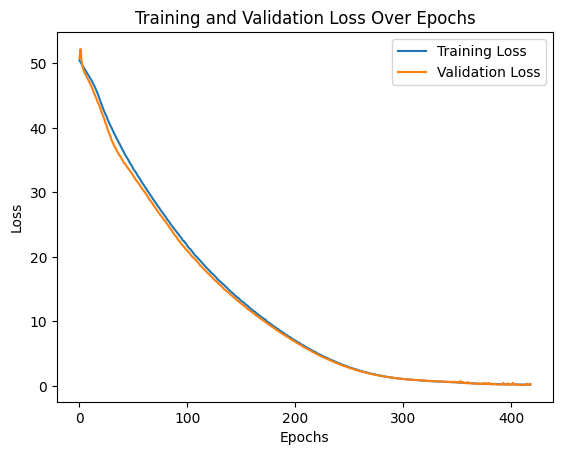

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

# Austin Nolte 11/21

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
CNN Model - RMSE: 0.4081, R²: 0.7636, MAPE: 3.5792%


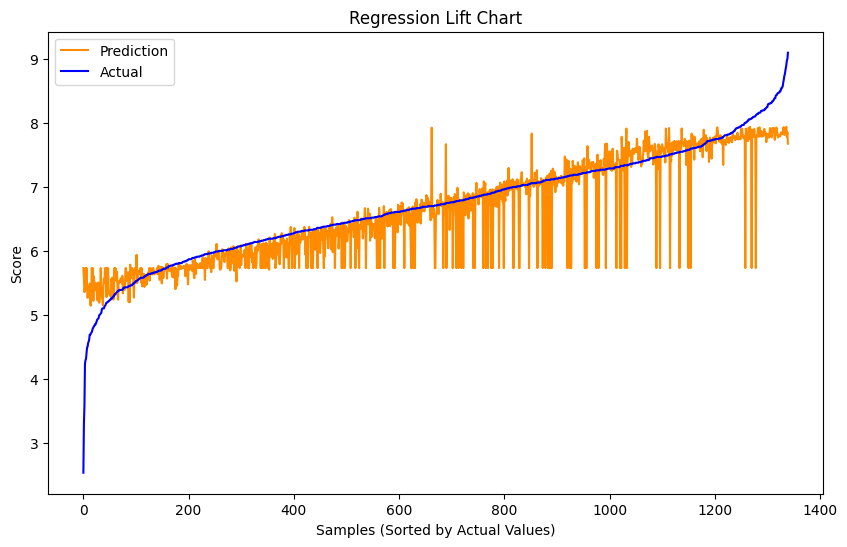

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

# Austin Nolte 11/21

#### Model 7

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam,SGD
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    Conv1D(filters=256, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    Conv1D(filters=128, kernel_size=3, activation='sigmoid'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),

    Conv1D(filters=64, kernel_size=3, activation='sigmoid'),
    BatchNormalization(),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dense(64, activation='sigmoid'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=SGD(learning_rate=0.001,momentum=0.9), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_cnn_model_7_SGDSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/21

Epoch 1/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 6.5629 - root_mean_squared_error: 2.3287
Epoch 1: val_loss improved from inf to 0.68202, saving model to AustinNolte_cnn_model_7_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 6.5366 - root_mean_squared_error: 2.3235 - val_loss: 0.6820 - val_root_mean_squared_error: 0.8258
Epoch 2/1000
166/168 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4295 - root_mean_squared_error: 0.6552
Epoch 2: val_loss improved from 0.68202 to 0.53241, saving model to AustinNolte_cnn_model_7_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.4295 - root_mean_squared_error: 0.6552 - val_loss: 0.5324 - val_root_mean_squared_error: 0.7297
Epoch 3/1000
167/168 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4084 - root_mean_squared_error: 0.6389
Epoch 3: val_loss improved from 0.53241 to 0.46480, saving model to AustinNolte_cnn_model_7_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.4085 - root_mean_squa

Test RMSE: 0.6594356894493103


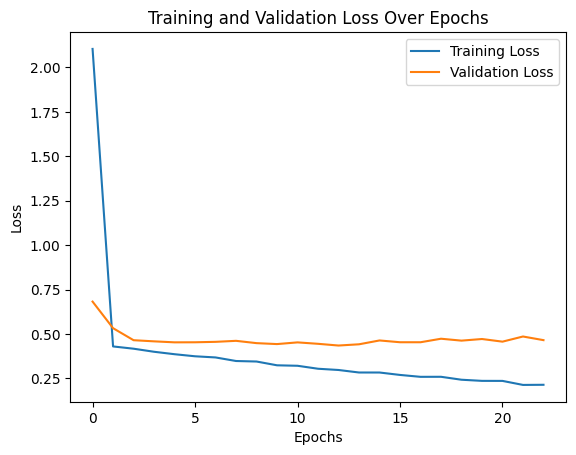

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

# Austin Nolte 11/21

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
CNN Model - RMSE: 0.6594, R²: 0.3828, MAPE: 7.8930%


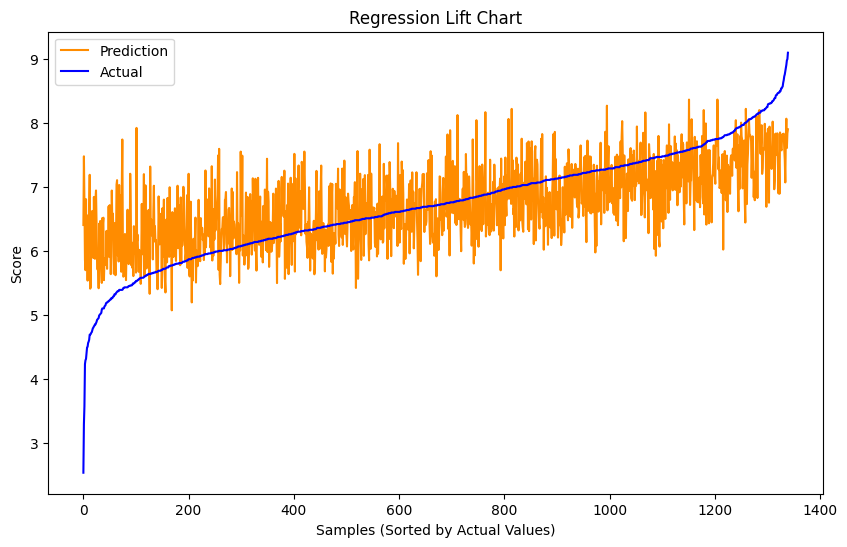

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

# Austin Nolte 11/21

#### Model 8

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam,SGD
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    Conv1D(filters=128, kernel_size=5, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=3),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(512, activation='relu'),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dense(128, activation='sigmoid'),
    Dense(64, activation='sigmoid'),
    BatchNormalization(),
    Dense(32, activation='relu'),
    Dense(16, activation='sigmoid'),



    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=SGD(learning_rate=0.001,momentum=0.9), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_cnn_model_8_SGDSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/21

Epoch 1/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 8.9914 - root_mean_squared_error: 2.7245
Epoch 1: val_loss improved from inf to 0.97404, saving model to AustinNolte_cnn_model_8_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - loss: 8.9546 - root_mean_squared_error: 2.7182 - val_loss: 0.9740 - val_root_mean_squared_error: 0.9869
Epoch 2/1000
160/168 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4351 - root_mean_squared_error: 0.6595
Epoch 2: val_loss improved from 0.97404 to 0.69137, saving model to AustinNolte_cnn_model_8_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.4350 - root_mean_squared_error: 0.6595 - val_loss: 0.6914 - val_root_mean_squared_error: 0.8315
Epoch 3/1000
165/168 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4197 - root_mean_squared_error: 0.6478
Epoch 3: val_loss improved from 0.69137 to 0.50277, saving model to AustinNolte_cnn_model_8_SGDSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.4195 - root_mean_squ

Test RMSE: 0.6849783062934875


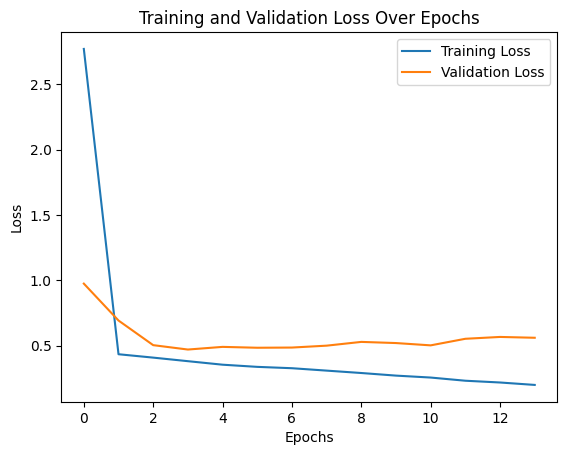

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

# Austin Nolte 11/21

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
CNN Model - RMSE: 0.6850, R²: 0.3340, MAPE: 8.1388%


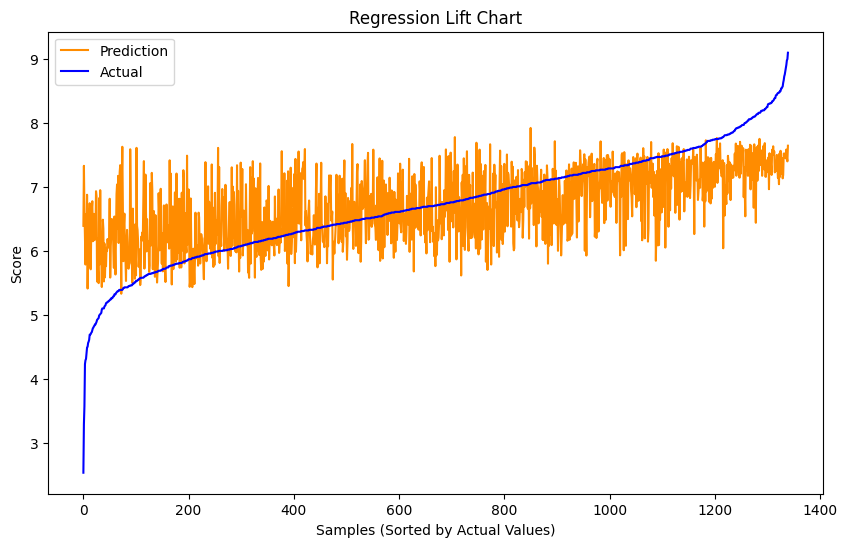

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

# Austin Nolte 11/21

### CNN Model Design and Testing (Alan Lei)

#### Model 1

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=64, kernel_size=5, activation='tanh'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Second Conv1D layer
    Conv1D(filters=256, kernel_size=5, activation='tanh'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Third Conv1D layer
    Conv1D(filters=128, kernel_size=3, activation='tanh'),
    BatchNormalization(),
    Dropout(0.2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(128, activation='tanh'),
    BatchNormalization(),
    Dropout(0.1),
    Dense(64, activation='tanh'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)
#Alan Lei 11/23

Epoch 1/1000
168/168 - 32s - 188ms/step - loss: 19.2058 - root_mean_squared_error: 4.3824 - val_loss: 4.8272 - val_root_mean_squared_error: 2.1971
Epoch 2/1000
168/168 - 15s - 89ms/step - loss: 2.7915 - root_mean_squared_error: 1.6708 - val_loss: 1.1363 - val_root_mean_squared_error: 1.0660
Epoch 3/1000
168/168 - 1s - 7ms/step - loss: 1.1428 - root_mean_squared_error: 1.0690 - val_loss: 0.8633 - val_root_mean_squared_error: 0.9292
Epoch 4/1000
168/168 - 1s - 7ms/step - loss: 0.8202 - root_mean_squared_error: 0.9057 - val_loss: 0.6496 - val_root_mean_squared_error: 0.8060
Epoch 5/1000
168/168 - 1s - 7ms/step - loss: 0.7666 - root_mean_squared_error: 0.8755 - val_loss: 0.6559 - val_root_mean_squared_error: 0.8099
Epoch 6/1000
168/168 - 1s - 6ms/step - loss: 0.7286 - root_mean_squared_error: 0.8536 - val_loss: 0.6773 - val_root_mean_squared_error: 0.8230
Epoch 7/1000
168/168 - 1s - 7ms/step - loss: 0.6893 - root_mean_squared_error: 0.8302 - val_loss: 0.7683 - val_root_mean_squared_error: 

Test RMSE: 0.6835424304008484


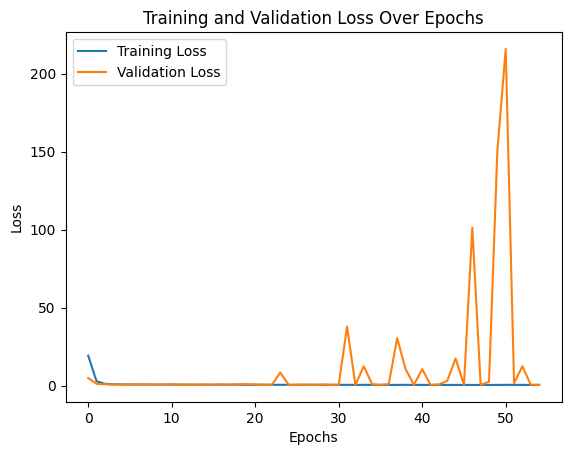

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
#Alan Lei 11/23

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
CNN Model - RMSE: 0.6835, R²: 0.3368, MAPE: 8.2727%


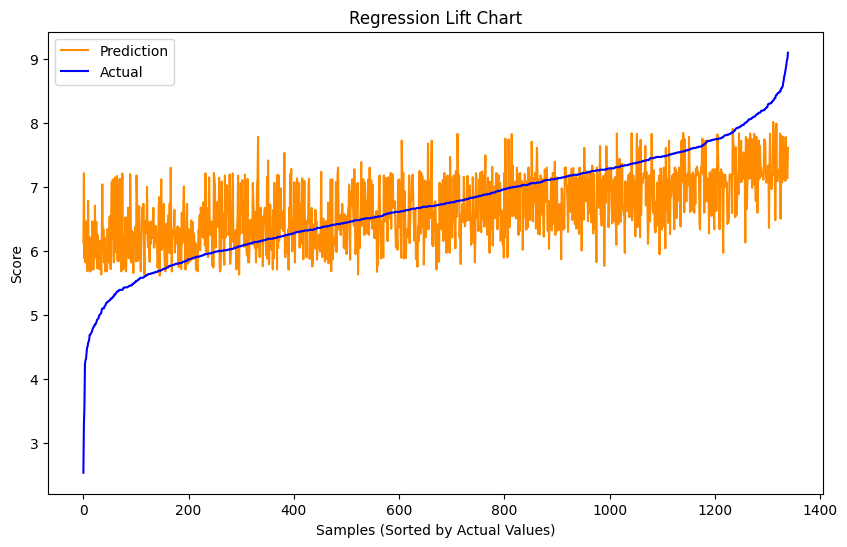

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
#Alan Lei 11/23

#### Model 2

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=256, kernel_size=5, activation='tanh'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Second Conv1D layer
    Conv1D(filters=256, kernel_size=5, activation='tanh'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Third Conv1D layer
    Conv1D(filters=128, kernel_size=3, activation='tanh'),
    BatchNormalization(),
    Dropout(0.2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(64, activation='tanh'),
    BatchNormalization(),
    Dropout(0.1),
    Dense(64, activation='tanh'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)
#Alan Lei 11/23

Epoch 1/1000
168/168 - 16s - 97ms/step - loss: 2.9754 - root_mean_squared_error: 1.7249 - val_loss: 3.9203 - val_root_mean_squared_error: 1.9800
Epoch 2/1000
168/168 - 2s - 12ms/step - loss: 0.6592 - root_mean_squared_error: 0.8119 - val_loss: 1.4012 - val_root_mean_squared_error: 1.1837
Epoch 3/1000
168/168 - 2s - 12ms/step - loss: 0.6631 - root_mean_squared_error: 0.8143 - val_loss: 0.6430 - val_root_mean_squared_error: 0.8019
Epoch 4/1000
168/168 - 3s - 15ms/step - loss: 0.6596 - root_mean_squared_error: 0.8121 - val_loss: 0.6635 - val_root_mean_squared_error: 0.8146
Epoch 5/1000
168/168 - 1s - 9ms/step - loss: 0.6788 - root_mean_squared_error: 0.8239 - val_loss: 0.6562 - val_root_mean_squared_error: 0.8101
Epoch 6/1000
168/168 - 3s - 16ms/step - loss: 0.6612 - root_mean_squared_error: 0.8131 - val_loss: 0.6635 - val_root_mean_squared_error: 0.8146
Epoch 7/1000
168/168 - 2s - 9ms/step - loss: 0.6683 - root_mean_squared_error: 0.8175 - val_loss: 0.6417 - val_root_mean_squared_error: 

Test RMSE: 0.7937095165252686


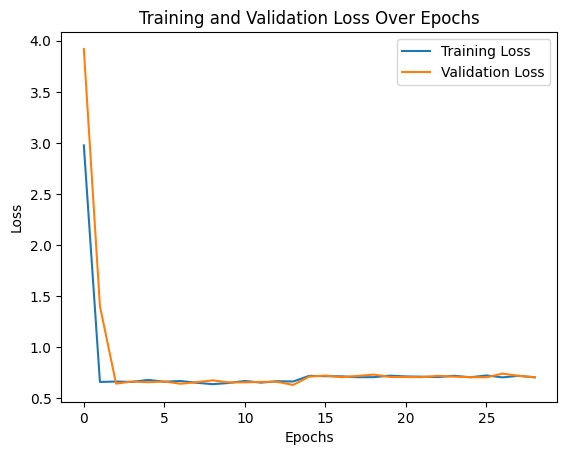

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
#Alan Lei 11/23

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
CNN Model - RMSE: 0.7937, R²: 0.1058, MAPE: 9.8535%


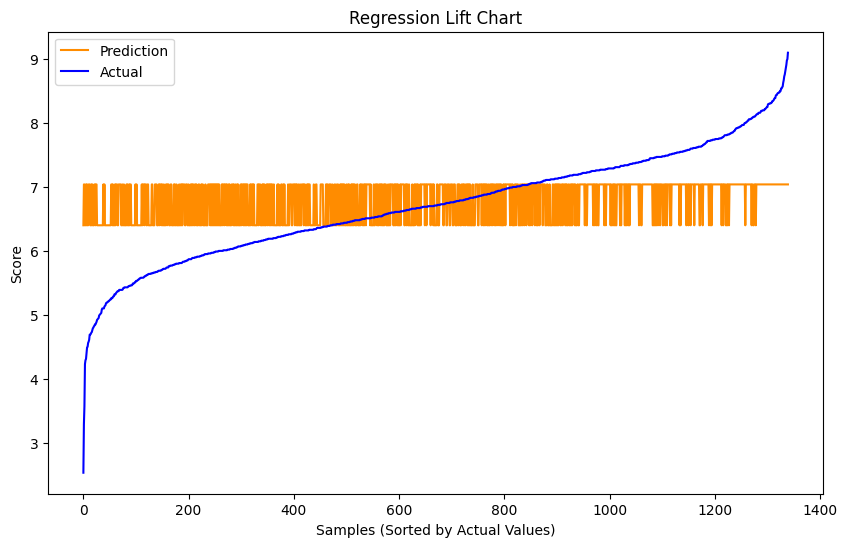

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
#Alan Lei 11/23

#### Model 3

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=64, kernel_size=5, activation='tanh'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Second Conv1D layer
    Conv1D(filters=128, kernel_size=5, activation='tanh'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Third Conv1D layer
    Conv1D(filters=128, kernel_size=3, activation='tanh'),
    BatchNormalization(),
    Dropout(0.2),

    # Fourth Conv1D layer
    Conv1D(filters=64, kernel_size=3, activation='tanh'),
    BatchNormalization(),
    Dropout(0.2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(32, activation='tanh'),
    BatchNormalization(),
    Dropout(0.1),
    Dense(64, activation='tanh'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=SGD(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)
#Alan Lei 11/23

Epoch 1/1000
168/168 - 17s - 101ms/step - loss: 16.4369 - root_mean_squared_error: 4.0542 - val_loss: 1.9222 - val_root_mean_squared_error: 1.3864
Epoch 2/1000
168/168 - 1s - 5ms/step - loss: 0.9146 - root_mean_squared_error: 0.9563 - val_loss: 1.1097 - val_root_mean_squared_error: 1.0534
Epoch 3/1000
168/168 - 1s - 7ms/step - loss: 0.8444 - root_mean_squared_error: 0.9189 - val_loss: 0.7349 - val_root_mean_squared_error: 0.8573
Epoch 4/1000
168/168 - 1s - 4ms/step - loss: 0.7904 - root_mean_squared_error: 0.8890 - val_loss: 0.6121 - val_root_mean_squared_error: 0.7824
Epoch 5/1000
168/168 - 1s - 7ms/step - loss: 0.7794 - root_mean_squared_error: 0.8829 - val_loss: 0.6439 - val_root_mean_squared_error: 0.8024
Epoch 6/1000
168/168 - 1s - 8ms/step - loss: 0.7557 - root_mean_squared_error: 0.8693 - val_loss: 0.6232 - val_root_mean_squared_error: 0.7894
Epoch 7/1000
168/168 - 1s - 5ms/step - loss: 0.7321 - root_mean_squared_error: 0.8556 - val_loss: 0.6221 - val_root_mean_squared_error: 0.

Test RMSE: 0.7089822292327881


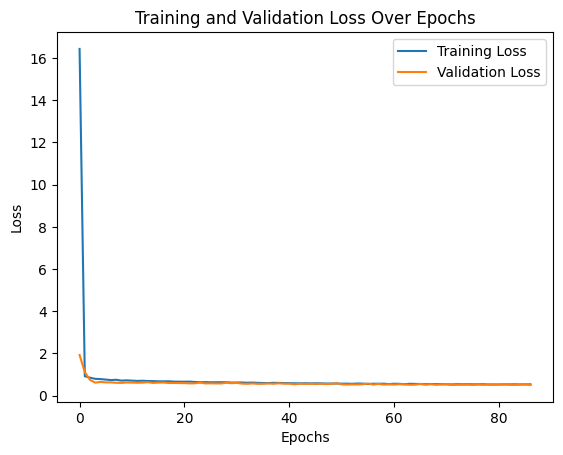

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
#Alan Lei 11/23

42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step
CNN Model - RMSE: 0.7090, R²: 0.2865, MAPE: 8.6920%


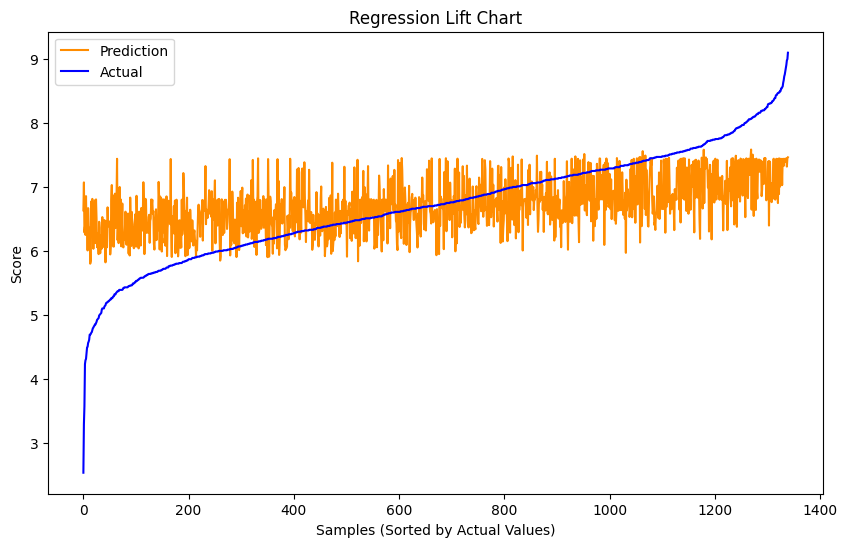

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
#Alan Lei 11/23

#### Model 4

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=512, kernel_size=5, activation='tanh'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Second Conv1D layer
    Conv1D(filters=256, kernel_size=5, activation='tanh'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Third Conv1D layer
    Conv1D(filters=128, kernel_size=5, activation='tanh'),
    BatchNormalization(),
    Dropout(0.2),

    # Fourth Conv1D layer
    Conv1D(filters=64, kernel_size=3, activation='tanh'),
    BatchNormalization(),
    Dropout(0.2),

    # Fifth Conv1D layer
    Conv1D(filters=32, kernel_size=3, activation='tanh'),
    BatchNormalization(),
    Dropout(0.2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(16, activation='tanh'),
    BatchNormalization(),
    Dropout(0.1),
    Dense(64, activation='tanh'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)
#Alan Lei 11/23

Epoch 1/1000
168/168 - 32s - 190ms/step - loss: 30.4212 - root_mean_squared_error: 5.5155 - val_loss: 10.4986 - val_root_mean_squared_error: 3.2402
Epoch 2/1000
168/168 - 18s - 104ms/step - loss: 6.8464 - root_mean_squared_error: 2.6166 - val_loss: 1.8912 - val_root_mean_squared_error: 1.3752
Epoch 3/1000
168/168 - 2s - 15ms/step - loss: 1.6067 - root_mean_squared_error: 1.2675 - val_loss: 0.7477 - val_root_mean_squared_error: 0.8647
Epoch 4/1000
168/168 - 3s - 16ms/step - loss: 1.0777 - root_mean_squared_error: 1.0381 - val_loss: 0.9480 - val_root_mean_squared_error: 0.9736
Epoch 5/1000
168/168 - 2s - 14ms/step - loss: 0.9852 - root_mean_squared_error: 0.9926 - val_loss: 0.7382 - val_root_mean_squared_error: 0.8592
Epoch 6/1000
168/168 - 3s - 16ms/step - loss: 0.9154 - root_mean_squared_error: 0.9567 - val_loss: 0.7587 - val_root_mean_squared_error: 0.8710
Epoch 7/1000
168/168 - 2s - 14ms/step - loss: 0.8833 - root_mean_squared_error: 0.9399 - val_loss: 0.7092 - val_root_mean_squared_

Test RMSE: 0.6991470456123352


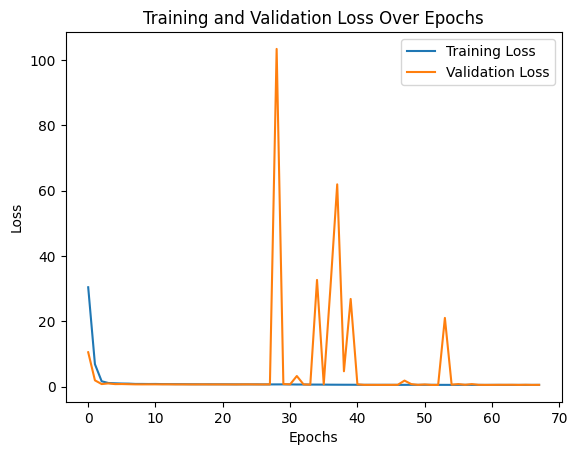

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
#Alan Lei 11/23

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
CNN Model - RMSE: 0.6991, R²: 0.3062, MAPE: 8.4957%


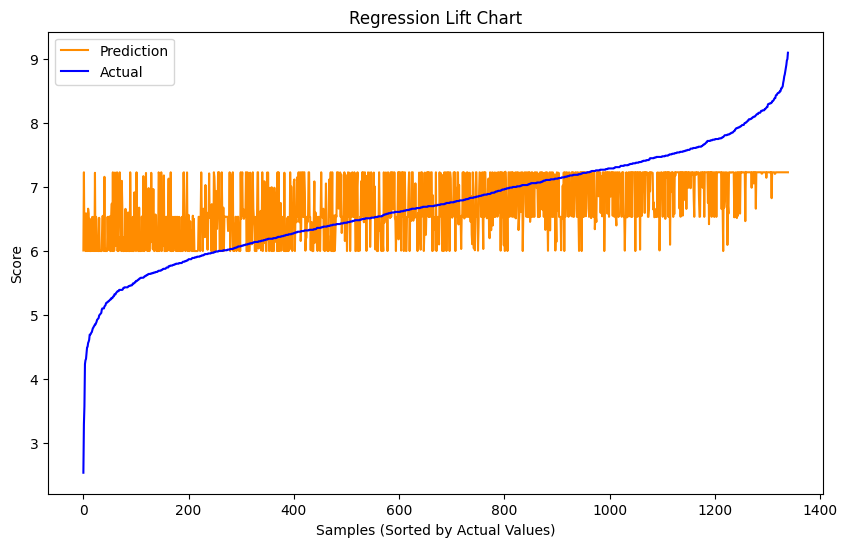

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
#Alan Lei 11/23

#### Model 5

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=128, kernel_size=5, activation='tanh'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Second Conv1D layer
    Conv1D(filters=256, kernel_size=5, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Third Conv1D layer
    Conv1D(filters=256, kernel_size=3, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(128, activation='tanh'),
    BatchNormalization(),
    Dropout(0.1),
    Dense(64, activation='relu'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0015), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)
#Alan Lei 11/23

Epoch 1/1000
168/168 - 17s - 103ms/step - loss: 3.2728 - root_mean_squared_error: 1.8091 - val_loss: 1.2564 - val_root_mean_squared_error: 1.1209
Epoch 2/1000
168/168 - 8s - 46ms/step - loss: 1.1912 - root_mean_squared_error: 1.0914 - val_loss: 1.8944 - val_root_mean_squared_error: 1.3764
Epoch 3/1000
168/168 - 3s - 16ms/step - loss: 0.7620 - root_mean_squared_error: 0.8729 - val_loss: 0.7671 - val_root_mean_squared_error: 0.8759
Epoch 4/1000
168/168 - 1s - 8ms/step - loss: 0.6886 - root_mean_squared_error: 0.8298 - val_loss: 0.6586 - val_root_mean_squared_error: 0.8115
Epoch 5/1000
168/168 - 1s - 8ms/step - loss: 0.6735 - root_mean_squared_error: 0.8207 - val_loss: 0.6466 - val_root_mean_squared_error: 0.8041
Epoch 6/1000
168/168 - 1s - 8ms/step - loss: 0.6673 - root_mean_squared_error: 0.8169 - val_loss: 0.7035 - val_root_mean_squared_error: 0.8387
Epoch 7/1000
168/168 - 1s - 8ms/step - loss: 0.6713 - root_mean_squared_error: 0.8194 - val_loss: 0.6414 - val_root_mean_squared_error: 0

Test RMSE: 0.8008788228034973


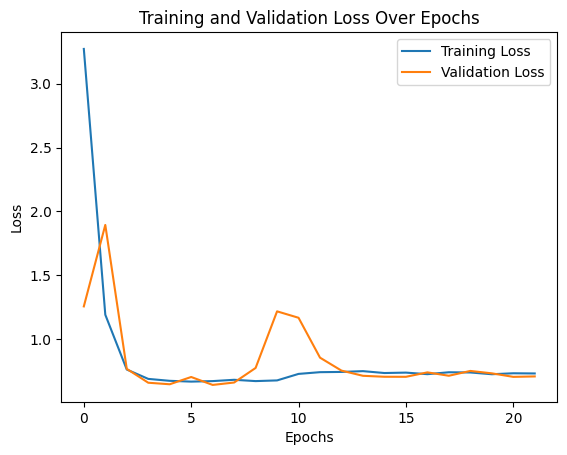

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
#Alan Lei 11/23

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
CNN Model - RMSE: 0.8009, R²: 0.0896, MAPE: 9.7402%


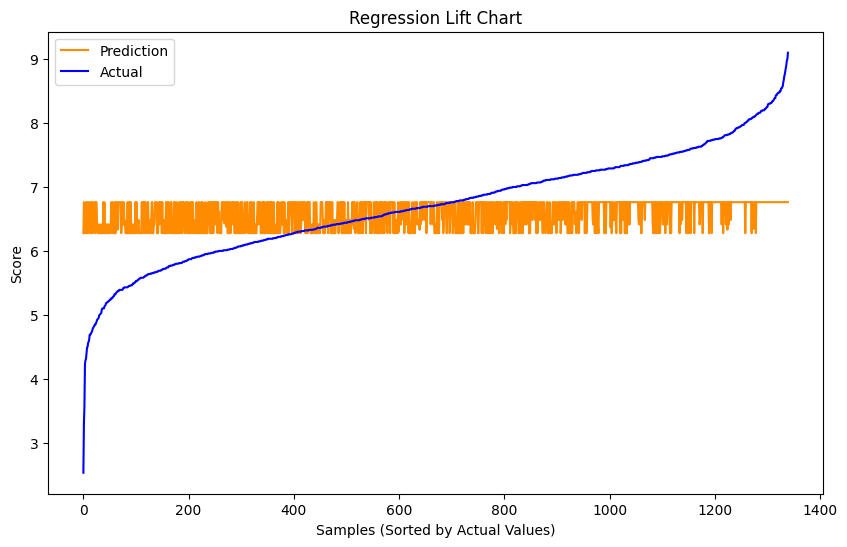

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
#Alan Lei 11/23

#### Model 6

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=512, kernel_size=5, activation='tanh'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Second Conv1D layer
    Conv1D(filters=256, kernel_size=5, activation='sigmoid'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Third Conv1D layer
    Conv1D(filters=128, kernel_size=3, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(64, activation='tanh'),
    BatchNormalization(),
    Dropout(0.1),
    Dense(32, activation='relu'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)
#Alan Lei 11/23

Epoch 1/1000
168/168 - 21s - 122ms/step - loss: 3.0753 - root_mean_squared_error: 1.7536 - val_loss: 2.6001 - val_root_mean_squared_error: 1.6125
Epoch 2/1000
168/168 - 2s - 13ms/step - loss: 0.7581 - root_mean_squared_error: 0.8707 - val_loss: 1.5301 - val_root_mean_squared_error: 1.2370
Epoch 3/1000
168/168 - 2s - 13ms/step - loss: 0.7139 - root_mean_squared_error: 0.8449 - val_loss: 0.9089 - val_root_mean_squared_error: 0.9534
Epoch 4/1000
168/168 - 3s - 15ms/step - loss: 0.6994 - root_mean_squared_error: 0.8363 - val_loss: 0.6647 - val_root_mean_squared_error: 0.8153
Epoch 5/1000
168/168 - 3s - 16ms/step - loss: 0.7092 - root_mean_squared_error: 0.8422 - val_loss: 0.6393 - val_root_mean_squared_error: 0.7996
Epoch 6/1000
168/168 - 3s - 16ms/step - loss: 0.6949 - root_mean_squared_error: 0.8336 - val_loss: 0.6890 - val_root_mean_squared_error: 0.8301
Epoch 7/1000
168/168 - 2s - 13ms/step - loss: 0.6933 - root_mean_squared_error: 0.8326 - val_loss: 0.6330 - val_root_mean_squared_erro

Test RMSE: 0.7915202975273132


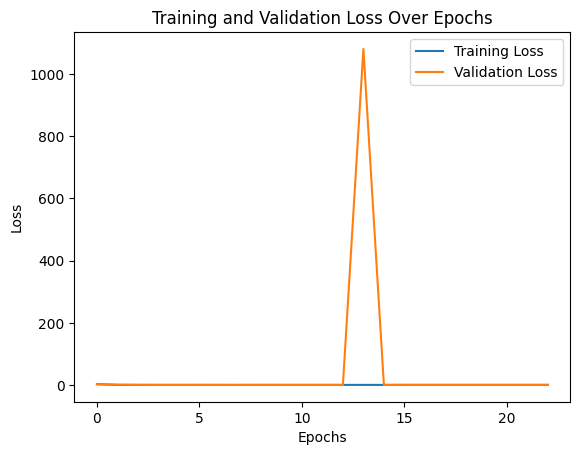

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
#Alan Lei 11/23

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
CNN Model - RMSE: 0.7915, R²: 0.1108, MAPE: 9.7368%


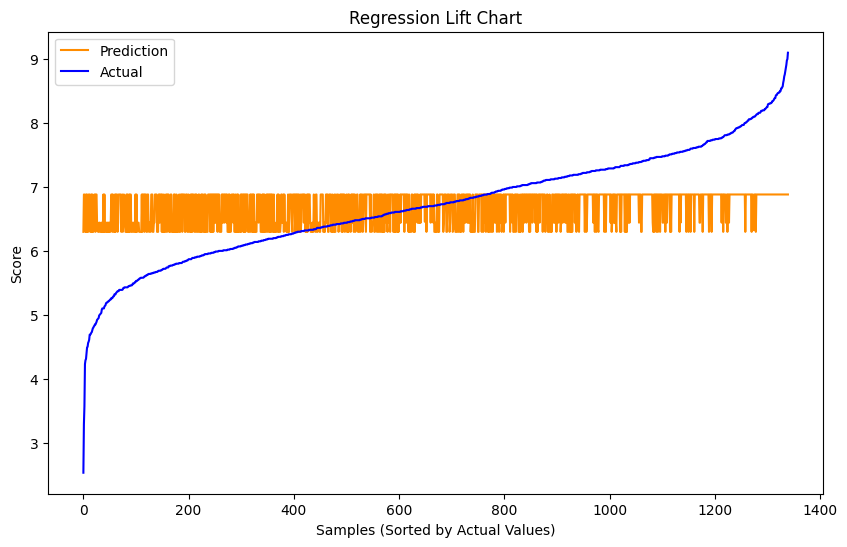

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
#Alan Lei 11/23

#### Model 7

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=500, kernel_size=5, activation='tanh'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Second Conv1D layer
    Conv1D(filters=400, kernel_size=3, activation='sigmoid'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Third Conv1D layer
    Conv1D(filters=300, kernel_size=3, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(200, activation='tanh'),
    BatchNormalization(),
    Dropout(0.1),
    Dense(100, activation='sigmoid'),
    BatchNormalization(),
    Dropout(0.1),
    Dense(50, activation='relu'),
    BatchNormalization(),
    Dropout(0.1),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=SGD(learning_rate=0.0005), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)
#Alan Lei 11/23

Epoch 1/1000
168/168 - 19s - 111ms/step - loss: 29.7460 - root_mean_squared_error: 5.4540 - val_loss: 24.7455 - val_root_mean_squared_error: 4.9745
Epoch 2/1000
168/168 - 6s - 35ms/step - loss: 7.4699 - root_mean_squared_error: 2.7331 - val_loss: 1.5269 - val_root_mean_squared_error: 1.2357
Epoch 3/1000
168/168 - 5s - 29ms/step - loss: 2.4648 - root_mean_squared_error: 1.5700 - val_loss: 0.7391 - val_root_mean_squared_error: 0.8597
Epoch 4/1000
168/168 - 3s - 17ms/step - loss: 1.8525 - root_mean_squared_error: 1.3611 - val_loss: 0.7942 - val_root_mean_squared_error: 0.8912
Epoch 5/1000
168/168 - 3s - 17ms/step - loss: 1.7374 - root_mean_squared_error: 1.3181 - val_loss: 0.8024 - val_root_mean_squared_error: 0.8958
Epoch 6/1000
168/168 - 3s - 18ms/step - loss: 1.6086 - root_mean_squared_error: 1.2683 - val_loss: 0.6585 - val_root_mean_squared_error: 0.8115
Epoch 7/1000
168/168 - 5s - 30ms/step - loss: 1.5485 - root_mean_squared_error: 1.2444 - val_loss: 0.6426 - val_root_mean_squared_er

Test RMSE: 0.6913272142410278


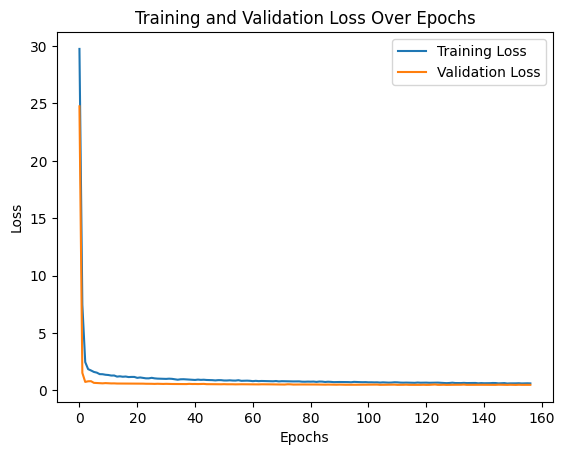

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
#Alan Lei 11/23

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
CNN Model - RMSE: 0.6913, R²: 0.3216, MAPE: 8.3882%


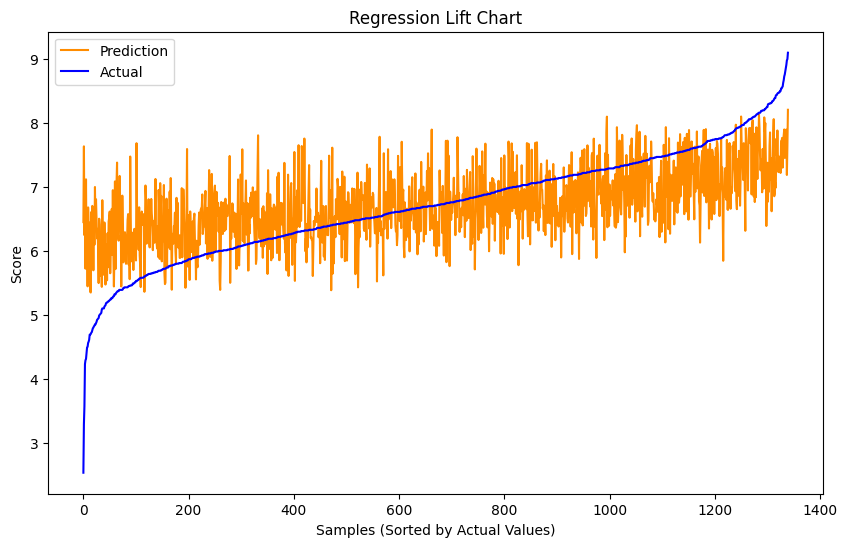

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
#Alan Lei 11/23

#### Model 8

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    # First Conv1D layer
    Conv1D(filters=64, kernel_size=5, activation='tanh'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Second Conv1D layer
    Conv1D(filters=256, kernel_size=5, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),  # Reduced dropout rate

    # Third Conv1D layer
    Conv1D(filters=128, kernel_size=3, activation='tanh'),
    BatchNormalization(),
    Dropout(0.2),

    # Fourth Conv1D layer
    Conv1D(filters=128, kernel_size=3, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(128, activation='tanh'),
    BatchNormalization(),
    Dropout(0.1),
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.1),
    Dense(32, activation='relu'),
    BatchNormalization(),
    Dropout(0.1),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.00015), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)
#Alan Lei 11/23

Epoch 1/1000
168/168 - 23s - 138ms/step - loss: 45.7127 - root_mean_squared_error: 6.7611 - val_loss: 48.0296 - val_root_mean_squared_error: 6.9303
Epoch 2/1000
168/168 - 1s - 7ms/step - loss: 42.6817 - root_mean_squared_error: 6.5331 - val_loss: 43.1035 - val_root_mean_squared_error: 6.5653
Epoch 3/1000
168/168 - 1s - 7ms/step - loss: 39.7427 - root_mean_squared_error: 6.3042 - val_loss: 36.1538 - val_root_mean_squared_error: 6.0128
Epoch 4/1000
168/168 - 1s - 7ms/step - loss: 36.6412 - root_mean_squared_error: 6.0532 - val_loss: 33.4689 - val_root_mean_squared_error: 5.7852
Epoch 5/1000
168/168 - 1s - 7ms/step - loss: 32.9936 - root_mean_squared_error: 5.7440 - val_loss: 25.1516 - val_root_mean_squared_error: 5.0151
Epoch 6/1000
168/168 - 1s - 8ms/step - loss: 28.9958 - root_mean_squared_error: 5.3848 - val_loss: 29.2879 - val_root_mean_squared_error: 5.4118
Epoch 7/1000
168/168 - 2s - 14ms/step - loss: 24.6141 - root_mean_squared_error: 4.9613 - val_loss: 27.0417 - val_root_mean_squ

Test RMSE: 0.807826817035675


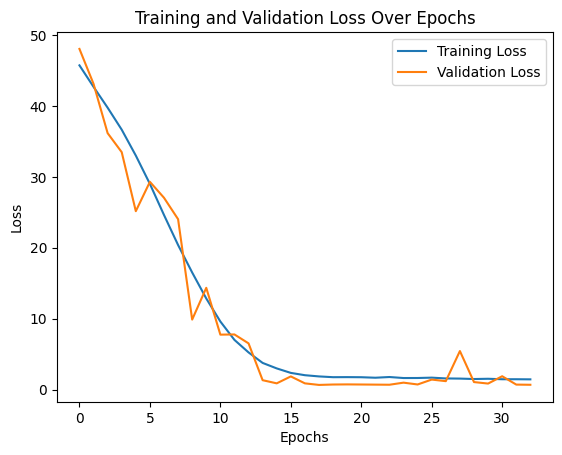

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
#Alan Lei 11/23

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
CNN Model - RMSE: 0.8078, R²: 0.0737, MAPE: 9.8690%


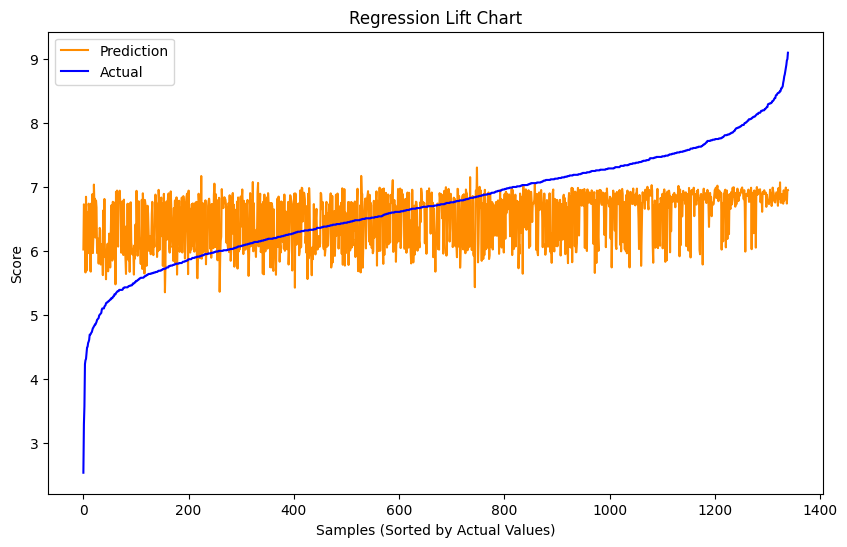

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
#Alan Lei 11/23

## Hybrid Models

#### Model 1

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

# Define input shapes for both CNN and FCNN branches
cnn_input_shape = X_train_cnn.shape[1:]
fcnn_input_shape = X_train.shape[1]

# CNN branch
cnn_input = Input(shape=cnn_input_shape, name='CNN_Input')
x = Conv1D(filters=128, kernel_size=5, activation='sigmoid')(cnn_input)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=2)(x)

x = Conv1D(filters=64, kernel_size=3, activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.2)(x)

x = Conv1D(filters=32, kernel_size=3, activation='sigmoid')(x)
x = BatchNormalization()(x)

x = Flatten()(x)

# FCNN branch
fcnn_input = Input(shape=(fcnn_input_shape,), name='FCNN_Input')
y = BatchNormalization()(fcnn_input)

y = Dense(384, activation='relu')(y)
y = BatchNormalization()(y)
y = Dropout(0.2)(y)

y = Dense(64, activation='relu')(y)
y = BatchNormalization()(y)
y = Dropout(0.4)(y)

y = Dense(64, activation='relu')(y)
y = Dropout(0.2)(y)

# Concatenate the CNN and FCNN outputs
combined = Concatenate()([x, y])

# Final dense layers for regression
z = Dense(128, activation='relu')(combined)
z = BatchNormalization()(z)
z = Dropout(0.3)(z)

z = Dense(64, activation='relu')(z)
z = BatchNormalization()(z)
z = Dropout(0.3)(z)

z = Dense(32, activation='relu')(z)

# Output layer for regression
output = Dense(1, name='Output')(z)

# Define the model
hybrid_model = Model(inputs=[cnn_input, fcnn_input], outputs=output)

# Compile the model
hybrid_model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Train the model
history = hybrid_model.fit(
    [X_train_cnn, X_train],
    y_train,
    validation_data=([X_test_cnn, X_test], y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)
# Tyler Burguillos 11/13/2024

Epoch 1/1000
168/168 - 21s - 124ms/step - loss: 9.6885 - root_mean_squared_error: 3.1126 - val_loss: 21.8307 - val_root_mean_squared_error: 4.6723
Epoch 2/1000
168/168 - 5s - 32ms/step - loss: 1.8842 - root_mean_squared_error: 1.3727 - val_loss: 4.6098 - val_root_mean_squared_error: 2.1471
Epoch 3/1000
168/168 - 1s - 6ms/step - loss: 1.5147 - root_mean_squared_error: 1.2307 - val_loss: 0.7790 - val_root_mean_squared_error: 0.8826
Epoch 4/1000
168/168 - 1s - 7ms/step - loss: 1.1682 - root_mean_squared_error: 1.0808 - val_loss: 0.2818 - val_root_mean_squared_error: 0.5309
Epoch 5/1000
168/168 - 1s - 7ms/step - loss: 1.0060 - root_mean_squared_error: 1.0030 - val_loss: 0.2806 - val_root_mean_squared_error: 0.5297
Epoch 6/1000
168/168 - 1s - 8ms/step - loss: 0.8273 - root_mean_squared_error: 0.9096 - val_loss: 0.2537 - val_root_mean_squared_error: 0.5036
Epoch 7/1000
168/168 - 1s - 7ms/step - loss: 0.7150 - root_mean_squared_error: 0.8456 - val_loss: 0.1179 - val_root_mean_squared_error: 0

42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step
Hybrid Model - RMSE: 0.1851, R²: 0.9514, MAPE: 1.4953%


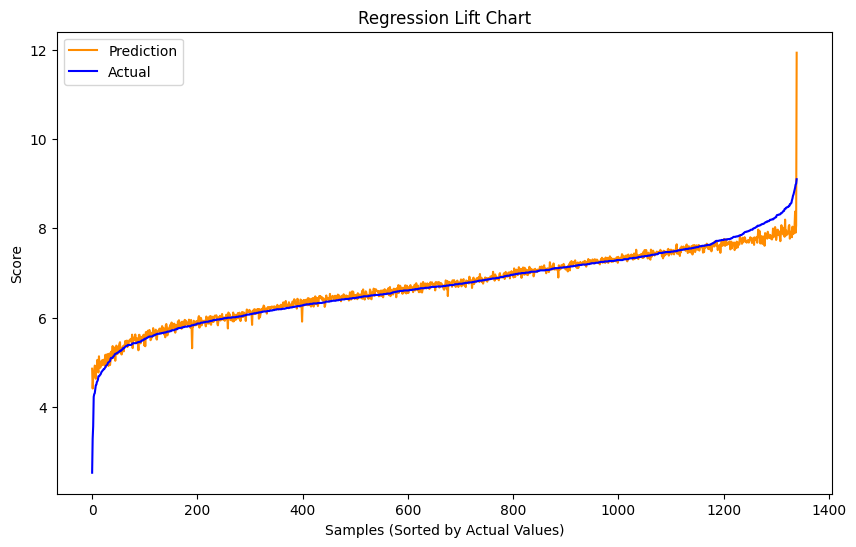

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

# Function to generate and display the regression lift chart
def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

# Evaluation function for RMSE, R², and MAPE
def evaluate_model(model, X_test_cnn, X_test, y_test):
    y_pred = model.predict([X_test_cnn, X_test])
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run the evaluation on the hybrid model and plot results
y_pred, rmse, r2, mape = evaluate_model(hybrid_model, X_test_cnn, X_test, y_test)
print(f"Hybrid Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
# Tyler Burguillos 11/13/2024

#### Hypertuning Model with Keras

In [ ]:
!pip install -q -U keras-tuner

import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import keras_tuner as kt

# Define the model-building function for Keras Tuner
def build_hybrid_model(hp):
    # CNN branch
    cnn_input = Input(shape=X_train_cnn.shape[1:], name='CNN_Input')

    x = Conv1D(filters=hp.Int('conv1_filters', min_value=32, max_value=128, step=32),
               kernel_size=hp.Choice('conv1_kernel_size', values=[3, 5]),
               activation=hp.Choice('conv1_activation', values=['sigmoid', 'relu']))(cnn_input)
    x = BatchNormalization()(x)
    x = MaxPooling1D(pool_size=hp.Choice('pool1_size', values=[2, 3]))(x)

    x = Conv1D(filters=hp.Int('conv2_filters', min_value=32, max_value=128, step=32),
               kernel_size=hp.Choice('conv2_kernel_size', values=[3, 5]),
               activation=hp.Choice('conv2_activation', values=['sigmoid', 'relu']))(x)
    x = BatchNormalization()(x)
    x = MaxPooling1D(pool_size=hp.Choice('pool2_size', values=[2, 3]))(x)
    x = Dropout(hp.Float('dropout1', min_value=0.1, max_value=0.5, step=0.1))(x)

    x = Conv1D(filters=hp.Int('conv3_filters', min_value=16, max_value=64, step=16),
               kernel_size=hp.Choice('conv3_kernel_size', values=[3, 5]),
               activation=hp.Choice('conv3_activation', values=['sigmoid', 'relu']))(x)
    x = BatchNormalization()(x)
    x = Flatten()(x)

    # FCNN branch
    fcnn_input = Input(shape=X_train.shape[1:], name='FCNN_Input')
    y = BatchNormalization()(fcnn_input)

    y = Dense(hp.Int('dense1_units', min_value=128, max_value=512, step=64), activation='relu')(y)
    y = BatchNormalization()(y)
    y = Dropout(hp.Float('dropout2', min_value=0.1, max_value=0.5, step=0.1))(y)

    y = Dense(hp.Int('dense2_units', min_value=64, max_value=256, step=32), activation='relu')(y)
    y = BatchNormalization()(y)
    y = Dropout(hp.Float('dropout3', min_value=0.1, max_value=0.5, step=0.1))(y)

    y = Dense(hp.Int('dense3_units', min_value=32, max_value=128, step=16), activation='relu')(y)
    y = Dropout(hp.Float('dropout4', min_value=0.1, max_value=0.5, step=0.1))(y)

    # Concatenate the CNN and FCNN outputs
    combined = Concatenate()([x, y])

    # Final dense layers for regression
    z = Dense(hp.Int('dense_combined1_units', min_value=64, max_value=256, step=32), activation='relu')(combined)
    z = BatchNormalization()(z)
    z = Dropout(hp.Float('dropout5', min_value=0.1, max_value=0.5, step=0.1))(z)

    z = Dense(hp.Int('dense_combined2_units', min_value=32, max_value=128, step=16), activation='relu')(z)
    z = BatchNormalization()(z)
    z = Dropout(hp.Float('dropout6', min_value=0.1, max_value=0.5, step=0.1))(z)

    # Output layer
    output = Dense(1, name='Output')(z)

    # Define the model
    hybrid_model = Model(inputs=[cnn_input, fcnn_input], outputs=output)

    # Compile the model
    hybrid_model.compile(
        optimizer=Adam(learning_rate=hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
        loss='mean_squared_error',
        metrics=[tf.keras.metrics.RootMeanSquaredError()]
    )

    return hybrid_model

# Instantiate the tuner
tuner = kt.RandomSearch(
    build_hybrid_model,
    objective='val_root_mean_squared_error',
    max_trials=20,  # Number of hyperparameter configurations to try
    executions_per_trial=2,  # Average performance over 2 runs
    directory='hybrid_model_tuning',
    project_name='anime_hybrid_model'
)

# Perform hypertuning
tuner.search(
    [X_train_cnn, X_train],
    y_train,
    validation_data=([X_test_cnn, X_test], y_test),
    epochs=100,
    batch_size=32,
    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)],
    verbose=2
)

# Retrieve the best model and hyperparameters
best_hybrid_model = tuner.get_best_models(num_models=1)[0]
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]

print("Best Hyperparameters:")
print(best_hyperparameters.values)
#Tyler Burguillos 11/24

#### Model 1 Using Hypertuned Parameters

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ CNN_Input (InputLayer)    │ (None, 389, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_21 (Conv1D)        │ (None, 387, 32)        │            128 │ CNN_Input[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ FCNN_Input (InputLayer)   │ (None, 389)            │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_56    │ (None, 387, 32)        │            128 │ conv1d_21[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_59    │ (None, 389)            │          1,556 │ FCNN_Input[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_14          │ (None, 129, 32)        │              0 │ batch_normalization_5… │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_35 (Dense)          │ (None, 192)            │         74,880 │ batch_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_22 (Conv1D)        │ (None, 127, 64)        │          6,208 │ max_pooling1d_14[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_60    │ (None, 192)            │            768 │ dense_35[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_57    │ (None, 127, 64)        │            256 │ conv1d_22[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_43 (Dropout)      │ (None, 192)            │              0 │ batch_normalization_6… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_15          │ (None, 63, 64)         │              0 │ batch_normalization_5… │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_36 (Dense)          │ (None, 192)            │         37,056 │ dropout_43[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_42 (Dropout)      │ (None, 63, 64)         │              0 │ max_pooling1d_15[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_61    │ (None, 192)            │            768 │ dense_36[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_23 (Conv1D)        │ (None, 59, 32)         │         10,272 │ dropout_42[0][0]       │
├──────────────────────

 Total params: 610,245 (2.33 MB)

 Trainable params: 607,931 (2.32 MB)

 Non-trainable params: 2,314 (9.04 KB)

None


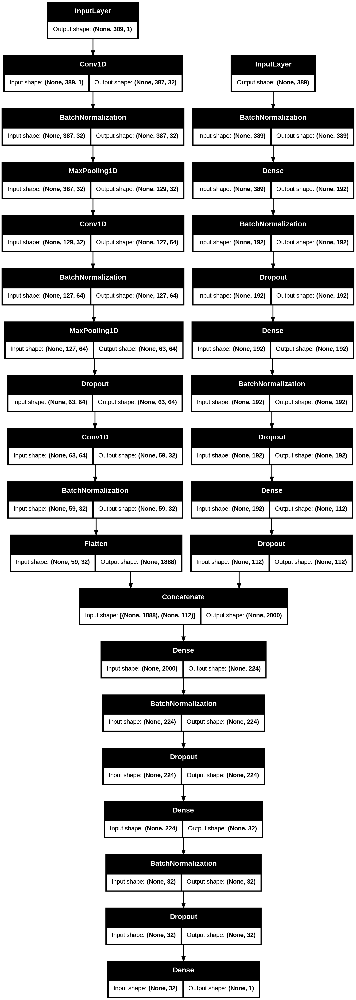

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import plot_model

# Define input shapes for both CNN and FCNN branches
cnn_input_shape = X_train_cnn.shape[1:]
fcnn_input_shape = X_train.shape[1]

# CNN branch
cnn_input = Input(shape=cnn_input_shape, name='CNN_Input')
x = Conv1D(filters=32, kernel_size=3, activation='relu')(cnn_input)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=3)(x)

x = Conv1D(filters=64, kernel_size=3, activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.4)(x)

x = Conv1D(filters=32, kernel_size=5, activation='relu')(x)
x = BatchNormalization()(x)

x = Flatten()(x)

# FCNN branch
fcnn_input = Input(shape=(fcnn_input_shape,), name='FCNN_Input')
y = BatchNormalization()(fcnn_input)

y = Dense(192, activation='relu')(y)
y = BatchNormalization()(y)
y = Dropout(0.30000000000000004)(y)

y = Dense(192, activation='relu')(y)
y = BatchNormalization()(y)
y = Dropout(0.1)(y)

y = Dense(112, activation='relu')(y)
y = Dropout(0.5)(y)

# Concatenate the CNN and FCNN outputs
combined = Concatenate()([x, y])

# Final dense layers for regression
z = Dense(224, activation='relu')(combined)
z = BatchNormalization()(z)
z = Dropout(0.1)(z)

z = Dense(32, activation='relu')(z)
z = BatchNormalization()(z)
z = Dropout(0.30000000000000004)(z)

# Output layer for regression
output = Dense(1, name='Output')(z)

# Define the model
hybrid_model = Model(inputs=[cnn_input, fcnn_input], outputs=output)
print(hybrid_model.summary())
plot_model(hybrid_model, show_shapes=True)
#Tyler Burguillos 11/24

In [ ]:
# Compile the model
hybrid_model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("hybrid_model_1.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = hybrid_model.fit(
    [X_train_cnn, X_train],
    y_train,
    validation_data=([X_test_cnn, X_test], y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
#Tyler Burguillos 11/24


Epoch 1/1000

Epoch 1: val_loss improved from inf to 21.03994, saving model to hybrid_model_1.keras
168/168 - 21s - 123ms/step - loss: 38.4384 - root_mean_squared_error: 6.1999 - val_loss: 21.0399 - val_root_mean_squared_error: 4.5869
Epoch 2/1000

Epoch 2: val_loss improved from 21.03994 to 3.72348, saving model to hybrid_model_1.keras
168/168 - 1s - 6ms/step - loss: 16.8313 - root_mean_squared_error: 4.1026 - val_loss: 3.7235 - val_root_mean_squared_error: 1.9296
Epoch 3/1000

Epoch 3: val_loss improved from 3.72348 to 0.83920, saving model to hybrid_model_1.keras
168/168 - 1s - 5ms/step - loss: 4.7584 - root_mean_squared_error: 2.1814 - val_loss: 0.8392 - val_root_mean_squared_error: 0.9161
Epoch 4/1000

Epoch 4: val_loss improved from 0.83920 to 0.39793, saving model to hybrid_model_1.keras
168/168 - 1s - 6ms/step - loss: 3.0928 - root_mean_squared_error: 1.7586 - val_loss: 0.3979 - val_root_mean_squared_error: 0.6308
Epoch 5/1000

Epoch 5: val_loss improved from 0.39793 to 0.24134

42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step
Hybrid Model - RMSE: 0.0946, R²: 0.9873, MAPE: 0.6512%


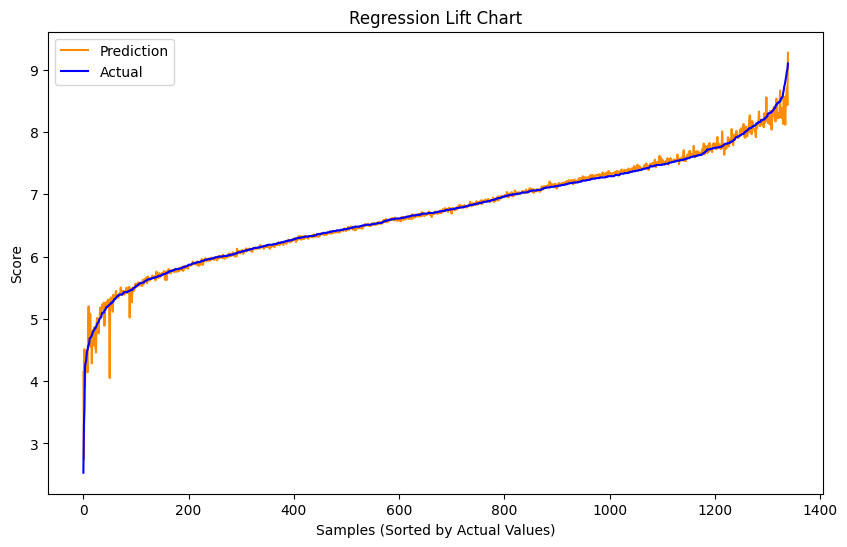

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

# Function to generate and display the regression lift chart
def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

# Evaluation function for RMSE, R², and MAPE
def evaluate_model(model, X_test_cnn, X_test, y_test):
    y_pred = model.predict([X_test_cnn, X_test])
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run the evaluation on the hybrid model and plot results
y_pred, rmse, r2, mape = evaluate_model(hybrid_model, X_test_cnn, X_test, y_test)
print(f"Hybrid Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

#Tyler Burguillos 11/24


In [ ]:
from sklearn.model_selection import train_test_split

titles_train, titles_test = train_test_split(
    titles, test_size=0.2, random_state=42, shuffle=True
)

results_df = pd.DataFrame({
    'Title': titles_test[:5].values,
    'Predicted Score': y_pred[:5].flatten(),
    'Actual Score': y_test[:5].flatten()
})

results_df
#Tyler Burguillos 11/24


,Title,Predicted Score,Actual Score
0,Honoo no Alpenrose: Judy & Randy,6.676205,6.69
1,Akuma-kun,6.715484,6.73
2,Kujibiki Unbalance,6.087149,6.08
3,Meikyuu Black Company,7.307475,7.26
4,Aoharu x Kikanjuu,7.211466,7.16


#### Model 2 (Patience = 30)

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define input shapes for both CNN and FCNN branches
cnn_input_shape = X_train_cnn.shape[1:]
fcnn_input_shape = X_train.shape[1]

# CNN branch
cnn_input = Input(shape=cnn_input_shape, name='CNN_Input')
x = Conv1D(filters=128, kernel_size=5, activation='sigmoid')(cnn_input)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=2)(x)

x = Conv1D(filters=64, kernel_size=3, activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.2)(x)

x = Conv1D(filters=32, kernel_size=3, activation='sigmoid')(x)
x = BatchNormalization()(x)

x = Flatten()(x)

# FCNN branch
fcnn_input = Input(shape=(fcnn_input_shape,), name='FCNN_Input')
y = BatchNormalization()(fcnn_input)

y = Dense(384, activation='relu')(y)
y = BatchNormalization()(y)
y = Dropout(0.2)(y)

y = Dense(64, activation='relu')(y)
y = BatchNormalization()(y)
y = Dropout(0.4)(y)

y = Dense(64, activation='relu')(y)
y = Dropout(0.2)(y)

# Concatenate the CNN and FCNN outputs
combined = Concatenate()([x, y])

# Final dense layers for regression
z = Dense(128, activation='relu')(combined)
z = BatchNormalization()(z)
z = Dropout(0.3)(z)

z = Dense(64, activation='relu')(z)
z = BatchNormalization()(z)
z = Dropout(0.3)(z)

z = Dense(32, activation='relu')(z)

# Output layer for regression
output = Dense(1, name='Output')(z)


# Define the model
hybrid_model = Model(inputs=[cnn_input, fcnn_input], outputs=output)

# Compile the model
hybrid_model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True)

# Train the model
history = hybrid_model.fit(
    [X_train_cnn, X_train],
    y_train,
    validation_data=([X_test_cnn, X_test], y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)
# Tyler Burguillos 11/13/2024

Epoch 1/1000
168/168 - 37s - 218ms/step - loss: 9.1952 - root_mean_squared_error: 3.0324 - val_loss: 14.0775 - val_root_mean_squared_error: 3.7520
Epoch 2/1000
168/168 - 1s - 9ms/step - loss: 2.0259 - root_mean_squared_error: 1.4233 - val_loss: 1.1724 - val_root_mean_squared_error: 1.0828
Epoch 3/1000
168/168 - 3s - 16ms/step - loss: 1.5575 - root_mean_squared_error: 1.2480 - val_loss: 0.5026 - val_root_mean_squared_error: 0.7090
Epoch 4/1000
168/168 - 2s - 14ms/step - loss: 1.1701 - root_mean_squared_error: 1.0817 - val_loss: 0.1578 - val_root_mean_squared_error: 0.3972
Epoch 5/1000
168/168 - 1s - 8ms/step - loss: 0.9209 - root_mean_squared_error: 0.9596 - val_loss: 0.1699 - val_root_mean_squared_error: 0.4122
Epoch 6/1000
168/168 - 3s - 20ms/step - loss: 0.7809 - root_mean_squared_error: 0.8837 - val_loss: 0.3600 - val_root_mean_squared_error: 0.6000
Epoch 7/1000
168/168 - 2s - 15ms/step - loss: 0.7230 - root_mean_squared_error: 0.8503 - val_loss: 0.1591 - val_root_mean_squared_error

42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step
Hybrid Model - RMSE: 0.2186, R²: 0.9322, MAPE: 2.4157%


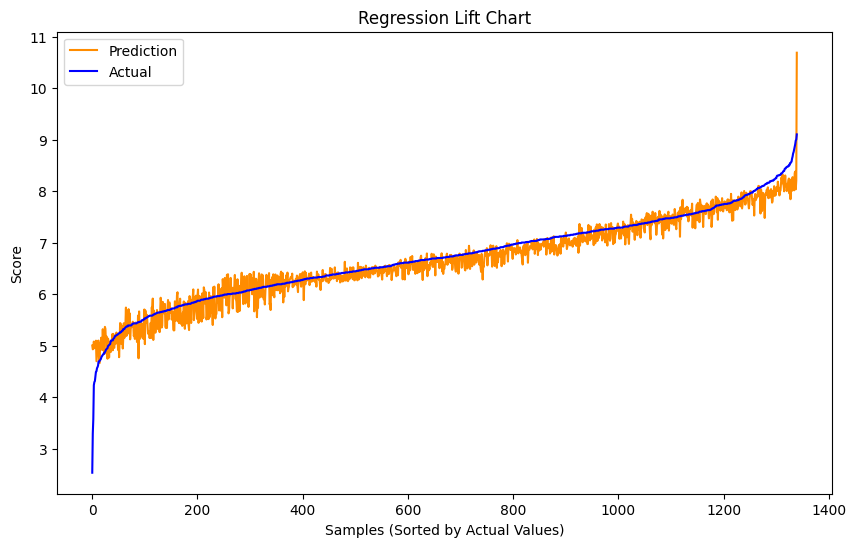

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

# Function to generate and display the regression lift chart
def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

# Evaluation function for RMSE, R², and MAPE
def evaluate_model(model, X_test_cnn, X_test, y_test):
    y_pred = model.predict([X_test_cnn, X_test])
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run the evaluation on the hybrid model and plot results
y_pred, rmse, r2, mape = evaluate_model(hybrid_model, X_test_cnn, X_test, y_test)
print(f"Hybrid Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
# Tyler Burguillos 11/13/2024

#### Model 3 (Patience = 40)

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define input shapes for both CNN and FCNN branches
cnn_input_shape = X_train_cnn.shape[1:]
fcnn_input_shape = X_train.shape[1]

# CNN branch
cnn_input = Input(shape=cnn_input_shape, name='CNN_Input')
x = Conv1D(filters=128, kernel_size=5, activation='sigmoid')(cnn_input)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=2)(x)

x = Conv1D(filters=64, kernel_size=3, activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.2)(x)

x = Conv1D(filters=32, kernel_size=3, activation='sigmoid')(x)
x = BatchNormalization()(x)

x = Flatten()(x)

# FCNN branch
fcnn_input = Input(shape=(fcnn_input_shape,), name='FCNN_Input')
y = BatchNormalization()(fcnn_input)

y = Dense(384, activation='relu')(y)
y = BatchNormalization()(y)
y = Dropout(0.2)(y)

y = Dense(64, activation='relu')(y)
y = BatchNormalization()(y)
y = Dropout(0.4)(y)

y = Dense(64, activation='relu')(y)
y = Dropout(0.2)(y)

# Concatenate the CNN and FCNN outputs
combined = Concatenate()([x, y])

# Final dense layers for regression
z = Dense(128, activation='relu')(combined)
z = BatchNormalization()(z)
z = Dropout(0.3)(z)

z = Dense(64, activation='relu')(z)
z = BatchNormalization()(z)
z = Dropout(0.3)(z)

z = Dense(32, activation='relu')(z)

# Output layer for regression
output = Dense(1, name='Output')(z)


# Define the model
hybrid_model = Model(inputs=[cnn_input, fcnn_input], outputs=output)

# Compile the model
hybrid_model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=40, restore_best_weights=True)

# Train the model
history = hybrid_model.fit(
    [X_train_cnn, X_train],
    y_train,
    validation_data=([X_test_cnn, X_test], y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=2
)
# Tyler Burguillos 11/13/2024

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

# Function to generate and display the regression lift chart
def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

# Evaluation function for RMSE, R², and MAPE
def evaluate_model(model, X_test_cnn, X_test, y_test):
    y_pred = model.predict([X_test_cnn, X_test])
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run the evaluation on the hybrid model and plot results
y_pred, rmse, r2, mape = evaluate_model(hybrid_model, X_test_cnn, X_test, y_test)
print(f"Hybrid Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)
# Tyler Burguillos 11/13/2024

In [ ]:
from sklearn.model_selection import train_test_split

titles_train, titles_test = train_test_split(
    titles, test_size=0.2, random_state=42, shuffle=True
)

results_df = pd.DataFrame({
    'Title': titles_test[:5].values,
    'Predicted Score': y_pred[:5].flatten(),
    'Actual Score': y_test[:5].flatten()
})

results_df
# Tyler Burguillos 11/13/2024

#### Model 5 (Austin Nolte, model 2 from FCNN and model 4 from CNN)

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define input shapes for both CNN and FCNN branches
cnn_input_shape = X_train_cnn.shape[1:]
fcnn_input_shape = X_train.shape[1]

# CNN Branch

cnn_input = Input(shape=cnn_input_shape, name='CNN_Input')

x = Conv1D(filters=128, kernel_size=5, activation='sigmoid')(cnn_input)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=2)(x)

x = Conv1D(filters=64, kernel_size=3, activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.2)(x)

x = Conv1D(filters=32, kernel_size=3, activation='sigmoid')(x)
x = BatchNormalization()(x)

x = Flatten()(x)

x = Dense(64,activation='relu')(x)
x = BatchNormalization()(x)
x = Dense(32,activation='sigmoid')(x)

# FCNN branch
fcnn_input = Input(shape=(fcnn_input_shape,),name='FCNN_Input')

y = BatchNormalization()(fcnn_input)
y = Dense(512,activation='relu')(y)
y = BatchNormalization()(y)

y = Dense(256,activation='relu')(y)
y = BatchNormalization()(y)

y = Dense(128,activation='sigmoid')(y)
y = Dense(64,activation='sigmoid')(y)
y = Dense(32,activation='sigmoid')(y)

y = BatchNormalization()(y)


# Concatenate the CNN and FCNN outputs
combined = Concatenate()([x, y])

# Final dense layers for regression
z = Dense(64, activation='relu')(combined)
z = BatchNormalization()(z)
z = Dropout(0.2)(z)

z = Dense(32, activation='relu')(z)
z = BatchNormalization()(z)
z = Dropout(0.2)(z)

z = Dense(16, activation='relu')(z)

# Output layer for regression
output = Dense(1, name='Output')(z)


# Define the model
hybrid_model = Model(inputs=[cnn_input, fcnn_input], outputs=output)

# Compile the model
hybrid_model.compile(optimizer=Adam(learning_rate=0.0001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=40, restore_best_weights=True)
checkpoint = ModelCheckpoint("AustinNolte_hybrid_model_.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = hybrid_model.fit(
    [X_train_cnn, X_train],
    y_train,
    validation_data=([X_test_cnn, X_test], y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=2
)

# Austin Nolte 11/23

Epoch 1/1000

Epoch 1: val_loss improved from inf to 43.38192, saving model to AustinNolte_hybrid_model_.keras
168/168 - 45s - 267ms/step - loss: 41.1577 - root_mean_squared_error: 6.4154 - val_loss: 43.3819 - val_root_mean_squared_error: 6.5865
Epoch 2/1000

Epoch 2: val_loss improved from 43.38192 to 27.68219, saving model to AustinNolte_hybrid_model_.keras
168/168 - 1s - 9ms/step - loss: 28.6342 - root_mean_squared_error: 5.3511 - val_loss: 27.6822 - val_root_mean_squared_error: 5.2614
Epoch 3/1000

Epoch 3: val_loss improved from 27.68219 to 13.12771, saving model to AustinNolte_hybrid_model_.keras
168/168 - 1s - 8ms/step - loss: 17.4491 - root_mean_squared_error: 4.1772 - val_loss: 13.1277 - val_root_mean_squared_error: 3.6232
Epoch 4/1000

Epoch 4: val_loss improved from 13.12771 to 4.32047, saving model to AustinNolte_hybrid_model_.keras
168/168 - 1s - 8ms/step - loss: 9.8864 - root_mean_squared_error: 3.1443 - val_loss: 4.3205 - val_root_mean_squared_error: 2.0786
Epoch 5/1000


42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step
Hybrid Model - RMSE: 0.1535, R²: 0.9666, MAPE: 1.4041%


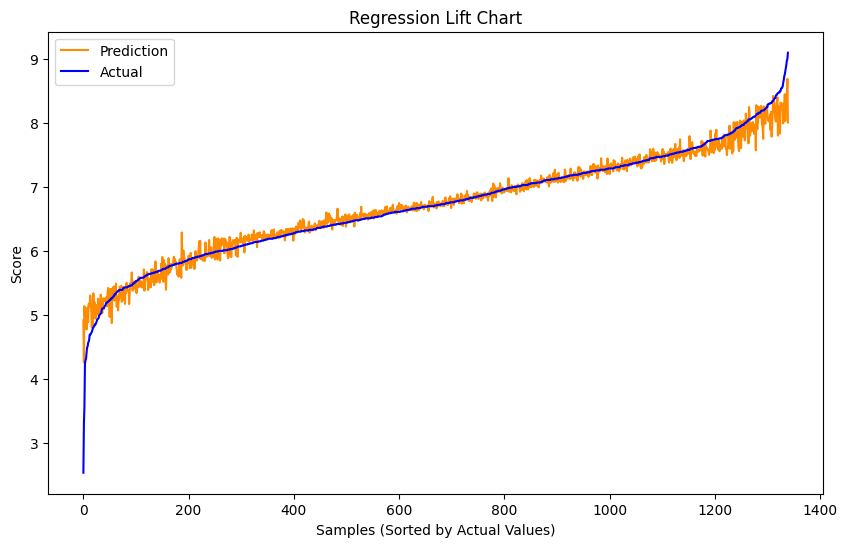

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

# Function to generate and display the regression lift chart
def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

# Evaluation function for RMSE, R², and MAPE
def evaluate_model(model, X_test_cnn, X_test, y_test):
    y_pred = model.predict([X_test_cnn, X_test])
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run the evaluation on the hybrid model and plot results
y_pred, rmse, r2, mape = evaluate_model(hybrid_model, X_test_cnn, X_test, y_test)
print(f"Hybrid Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

In [ ]:
from sklearn.model_selection import train_test_split

titles_train, titles_test = train_test_split(
    titles, test_size=0.2, random_state=42, shuffle=True
)

results_df = pd.DataFrame({
    'Title': titles_test[:5].values,
    'Predicted Score': y_pred[:5].flatten(),
    'Actual Score': y_test[:5].flatten()
})

results_df

,Title,Predicted Score,Actual Score
0,Honoo no Alpenrose: Judy & Randy,6.706934,6.69
1,Akuma-kun,6.753367,6.73
2,Kujibiki Unbalance,6.161646,6.08
3,Meikyuu Black Company,7.318407,7.26
4,Aoharu x Kikanjuu,7.173808,7.16


## Data Pre Processing for classification models

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

# Define the categories for Score
def categorize_score(score):
    if score < 5:       # Adjust thresholds as necessary based on the dataset's range
        return 'low'
    elif score < 7.5:
        return 'medium'
    else:
        return 'high'

# Add a new column for Score_Category
df['Score_Category'] = df['Score'].apply(categorize_score)

# Encode categories into numerical values
le = preprocessing.LabelEncoder()
df['Score_Category_Encoded'] = le.fit_transform(df['Score_Category'])
categories = le.classes_
print("Encoded Categories:", categories)

# Use preprocessed `X` for inputs and the encoded category column as the target
y_categorical = df['Score_Category_Encoded'].values  # Target for categorical model

# Perform train-test split
X_train_cat, X_test_cat, y_train_cat, y_test_cat = train_test_split(
    X, y_categorical, test_size=0.2, random_state=42, shuffle=True
)
# Tyler Burguillos 11/17/2024



Encoded Categories: ['high' 'low' 'medium']


<ipython-input-18-df5582ea5bc5>:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Score_Category'] = df['Score'].apply(categorize_score)
<ipython-input-18-df5582ea5bc5>:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Score_Category_Encoded'] = le.fit_transform(df['Score_Category'])


In [ ]:
class_weights = {0: 5, 1: 15, 2: 1}  # Adjust based on experimentation

print("Class Weights:", class_weights)
# Tyler Burguillos 11/17/2024



Class Weights: {0: 5, 1: 15, 2: 1}


## Classification Models (Tyler Burguillos)

### Model 1

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

# Build the model
model = Sequential([

    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(len(categories), activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train, y_train_cat,  # Use the original unbalanced dataset
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,  # Apply the class weights here
    callbacks=[early_stopping],
    verbose=2
)
# Tyler Burguillos 11/17/2024

Epoch 1/100
168/168 - 7s - 40ms/step - accuracy: 0.4263 - loss: 2.5052 - val_accuracy: 0.5530 - val_loss: 1.0077
Epoch 2/100
168/168 - 3s - 16ms/step - accuracy: 0.5442 - loss: 1.7880 - val_accuracy: 0.6455 - val_loss: 0.8259
Epoch 3/100
168/168 - 1s - 8ms/step - accuracy: 0.6064 - loss: 1.5410 - val_accuracy: 0.6515 - val_loss: 0.7611
Epoch 4/100
168/168 - 1s - 6ms/step - accuracy: 0.6138 - loss: 1.3937 - val_accuracy: 0.6701 - val_loss: 0.7263
Epoch 5/100
168/168 - 1s - 8ms/step - accuracy: 0.6601 - loss: 1.2463 - val_accuracy: 0.6604 - val_loss: 0.7257
Epoch 6/100
168/168 - 1s - 4ms/step - accuracy: 0.6667 - loss: 1.2014 - val_accuracy: 0.6858 - val_loss: 0.7014
Epoch 7/100
168/168 - 1s - 4ms/step - accuracy: 0.6962 - loss: 1.1508 - val_accuracy: 0.6978 - val_loss: 0.6650
Epoch 8/100
168/168 - 1s - 7ms/step - accuracy: 0.6990 - loss: 1.1252 - val_accuracy: 0.7000 - val_loss: 0.6495
Epoch 9/100
168/168 - 1s - 7ms/step - accuracy: 0.6975 - loss: 1.1125 - val_accuracy: 0.6858 - val_los

Test Accuracy: 0.7104
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step

Classification Report:
              precision    recall  f1-score   support

        high       0.38      0.75      0.51       228
         low       0.03      0.03      0.03        31
      medium       0.90      0.72      0.80      1081

    accuracy                           0.71      1340
   macro avg       0.44      0.50      0.45      1340
weighted avg       0.80      0.71      0.73      1340



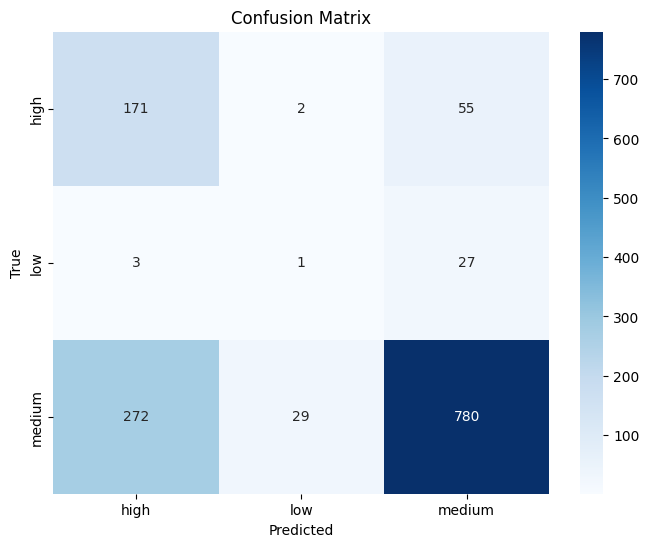

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


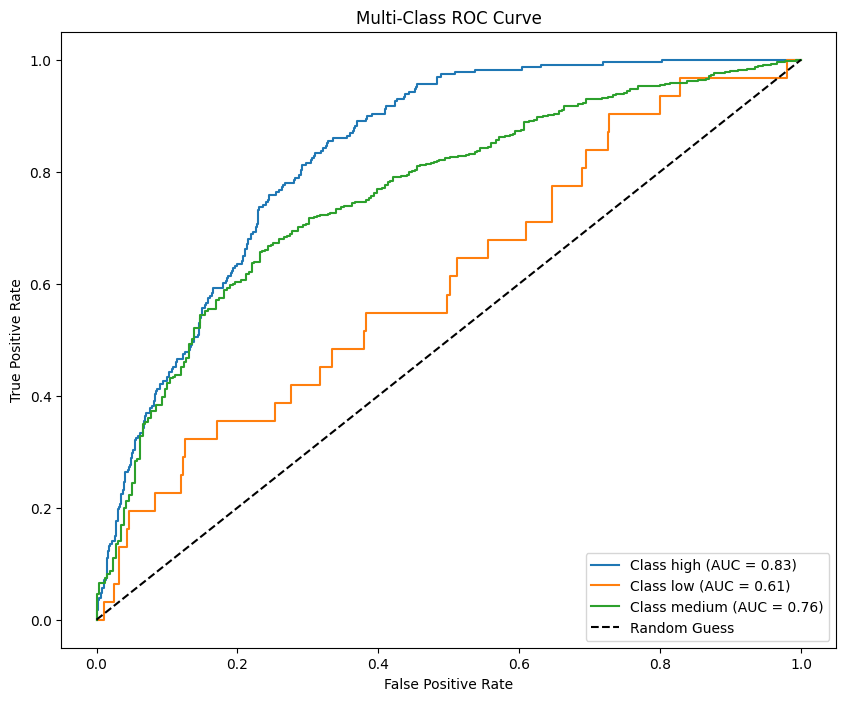

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test_cat, y_test_cat, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate predictions
y_pred_cat = np.argmax(model.predict(X_test_cat), axis=1)

print("\nClassification Report:")
print(classification_report(y_test_cat, y_pred_cat, target_names=categories, zero_division=0))

# Confusion Matrix
cm = confusion_matrix(y_test_cat, y_pred_cat)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve (One-vs-Rest)
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the test labels for multi-class ROC
y_test_binarized = label_binarize(y_test_cat, classes=np.arange(len(categories)))
y_pred_proba = model.predict(X_test_cat)

# Compute ROC curve and ROC area for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(categories)):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(categories)):
    plt.plot(fpr[i], tpr[i], label=f'Class {categories[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc='lower right')
plt.show()
# Tyler Burguillos 11/17/2024

### Model 2

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

# Build the model
model = Sequential([

    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(len(categories), activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train, y_train_cat,  # Use the original unbalanced dataset
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,  # Apply the class weights here
    callbacks=[early_stopping],
    verbose=2
)
# Tyler Burguillos 11/17/2024

Epoch 1/100
168/168 - 5s - 27ms/step - accuracy: 0.4517 - loss: 2.4478 - val_accuracy: 0.5410 - val_loss: 1.0404
Epoch 2/100
168/168 - 2s - 12ms/step - accuracy: 0.6012 - loss: 1.5492 - val_accuracy: 0.6664 - val_loss: 0.7725
Epoch 3/100
168/168 - 1s - 7ms/step - accuracy: 0.6579 - loss: 1.2885 - val_accuracy: 0.6851 - val_loss: 0.6881
Epoch 4/100
168/168 - 1s - 8ms/step - accuracy: 0.6934 - loss: 1.1345 - val_accuracy: 0.6940 - val_loss: 0.6642
Epoch 5/100
168/168 - 1s - 8ms/step - accuracy: 0.7288 - loss: 1.0166 - val_accuracy: 0.7142 - val_loss: 0.6416
Epoch 6/100
168/168 - 3s - 18ms/step - accuracy: 0.7516 - loss: 0.9269 - val_accuracy: 0.7015 - val_loss: 0.6915
Epoch 7/100
168/168 - 3s - 17ms/step - accuracy: 0.7561 - loss: 0.9224 - val_accuracy: 0.7269 - val_loss: 0.6121
Epoch 8/100
168/168 - 2s - 10ms/step - accuracy: 0.7723 - loss: 0.8515 - val_accuracy: 0.7448 - val_loss: 0.5916
Epoch 9/100
168/168 - 1s - 7ms/step - accuracy: 0.7900 - loss: 0.8000 - val_accuracy: 0.7351 - val_

Test Accuracy: 0.7448
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

Classification Report:
              precision    recall  f1-score   support

        high       0.40      0.62      0.49       228
         low       0.11      0.06      0.08        31
      medium       0.88      0.79      0.83      1081

    accuracy                           0.74      1340
   macro avg       0.46      0.49      0.47      1340
weighted avg       0.78      0.74      0.76      1340



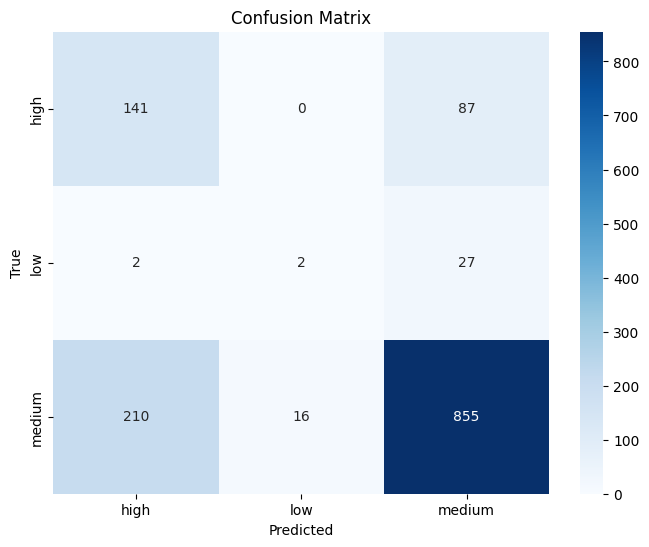

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


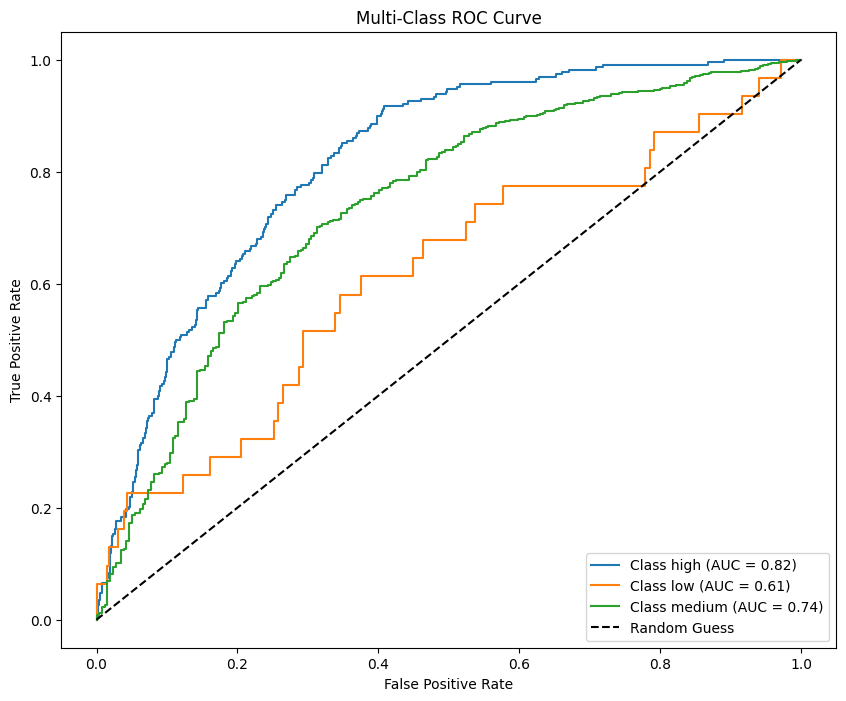

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test_cat, y_test_cat, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate predictions
y_pred_cat = np.argmax(model.predict(X_test_cat), axis=1)

print("\nClassification Report:")
print(classification_report(y_test_cat, y_pred_cat, target_names=categories, zero_division=0))

# Confusion Matrix
cm = confusion_matrix(y_test_cat, y_pred_cat)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve (One-vs-Rest)
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the test labels for multi-class ROC
y_test_binarized = label_binarize(y_test_cat, classes=np.arange(len(categories)))
y_pred_proba = model.predict(X_test_cat)

# Compute ROC curve and ROC area for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(categories)):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(categories)):
    plt.plot(fpr[i], tpr[i], label=f'Class {categories[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc='lower right')
plt.show()
# Tyler Burguillos 11/17/2024


### Model 3

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

# Build the model
model = Sequential([

    Dense(360, activation='relu'),
    BatchNormalization(),
    #Dropout(0.1),

    Dense(128, activation='relu'),
    BatchNormalization(),
    #Dropout(0.1),

    Dense(64, activation='relu'),
    BatchNormalization(),
    #Dropout(0.1),

    Dense(len(categories), activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0005), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train, y_train_cat,  # Use the original unbalanced dataset
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,  # Apply the class weights here
    callbacks=[early_stopping],
    verbose=2
)
# Tyler Burguillos 11/17/2024



Epoch 1/100
168/168 - 11s - 67ms/step - accuracy: 0.4375 - loss: 2.2970 - val_accuracy: 0.4313 - val_loss: 1.1354
Epoch 2/100
168/168 - 2s - 12ms/step - accuracy: 0.6047 - loss: 1.3287 - val_accuracy: 0.6187 - val_loss: 0.8565
Epoch 3/100
168/168 - 2s - 13ms/step - accuracy: 0.7199 - loss: 1.0186 - val_accuracy: 0.6813 - val_loss: 0.7415
Epoch 4/100
168/168 - 2s - 12ms/step - accuracy: 0.7941 - loss: 0.8089 - val_accuracy: 0.6970 - val_loss: 0.7273
Epoch 5/100
168/168 - 4s - 21ms/step - accuracy: 0.8415 - loss: 0.6904 - val_accuracy: 0.7104 - val_loss: 0.6895
Epoch 6/100
168/168 - 5s - 27ms/step - accuracy: 0.8611 - loss: 0.6150 - val_accuracy: 0.7142 - val_loss: 0.6872
Epoch 7/100
168/168 - 2s - 13ms/step - accuracy: 0.8748 - loss: 0.5205 - val_accuracy: 0.6828 - val_loss: 0.7655
Epoch 8/100
168/168 - 2s - 13ms/step - accuracy: 0.9009 - loss: 0.4483 - val_accuracy: 0.7104 - val_loss: 0.7421
Epoch 9/100
168/168 - 2s - 12ms/step - accuracy: 0.9044 - loss: 0.4315 - val_accuracy: 0.7463 -

Test Accuracy: 0.7142
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step

Classification Report:
              precision    recall  f1-score   support

        high       0.36      0.55      0.43       228
         low       0.08      0.10      0.09        31
      medium       0.87      0.77      0.81      1081

    accuracy                           0.71      1340
   macro avg       0.44      0.47      0.45      1340
weighted avg       0.76      0.71      0.73      1340



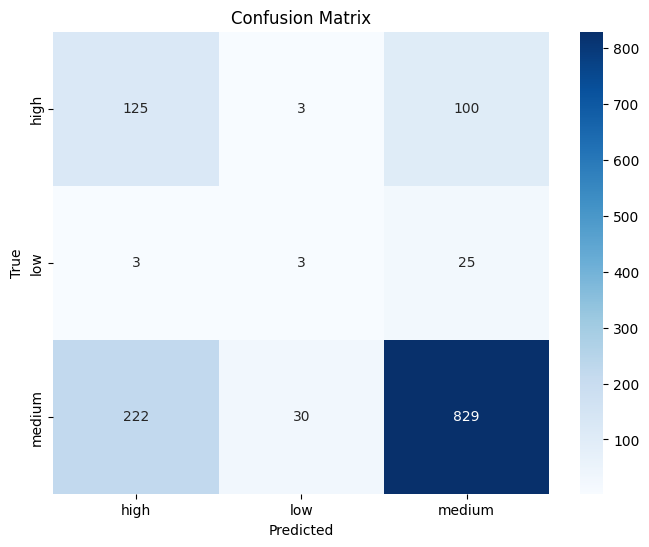

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


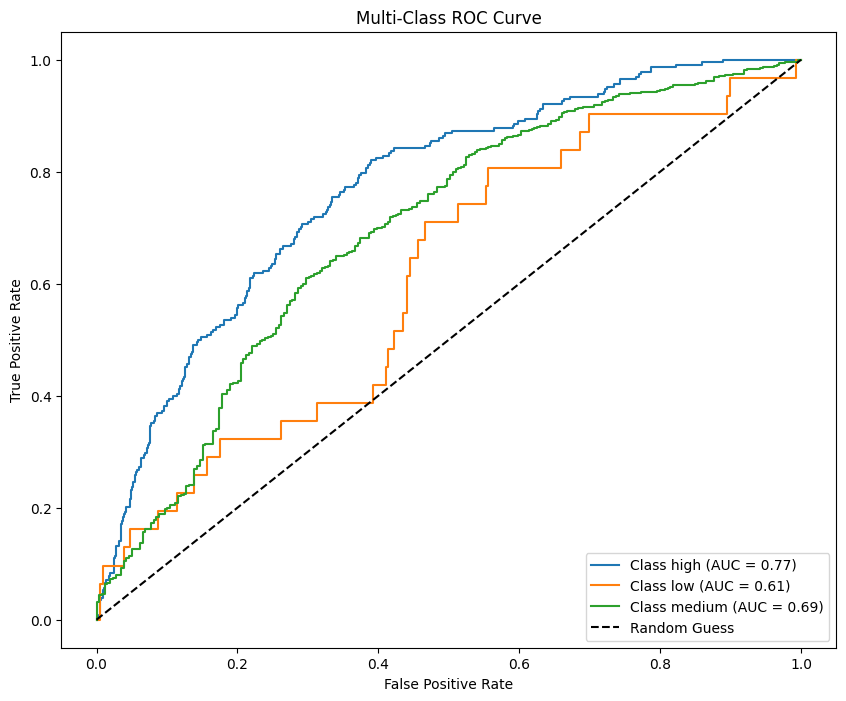

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test_cat, y_test_cat, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate predictions
y_pred_cat = np.argmax(model.predict(X_test_cat), axis=1)

print("\nClassification Report:")
print(classification_report(y_test_cat, y_pred_cat, target_names=categories, zero_division=0))

# Confusion Matrix
cm = confusion_matrix(y_test_cat, y_pred_cat)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve (One-vs-Rest)
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the test labels for multi-class ROC
y_test_binarized = label_binarize(y_test_cat, classes=np.arange(len(categories)))
y_pred_proba = model.predict(X_test_cat)

# Compute ROC curve and ROC area for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(categories)):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(categories)):
    plt.plot(fpr[i], tpr[i], label=f'Class {categories[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc='lower right')
plt.show()
# Tyler Burguillos 11/17/2024


## Classification Models(Austin Nolte)

### Model 1

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# Build the model
model = Sequential([

    Dense(64, activation='sigmoid'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(32, activation='relu'),
    BatchNormalization(),

    Dense(16, activation='sigmoid'),
    BatchNormalization(),
    Dropout(0.3),


    # len of categories is 3: low, medium and high
    Dense(len(categories), activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
checkpoint = ModelCheckpoint("AustinNolte_classification_model_1_.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)


# Train the model
history = model.fit(
    X_train, y_train_cat,  # Use the original unbalanced dataset
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,  # Apply the class weights here
    callbacks=[early_stopping,checkpoint],
    verbose=2
)

# Austin Nolte 11/23

Epoch 1/100

Epoch 1: val_loss improved from inf to 1.12050, saving model to AustinNolte_classification_model_1_.keras
168/168 - 10s - 59ms/step - accuracy: 0.4003 - loss: 2.5653 - val_accuracy: 0.3142 - val_loss: 1.1205
Epoch 2/100

Epoch 2: val_loss improved from 1.12050 to 0.98917, saving model to AustinNolte_classification_model_1_.keras
168/168 - 1s - 7ms/step - accuracy: 0.4535 - loss: 2.0645 - val_accuracy: 0.4709 - val_loss: 0.9892
Epoch 3/100

Epoch 3: val_loss improved from 0.98917 to 0.93157, saving model to AustinNolte_classification_model_1_.keras
168/168 - 1s - 7ms/step - accuracy: 0.4871 - loss: 1.9785 - val_accuracy: 0.5172 - val_loss: 0.9316
Epoch 4/100

Epoch 4: val_loss improved from 0.93157 to 0.90216, saving model to AustinNolte_classification_model_1_.keras
168/168 - 1s - 8ms/step - accuracy: 0.5256 - loss: 1.8838 - val_accuracy: 0.5388 - val_loss: 0.9022
Epoch 5/100

Epoch 5: val_loss improved from 0.90216 to 0.86532, saving model to AustinNolte_classification_mo

Test Accuracy: 0.6164
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

Classification Report:
              precision    recall  f1-score   support

        high       0.30      0.81      0.44       228
         low       0.06      0.03      0.04        31
      medium       0.91      0.59      0.72      1081

    accuracy                           0.62      1340
   macro avg       0.42      0.48      0.40      1340
weighted avg       0.78      0.62      0.65      1340



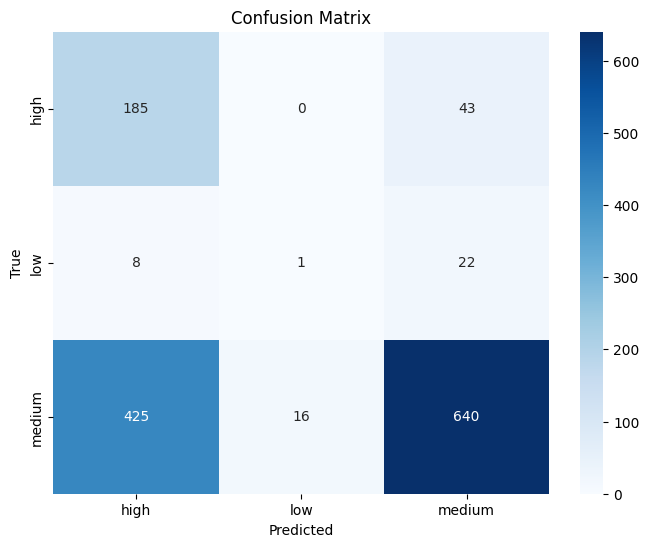

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


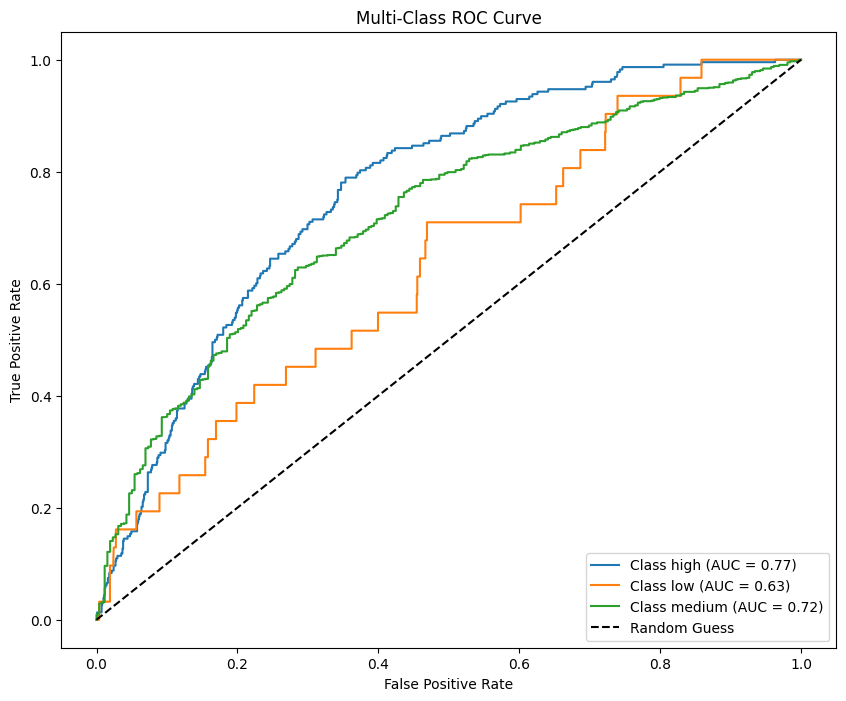

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test_cat, y_test_cat, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate predictions
y_pred_cat = np.argmax(model.predict(X_test_cat), axis=1)

print("\nClassification Report:")
print(classification_report(y_test_cat, y_pred_cat, target_names=categories, zero_division=0))

# Confusion Matrix
cm = confusion_matrix(y_test_cat, y_pred_cat)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve (One-vs-Rest)
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the test labels for multi-class ROC
y_test_binarized = label_binarize(y_test_cat, classes=np.arange(len(categories)))
y_pred_proba = model.predict(X_test_cat)

# Compute ROC curve and ROC area for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(categories)):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(categories)):
    plt.plot(fpr[i], tpr[i], label=f'Class {categories[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Austin Nolte 11/23

### Model 2

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# Build the model
model = Sequential([

    Dense(128, activation='sigmoid'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(64, activation='relu'),
    BatchNormalization(),

    Dense(32, activation='sigmoid'),
    BatchNormalization(),


    # len of categories is 3: low, medium and high
    Dense(len(categories), activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
checkpoint = ModelCheckpoint("AustinNolte_classification_model_2_.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)


# Train the model
history = model.fit(
    X_train, y_train_cat,  # Use the original unbalanced dataset
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,  # Apply the class weights here
    callbacks=[early_stopping,checkpoint],
    verbose=2
)

# Austin Nolte 11/23

Epoch 1/100

Epoch 1: val_loss improved from inf to 0.83691, saving model to AustinNolte_classification_model_2_.keras
168/168 - 12s - 71ms/step - accuracy: 0.4237 - loss: 2.1420 - val_accuracy: 0.6313 - val_loss: 0.8369
Epoch 2/100

Epoch 2: val_loss improved from 0.83691 to 0.80537, saving model to AustinNolte_classification_model_2_.keras
168/168 - 2s - 10ms/step - accuracy: 0.5429 - loss: 1.7980 - val_accuracy: 0.6448 - val_loss: 0.8054
Epoch 3/100

Epoch 3: val_loss improved from 0.80537 to 0.79817, saving model to AustinNolte_classification_model_2_.keras
168/168 - 2s - 9ms/step - accuracy: 0.5730 - loss: 1.7628 - val_accuracy: 0.6403 - val_loss: 0.7982
Epoch 4/100

Epoch 4: val_loss did not improve from 0.79817
168/168 - 1s - 7ms/step - accuracy: 0.5735 - loss: 1.7403 - val_accuracy: 0.5679 - val_loss: 0.8429
Epoch 5/100

Epoch 5: val_loss did not improve from 0.79817
168/168 - 2s - 11ms/step - accuracy: 0.5704 - loss: 1.7430 - val_accuracy: 0.5896 - val_loss: 0.8388
Epoch 6/100

Test Accuracy: 0.6216
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step

Classification Report:
              precision    recall  f1-score   support

        high       0.30      0.77      0.43       228
         low       0.17      0.19      0.18        31
      medium       0.91      0.60      0.72      1081

    accuracy                           0.62      1340
   macro avg       0.46      0.52      0.45      1340
weighted avg       0.79      0.62      0.66      1340



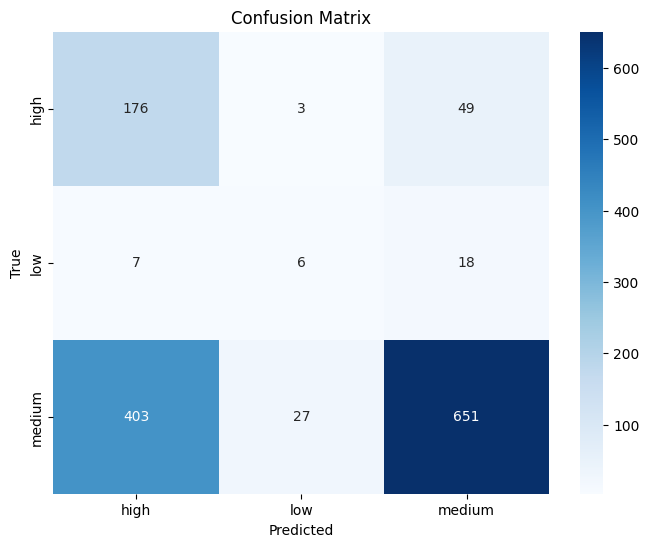

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


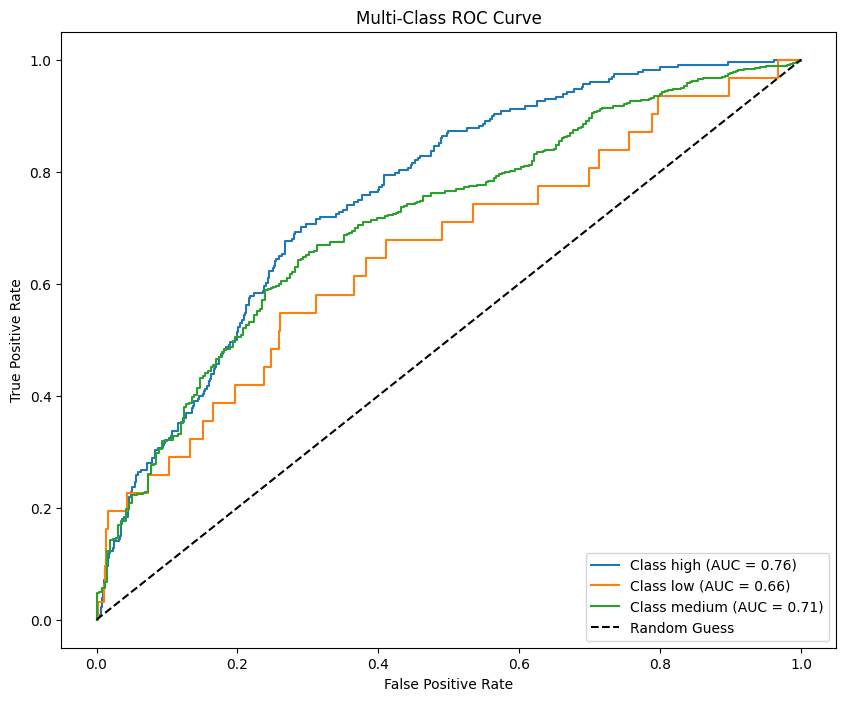

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test_cat, y_test_cat, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate predictions
y_pred_cat = np.argmax(model.predict(X_test_cat), axis=1)

print("\nClassification Report:")
print(classification_report(y_test_cat, y_pred_cat, target_names=categories, zero_division=0))

# Confusion Matrix
cm = confusion_matrix(y_test_cat, y_pred_cat)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve (One-vs-Rest)
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the test labels for multi-class ROC
y_test_binarized = label_binarize(y_test_cat, classes=np.arange(len(categories)))
y_pred_proba = model.predict(X_test_cat)

# Compute ROC curve and ROC area for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(categories)):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(categories)):
    plt.plot(fpr[i], tpr[i], label=f'Class {categories[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Austin Nolte 11/23

### Model 3

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# Build the model
class_weights = {0: 15, 1: 5, 2: 10}
model = Sequential([

    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(128, activation='relu'),
    BatchNormalization(),

    Dense(64, activation='sigmoid'),
    BatchNormalization(),
    Dropout(0.3),


    # len of categories is 3: low, medium and high
    Dense(len(categories), activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
checkpoint = ModelCheckpoint("AustinNolte_classification_model_1_.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)


# Train the model
history = model.fit(
    X_train, y_train_cat,  # Use the original unbalanced dataset
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,  # Apply the class weights here
    callbacks=[early_stopping,checkpoint],
    verbose=2
)

# Austin Nolte 11/23

Epoch 1/100

Epoch 1: val_loss improved from inf to 0.56432, saving model to AustinNolte_classification_model_1_.keras
168/168 - 6s - 37ms/step - accuracy: 0.5739 - loss: 11.0217 - val_accuracy: 0.8082 - val_loss: 0.5643
Epoch 2/100

Epoch 2: val_loss improved from 0.56432 to 0.47050, saving model to AustinNolte_classification_model_1_.keras
168/168 - 1s - 9ms/step - accuracy: 0.7564 - loss: 6.6572 - val_accuracy: 0.8067 - val_loss: 0.4705
Epoch 3/100

Epoch 3: val_loss improved from 0.47050 to 0.47036, saving model to AustinNolte_classification_model_1_.keras
168/168 - 2s - 13ms/step - accuracy: 0.7996 - loss: 5.4416 - val_accuracy: 0.8015 - val_loss: 0.4704
Epoch 4/100

Epoch 4: val_loss did not improve from 0.47036
168/168 - 3s - 15ms/step - accuracy: 0.8135 - loss: 4.9692 - val_accuracy: 0.8007 - val_loss: 0.4838
Epoch 5/100

Epoch 5: val_loss improved from 0.47036 to 0.46771, saving model to AustinNolte_classification_model_1_.keras
168/168 - 2s - 14ms/step - accuracy: 0.8266 - lo

Test Accuracy: 0.8067
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

Classification Report:
              precision    recall  f1-score   support

        high       0.50      0.33      0.40       228
         low       0.00      0.00      0.00        31
      medium       0.85      0.93      0.89      1081

    accuracy                           0.81      1340
   macro avg       0.45      0.42      0.43      1340
weighted avg       0.77      0.81      0.78      1340



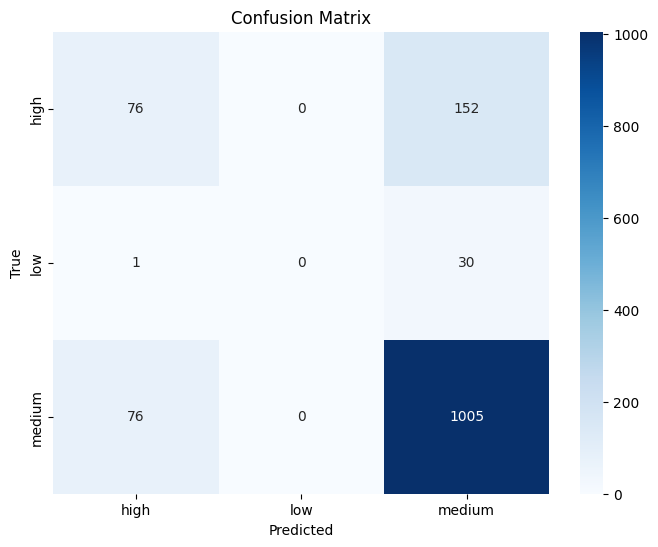

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


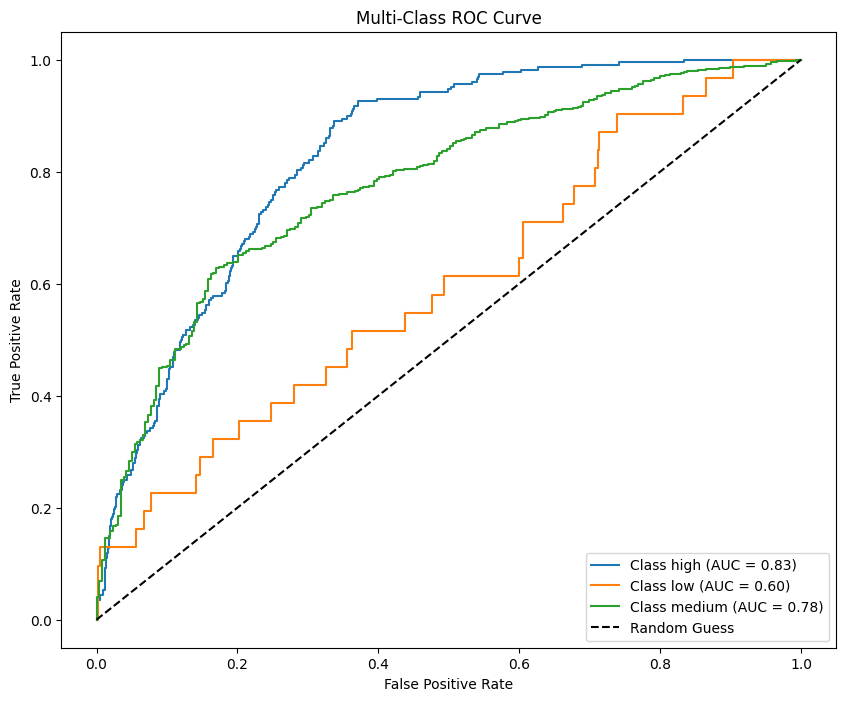

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test_cat, y_test_cat, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate predictions
y_pred_cat = np.argmax(model.predict(X_test_cat), axis=1)

print("\nClassification Report:")
print(classification_report(y_test_cat, y_pred_cat, target_names=categories, zero_division=0))

# Confusion Matrix
cm = confusion_matrix(y_test_cat, y_pred_cat)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve (One-vs-Rest)
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the test labels for multi-class ROC
y_test_binarized = label_binarize(y_test_cat, classes=np.arange(len(categories)))
y_pred_proba = model.predict(X_test_cat)

# Compute ROC curve and ROC area for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(categories)):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(categories)):
    plt.plot(fpr[i], tpr[i], label=f'Class {categories[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Austin Nolte 11/23

### Model 4

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# Build the model
model = Sequential([

    Dense(512, activation='sigmoid'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(256, activation='relu'),
    BatchNormalization(),

    Dense(128, activation='sigmoid'),
    BatchNormalization(),
    Dropout(0.3),


    # len of categories is 3: low, medium and high
    Dense(len(categories), activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
checkpoint = ModelCheckpoint("AustinNolte_classification_model_1_.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)


# Train the model
history = model.fit(
    X_train, y_train_cat,  # Use the original unbalanced dataset
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,  # Apply the class weights here
    callbacks=[early_stopping,checkpoint],
    verbose=2
)

# Austin Nolte 11/23

Epoch 1/100

Epoch 1: val_loss improved from inf to 0.74808, saving model to AustinNolte_classification_model_1_.keras
168/168 - 8s - 46ms/step - accuracy: 0.4190 - loss: 2.5181 - val_accuracy: 0.7388 - val_loss: 0.7481
Epoch 2/100

Epoch 2: val_loss did not improve from 0.74808
168/168 - 5s - 28ms/step - accuracy: 0.5000 - loss: 1.9809 - val_accuracy: 0.6567 - val_loss: 0.7607
Epoch 3/100

Epoch 3: val_loss did not improve from 0.74808
168/168 - 5s - 28ms/step - accuracy: 0.5418 - loss: 1.8019 - val_accuracy: 0.5709 - val_loss: 0.8181
Epoch 4/100

Epoch 4: val_loss did not improve from 0.74808
168/168 - 2s - 13ms/step - accuracy: 0.5390 - loss: 1.7569 - val_accuracy: 0.5754 - val_loss: 0.8292
Epoch 5/100

Epoch 5: val_loss did not improve from 0.74808
168/168 - 2s - 14ms/step - accuracy: 0.5612 - loss: 1.6439 - val_accuracy: 0.6112 - val_loss: 0.7756
Epoch 6/100

Epoch 6: val_loss improved from 0.74808 to 0.74065, saving model to AustinNolte_classification_model_1_.keras
168/168 - 3s 

Test Accuracy: 0.6448
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step

Classification Report:
              precision    recall  f1-score   support

        high       0.33      0.74      0.45       228
         low       0.02      0.03      0.02        31
      medium       0.90      0.64      0.75      1081

    accuracy                           0.64      1340
   macro avg       0.41      0.47      0.41      1340
weighted avg       0.78      0.64      0.68      1340



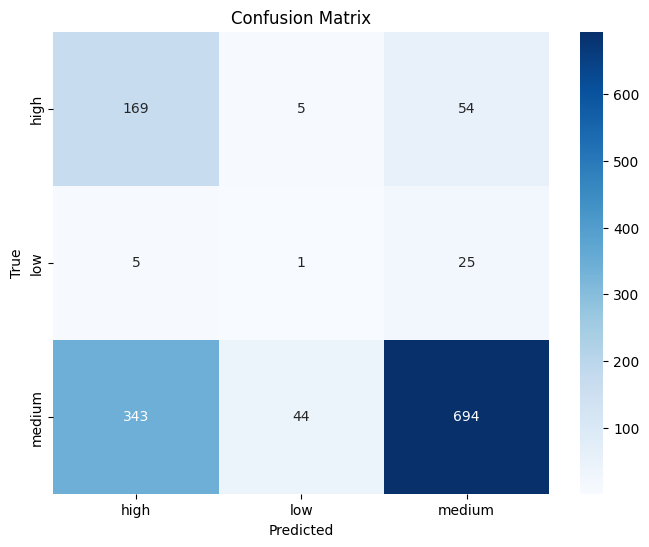

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


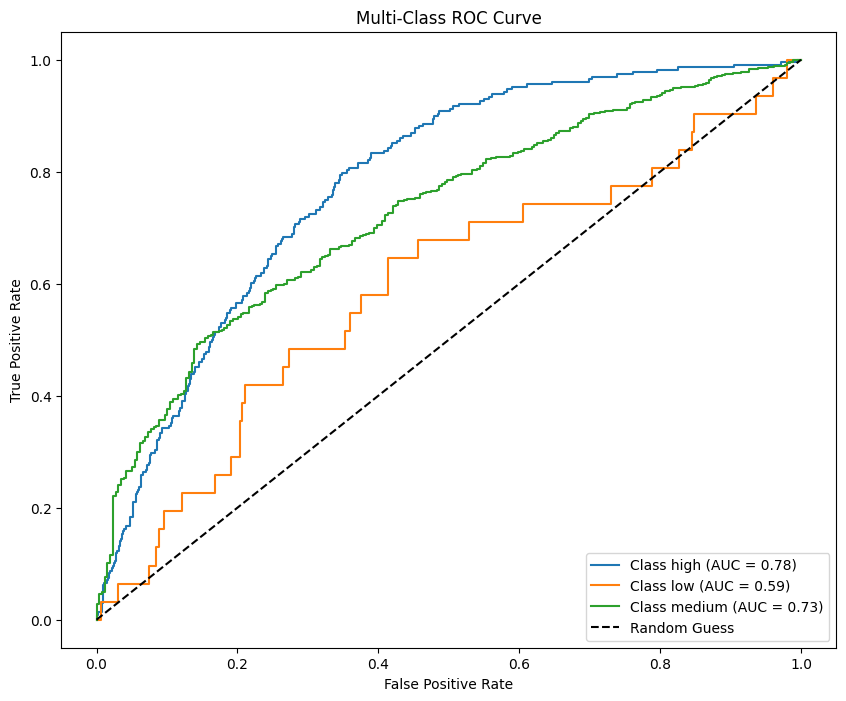

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test_cat, y_test_cat, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate predictions
y_pred_cat = np.argmax(model.predict(X_test_cat), axis=1)

print("\nClassification Report:")
print(classification_report(y_test_cat, y_pred_cat, target_names=categories, zero_division=0))

# Confusion Matrix
cm = confusion_matrix(y_test_cat, y_pred_cat)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve (One-vs-Rest)
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the test labels for multi-class ROC
y_test_binarized = label_binarize(y_test_cat, classes=np.arange(len(categories)))
y_pred_proba = model.predict(X_test_cat)

# Compute ROC curve and ROC area for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(categories)):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(categories)):
    plt.plot(fpr[i], tpr[i], label=f'Class {categories[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Austin Nolte 11/23

## Classification Model (Alan Lei)

### Model 1


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, SGD

# Build the model
model = Sequential([

    Dense(512, activation='tanh'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(256, activation='tanh'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(128, activation='tanh'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(64, activation='tanh'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(32, activation='tanh'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(16, activation='tanh'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(len(categories), activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer=SGD(learning_rate=0.00055), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train, y_train_cat,  # Use the original unbalanced dataset
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,  # Apply the class weights here
    callbacks=[early_stopping],
    verbose=2
)

#Alan Lei 11/24

Epoch 1/100
168/168 - 3s - 19ms/step - accuracy: 0.3940 - loss: 2.4425 - val_accuracy: 0.5224 - val_loss: 0.9658
Epoch 2/100
168/168 - 1s - 6ms/step - accuracy: 0.5218 - loss: 1.7767 - val_accuracy: 0.6164 - val_loss: 0.8270
Epoch 3/100
168/168 - 1s - 8ms/step - accuracy: 0.5827 - loss: 1.5288 - val_accuracy: 0.6657 - val_loss: 0.7508
Epoch 4/100
168/168 - 1s - 6ms/step - accuracy: 0.6292 - loss: 1.3658 - val_accuracy: 0.6552 - val_loss: 0.7455
Epoch 5/100
168/168 - 1s - 8ms/step - accuracy: 0.6422 - loss: 1.3110 - val_accuracy: 0.6776 - val_loss: 0.7026
Epoch 6/100
168/168 - 1s - 6ms/step - accuracy: 0.6751 - loss: 1.1980 - val_accuracy: 0.6843 - val_loss: 0.6689
Epoch 7/100
168/168 - 2s - 9ms/step - accuracy: 0.6655 - loss: 1.1563 - val_accuracy: 0.6761 - val_loss: 0.7041
Epoch 8/100
168/168 - 1s - 6ms/step - accuracy: 0.6930 - loss: 1.1215 - val_accuracy: 0.7052 - val_loss: 0.6464
Epoch 9/100
168/168 - 1s - 4ms/step - accuracy: 0.7102 - loss: 1.0989 - val_accuracy: 0.7082 - val_loss

Test Accuracy: 0.7082
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

Classification Report:
              precision    recall  f1-score   support

        high       0.40      0.79      0.53       228
         low       0.04      0.06      0.05        31
      medium       0.91      0.71      0.80      1081

    accuracy                           0.71      1340
   macro avg       0.45      0.52      0.46      1340
weighted avg       0.81      0.71      0.74      1340



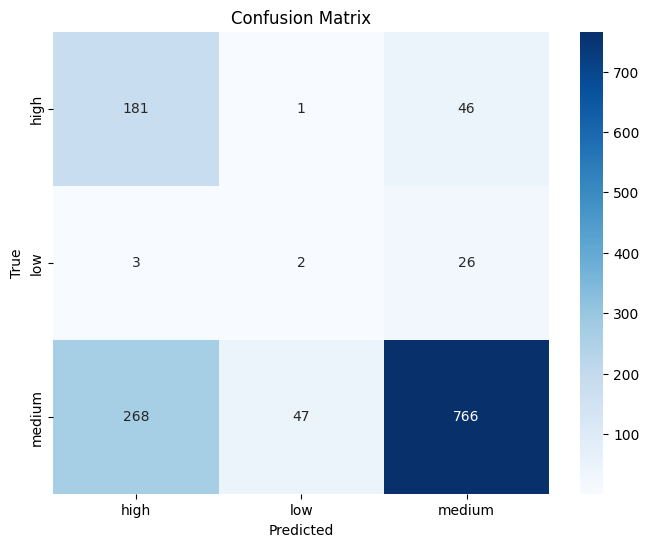

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


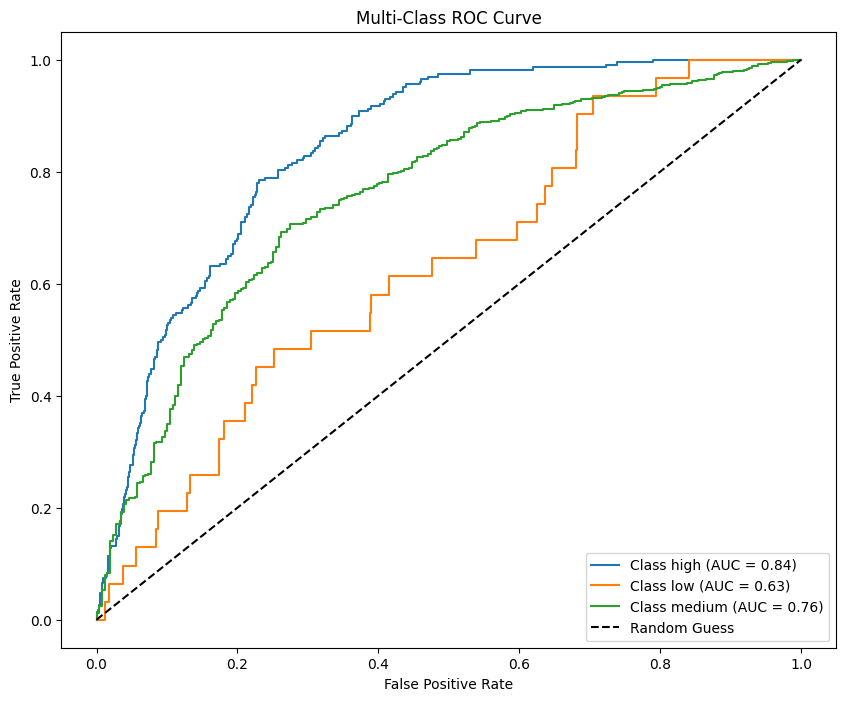

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test_cat, y_test_cat, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate predictions
y_pred_cat = np.argmax(model.predict(X_test_cat), axis=1)

print("\nClassification Report:")
print(classification_report(y_test_cat, y_pred_cat, target_names=categories, zero_division=0))

# Confusion Matrix
cm = confusion_matrix(y_test_cat, y_pred_cat)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve (One-vs-Rest)
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the test labels for multi-class ROC
y_test_binarized = label_binarize(y_test_cat, classes=np.arange(len(categories)))
y_pred_proba = model.predict(X_test_cat)

# Compute ROC curve and ROC area for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(categories)):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(categories)):
    plt.plot(fpr[i], tpr[i], label=f'Class {categories[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc='lower right')
plt.show()
#Alan Lei 11/24


### Model 2

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, SGD

# Build the model
model = Sequential([

    Dense(512, activation='tanh'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(256, activation='sigmoid'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(64, activation='tanh'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(32, activation='sigmoid'),
    BatchNormalization(),
    Dropout(0.3),


    Dense(len(categories), activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.00055), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train, y_train_cat,  # Use the original unbalanced dataset
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,  # Apply the class weights here
    callbacks=[early_stopping],
    verbose=2
)

#Alan Lei 11/24


Epoch 1/100
168/168 - 16s - 95ms/step - accuracy: 0.3921 - loss: 2.5636 - val_accuracy: 0.7261 - val_loss: 0.8206
Epoch 2/100
168/168 - 8s - 47ms/step - accuracy: 0.4347 - loss: 2.1530 - val_accuracy: 0.5627 - val_loss: 0.9047
Epoch 3/100
168/168 - 1s - 4ms/step - accuracy: 0.4813 - loss: 1.9459 - val_accuracy: 0.5664 - val_loss: 0.9068
Epoch 4/100
168/168 - 1s - 4ms/step - accuracy: 0.5075 - loss: 1.9236 - val_accuracy: 0.5642 - val_loss: 0.9316
Epoch 5/100
168/168 - 1s - 4ms/step - accuracy: 0.5278 - loss: 1.8325 - val_accuracy: 0.5709 - val_loss: 0.8868
Epoch 6/100
168/168 - 1s - 4ms/step - accuracy: 0.5424 - loss: 1.7768 - val_accuracy: 0.5396 - val_loss: 0.9238
Epoch 7/100
168/168 - 1s - 4ms/step - accuracy: 0.5444 - loss: 1.7404 - val_accuracy: 0.5701 - val_loss: 0.8745
Epoch 8/100
168/168 - 1s - 4ms/step - accuracy: 0.5704 - loss: 1.6647 - val_accuracy: 0.5731 - val_loss: 0.8685
Epoch 9/100
168/168 - 0s - 3ms/step - accuracy: 0.5586 - loss: 1.6857 - val_accuracy: 0.5806 - val_lo

Test Accuracy: 0.7261
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step

Classification Report:
              precision    recall  f1-score   support

        high       0.36      0.58      0.44       228
         low       0.10      0.03      0.05        31
      medium       0.87      0.78      0.82      1081

    accuracy                           0.73      1340
   macro avg       0.44      0.46      0.44      1340
weighted avg       0.77      0.73      0.74      1340



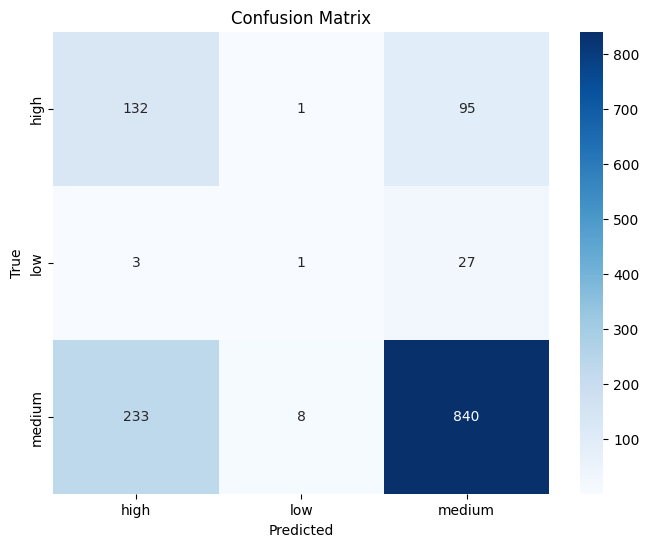

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


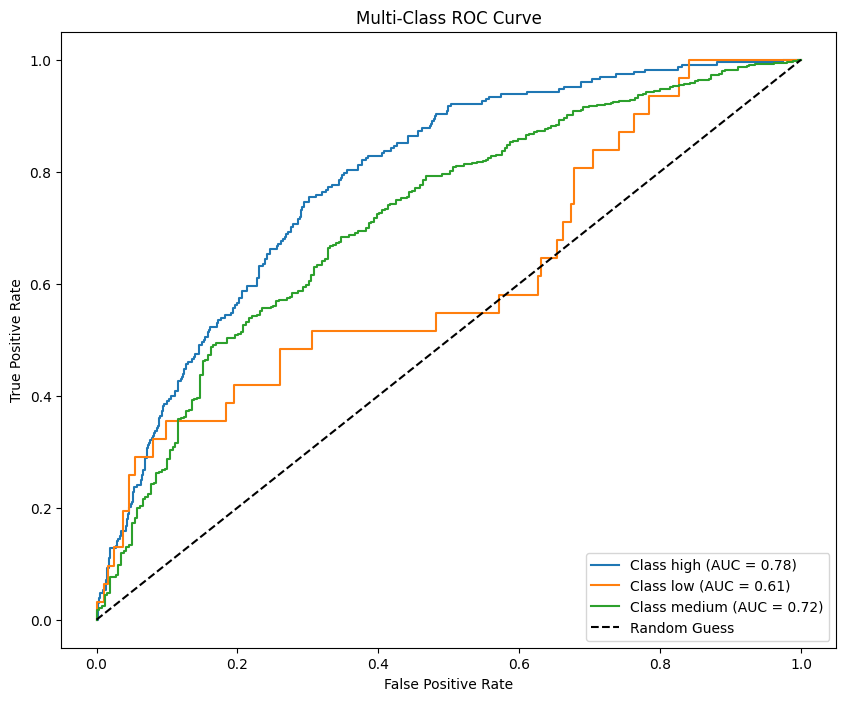

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test_cat, y_test_cat, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate predictions
y_pred_cat = np.argmax(model.predict(X_test_cat), axis=1)

print("\nClassification Report:")
print(classification_report(y_test_cat, y_pred_cat, target_names=categories, zero_division=0))

# Confusion Matrix
cm = confusion_matrix(y_test_cat, y_pred_cat)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve (One-vs-Rest)
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the test labels for multi-class ROC
y_test_binarized = label_binarize(y_test_cat, classes=np.arange(len(categories)))
y_pred_proba = model.predict(X_test_cat)

# Compute ROC curve and ROC area for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(categories)):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(categories)):
    plt.plot(fpr[i], tpr[i], label=f'Class {categories[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc='lower right')
plt.show()
#Alan Lei 11/24


### Model 3

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, SGD

# Build the model
model = Sequential([

    Dense(512, activation='tanh'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(128, activation='tanh'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(32, activation='tanh'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(16, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(len(categories), activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer=SGD(learning_rate=0.00055), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train, y_train_cat,  # Use the original unbalanced dataset
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,  # Apply the class weights here
    callbacks=[early_stopping],
    verbose=2
)

#Alan Lei 11/24


Epoch 1/100
168/168 - 12s - 73ms/step - accuracy: 0.3010 - loss: 3.0116 - val_accuracy: 0.3993 - val_loss: 1.0991
Epoch 2/100
168/168 - 1s - 8ms/step - accuracy: 0.3255 - loss: 2.7657 - val_accuracy: 0.3590 - val_loss: 1.1242
Epoch 3/100
168/168 - 1s - 4ms/step - accuracy: 0.3436 - loss: 2.6050 - val_accuracy: 0.4007 - val_loss: 1.0862
Epoch 4/100
168/168 - 1s - 4ms/step - accuracy: 0.3529 - loss: 2.6136 - val_accuracy: 0.4201 - val_loss: 1.0493
Epoch 5/100
168/168 - 1s - 4ms/step - accuracy: 0.3667 - loss: 2.4453 - val_accuracy: 0.4112 - val_loss: 1.0443
Epoch 6/100
168/168 - 1s - 4ms/step - accuracy: 0.3914 - loss: 2.3501 - val_accuracy: 0.4463 - val_loss: 1.0182
Epoch 7/100
168/168 - 1s - 6ms/step - accuracy: 0.3929 - loss: 2.3283 - val_accuracy: 0.4649 - val_loss: 0.9866
Epoch 8/100
168/168 - 1s - 3ms/step - accuracy: 0.4057 - loss: 2.1677 - val_accuracy: 0.4828 - val_loss: 0.9847
Epoch 9/100
168/168 - 1s - 4ms/step - accuracy: 0.4220 - loss: 2.2087 - val_accuracy: 0.5291 - val_los

Test Accuracy: 0.6537
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

Classification Report:
              precision    recall  f1-score   support

        high       0.32      0.84      0.46       228
         low       0.00      0.00      0.00        31
      medium       0.92      0.63      0.75      1081

    accuracy                           0.65      1340
   macro avg       0.41      0.49      0.41      1340
weighted avg       0.80      0.65      0.68      1340



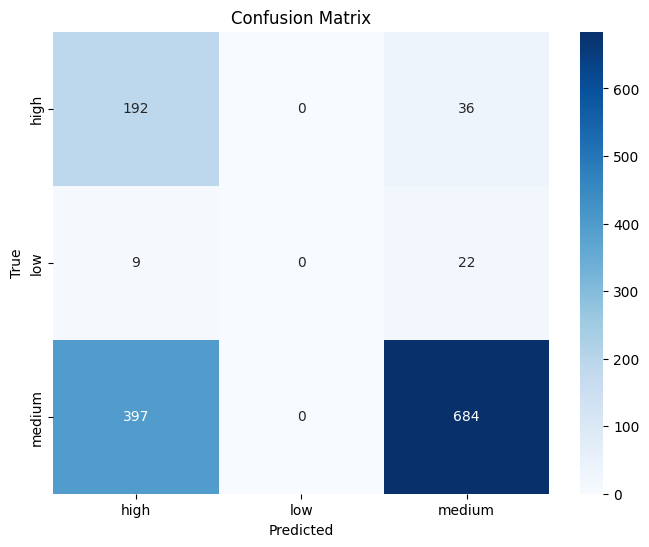

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


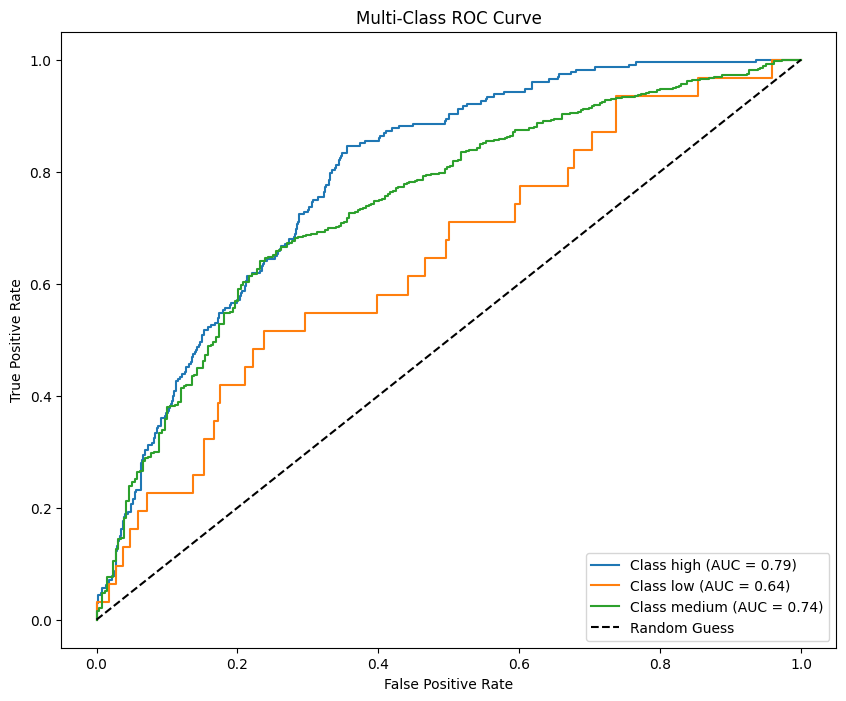

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test_cat, y_test_cat, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate predictions
y_pred_cat = np.argmax(model.predict(X_test_cat), axis=1)

print("\nClassification Report:")
print(classification_report(y_test_cat, y_pred_cat, target_names=categories, zero_division=0))

# Confusion Matrix
cm = confusion_matrix(y_test_cat, y_pred_cat)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve (One-vs-Rest)
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the test labels for multi-class ROC
y_test_binarized = label_binarize(y_test_cat, classes=np.arange(len(categories)))
y_pred_proba = model.predict(X_test_cat)

# Compute ROC curve and ROC area for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(categories)):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(categories)):
    plt.plot(fpr[i], tpr[i], label=f'Class {categories[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc='lower right')
plt.show()
#Alan Lei 11/24


### Model 4

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, SGD

# Build the model
model = Sequential([

    Dense(512, activation='tanh'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(256, activation='sigmoid'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(64, activation='tanh'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(32, activation='sigmoid'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(16, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(len(categories), activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer=SGD(learning_rate=0.00055), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train, y_train_cat,  # Use the original unbalanced dataset
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,  # Apply the class weights here
    callbacks=[early_stopping],
    verbose=2
)

#Alan Lei 11/24


Epoch 1/100
168/168 - 12s - 70ms/step - accuracy: 0.2777 - loss: 2.8167 - val_accuracy: 0.7642 - val_loss: 0.9217
Epoch 2/100
168/168 - 1s - 3ms/step - accuracy: 0.3085 - loss: 2.6733 - val_accuracy: 0.6388 - val_loss: 0.9241
Epoch 3/100
168/168 - 0s - 3ms/step - accuracy: 0.3261 - loss: 2.4613 - val_accuracy: 0.5022 - val_loss: 0.9797
Epoch 4/100
168/168 - 0s - 3ms/step - accuracy: 0.3354 - loss: 2.3653 - val_accuracy: 0.5224 - val_loss: 0.9419
Epoch 5/100
168/168 - 0s - 3ms/step - accuracy: 0.3376 - loss: 2.3637 - val_accuracy: 0.5045 - val_loss: 0.9564
Epoch 6/100
168/168 - 1s - 4ms/step - accuracy: 0.3568 - loss: 2.2989 - val_accuracy: 0.5134 - val_loss: 0.9270
Epoch 7/100
168/168 - 1s - 3ms/step - accuracy: 0.3903 - loss: 2.1903 - val_accuracy: 0.5306 - val_loss: 0.9007
Epoch 8/100
168/168 - 1s - 4ms/step - accuracy: 0.3908 - loss: 2.1441 - val_accuracy: 0.5366 - val_loss: 0.8962
Epoch 9/100
168/168 - 1s - 4ms/step - accuracy: 0.3856 - loss: 2.1323 - val_accuracy: 0.5246 - val_los

Test Accuracy: 0.5552
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

Classification Report:
              precision    recall  f1-score   support

        high       0.27      0.90      0.42       228
         low       0.00      0.00      0.00        31
      medium       0.93      0.50      0.65      1081

    accuracy                           0.56      1340
   macro avg       0.40      0.47      0.36      1340
weighted avg       0.80      0.56      0.60      1340



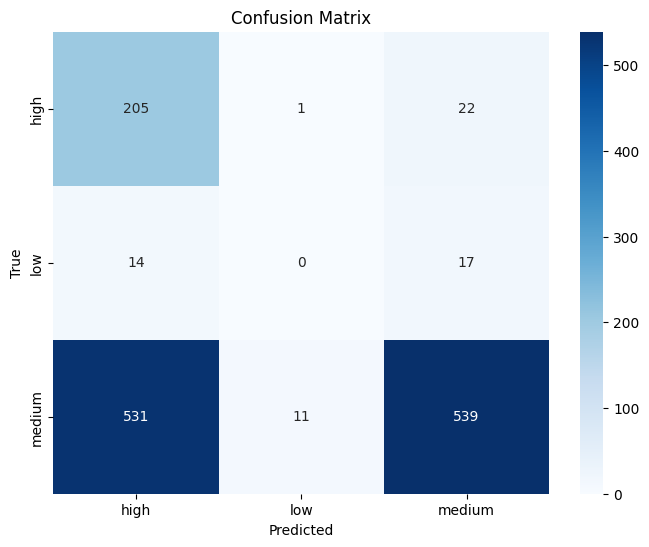

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


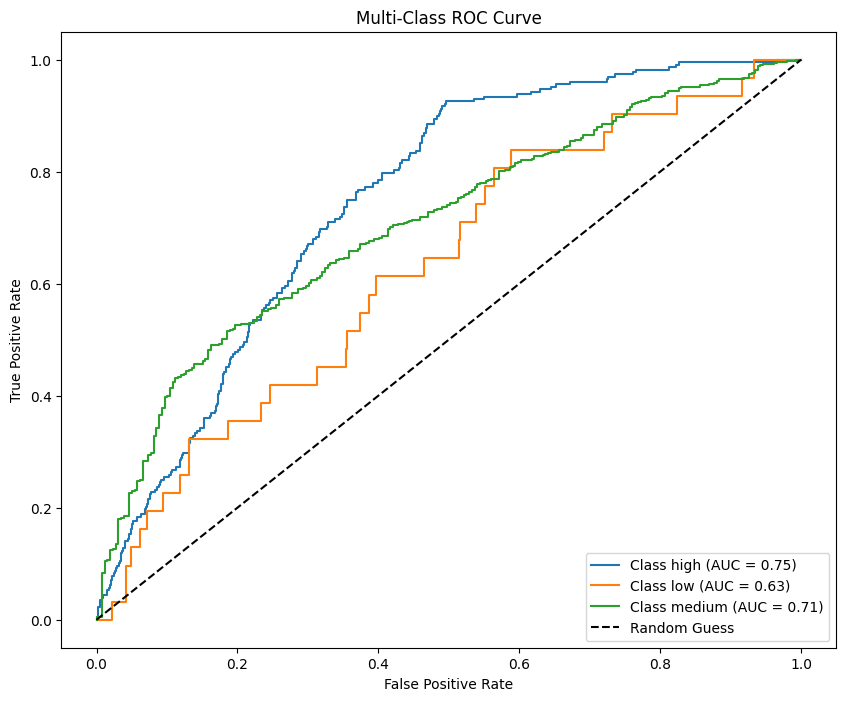

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test_cat, y_test_cat, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate predictions
y_pred_cat = np.argmax(model.predict(X_test_cat), axis=1)

print("\nClassification Report:")
print(classification_report(y_test_cat, y_pred_cat, target_names=categories, zero_division=0))

# Confusion Matrix
cm = confusion_matrix(y_test_cat, y_pred_cat)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve (One-vs-Rest)
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the test labels for multi-class ROC
y_test_binarized = label_binarize(y_test_cat, classes=np.arange(len(categories)))
y_pred_proba = model.predict(X_test_cat)

# Compute ROC curve and ROC area for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(categories)):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(categories)):
    plt.plot(fpr[i], tpr[i], label=f'Class {categories[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc='lower right')
plt.show()
#Alan Lei 11/24


## Our Best Models

#### (FCNN) Model 4 Using Hyperparameters from Tuning

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the number of input features
input_shape = X_train.shape[1]

# Initialize the model with an Input layer
model = Sequential()
model.add(Input(shape=(input_shape,)))
model.add(BatchNormalization())

# First hidden layer
model.add(Dense(384, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))

# Second hidden layer
model.add(Dense(64, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Third hidden layer
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))

# Output layer for regression
model.add(Dense(1))

# Compile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback with patience for overfitting control and best weights restoration
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("Tyler_fnn_model_using_tunedHyperparameters.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
# Tyler Burguillos 11/13/2024


Epoch 1/1000

Epoch 1: val_loss improved from inf to 3.38392, saving model to Tyler_fnn_model_using_tunedHyperparameters.keras
168/168 - 4s - 25ms/step - loss: 18.9971 - root_mean_squared_error: 4.3586 - val_loss: 3.3839 - val_root_mean_squared_error: 1.8395
Epoch 2/1000

Epoch 2: val_loss improved from 3.38392 to 0.91140, saving model to Tyler_fnn_model_using_tunedHyperparameters.keras
168/168 - 3s - 17ms/step - loss: 3.2666 - root_mean_squared_error: 1.8074 - val_loss: 0.9114 - val_root_mean_squared_error: 0.9547
Epoch 3/1000

Epoch 3: val_loss improved from 0.91140 to 0.66273, saving model to Tyler_fnn_model_using_tunedHyperparameters.keras
168/168 - 2s - 9ms/step - loss: 2.6212 - root_mean_squared_error: 1.6190 - val_loss: 0.6627 - val_root_mean_squared_error: 0.8141
Epoch 4/1000

Epoch 4: val_loss improved from 0.66273 to 0.62055, saving model to Tyler_fnn_model_using_tunedHyperparameters.keras
168/168 - 2s - 13ms/step - loss: 2.1765 - root_mean_squared_error: 1.4753 - val_loss: 0

Test RMSE: 0.10974617302417755


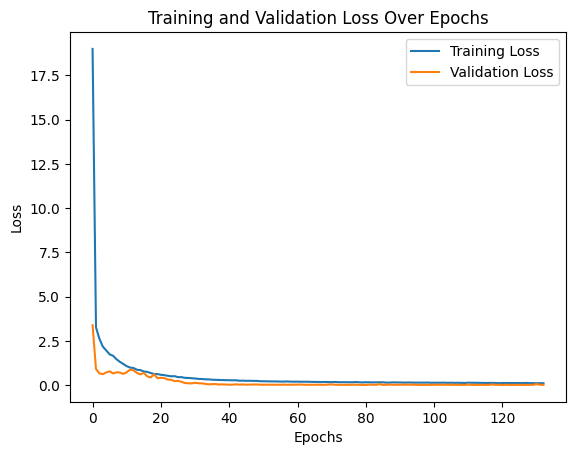

In [ ]:
# Evaluate the model
results = model.evaluate(X_test, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()
# Tyler Burguillos 11/13/2024


42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
FCNN Model - RMSE: 0.1097, R²: 0.9829, MAPE: 0.8905%


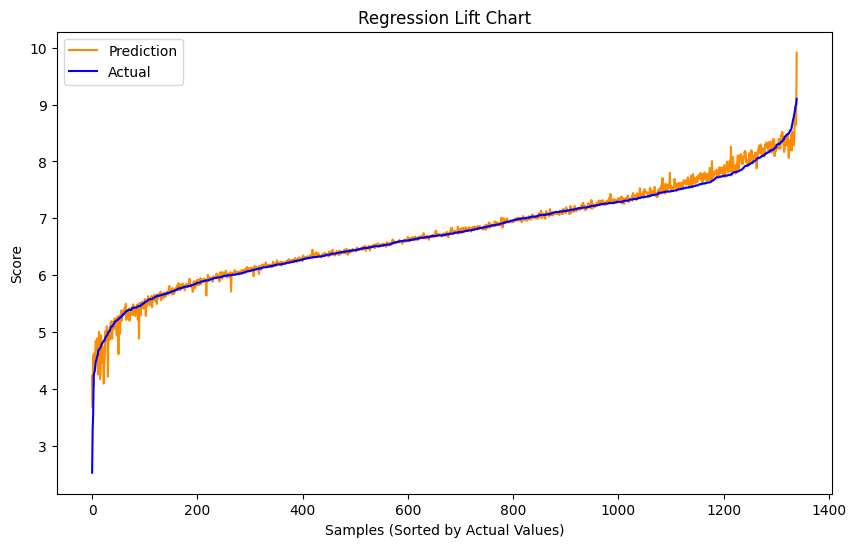

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

y_pred, rmse, r2, mape = evaluate_model(model, X_test, y_test)
print(f"FCNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

chart_regression(y_pred, y_test)
# Tyler Burguillos 11/13/2024


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test, titles_train, titles_test = train_test_split(
    X, y, titles, test_size=0.2, random_state=42, shuffle=True
)

results_df = pd.DataFrame({
    'Title': titles_test[:5].values,
    'Predicted Score': y_pred[:5].flatten(),
    'Actual Score': y_test[:5].flatten()
})

results_df
# Tyler Burguillos 11/13/2024


,Title,Predicted Score,Actual Score
0,Honoo no Alpenrose: Judy & Randy,6.669226,6.69
1,Akuma-kun,6.748363,6.73
2,Kujibiki Unbalance,6.132574,6.08
3,Meikyuu Black Company,7.307026,7.26
4,Aoharu x Kikanjuu,7.179444,7.16


### (CNN) Model 4

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

# Define the number of input features and reshape for Conv1D
input_shape = X_train_cnn.shape[1:]

# Initialize the model with an Input layer
model = Sequential([
    Input(shape=input_shape),

    Conv1D(filters=128, kernel_size=5, activation='sigmoid'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),

    Conv1D(filters=64, kernel_size=3, activation='relu'),
    BatchNormalization(),
    MaxPooling1D(pool_size=2),
    Dropout(0.2),

    Conv1D(filters=32, kernel_size=3, activation='sigmoid'),
    BatchNormalization(),

    # Flatten the output to connect to the Dense layers
    Flatten(),

    # Dense layers for regression
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dense(32, activation='sigmoid'),

    # Output layer for regression
    Dense(1)
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.00001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# checkpoint and early stopping
checkpoint = ModelCheckpoint("AustinNolte_cnn_model_4_AdamSigmoid.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_train_cnn, y_train,
    validation_data=(X_test_cnn, y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping,checkpoint],
    verbose=1
)
# Austin Nolte 11/21

Epoch 1/1000
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 48.7328 - root_mean_squared_error: 6.9809
Epoch 1: val_loss improved from inf to 43.09839, saving model to AustinNolte_cnn_model_4_AdamSigmoid.keras
168/168 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - loss: 48.7330 - root_mean_squared_error: 6.9809 - val_loss: 43.0984 - val_root_mean_squared_error: 6.5649
Epoch 2/1000
157/168 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 48.4872 - root_mean_squared_error: 6.9632
Epoch 2: val_loss did not improve from 43.09839
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 48.4708 - root_mean_squared_error: 6.9621 - val_loss: 44.7276 - val_root_mean_squared_error: 6.6879
Epoch 3/1000
160/168 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 47.9013 - root_mean_squared_error: 6.9211
Epoch 3: val_loss did not improve from 43.09839
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 47.8910 - root_mean_squared_error: 6.9203 - val_loss: 45.5182 - val_root_mean_squared_error: 6.7467
Epoch 4/1000
159/168 ━━━━━━━━━━━━━━

Test RMSE: 0.22788342833518982


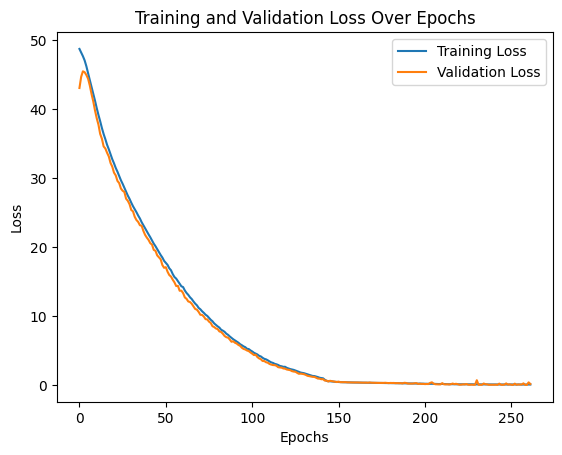

In [ ]:
# Evaluate the model
results = model.evaluate(X_test_cnn, y_test, verbose=0)
print("Test RMSE:", results[1])  # RMSE is the second value in the results tuple due to the metric in `compile`

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.show()

# Austin Nolte 11/21

42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
CNN Model - RMSE: 0.2279, R²: 0.9263, MAPE: 2.2175%


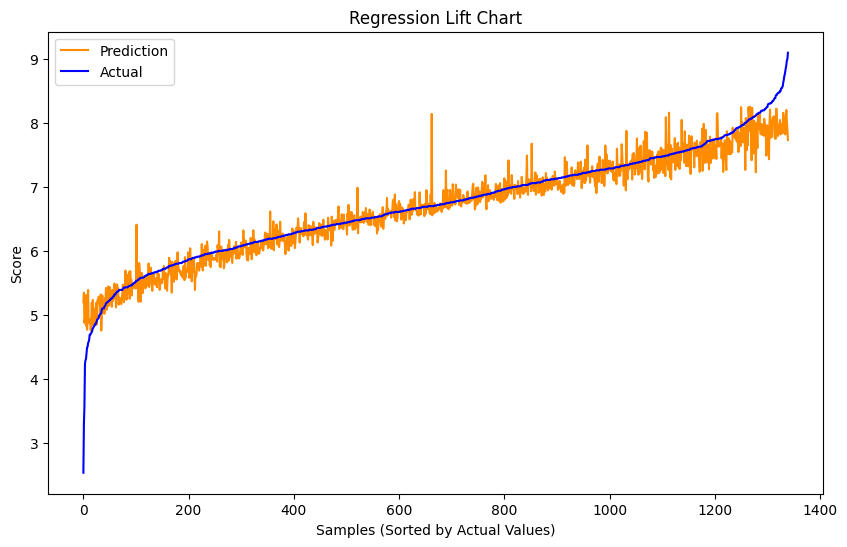

In [ ]:
# Function to generate and display regression lift chart
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run evaluation and plot results
y_pred, rmse, r2, mape = evaluate_model(model, X_test_cnn, y_test)
print(f"CNN Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

# Austin Nolte 11/21

### (Hybrid) Model 1 Using Hypertuned Parameters

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ CNN_Input (InputLayer)    │ (None, 389, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_21 (Conv1D)        │ (None, 387, 32)        │            128 │ CNN_Input[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ FCNN_Input (InputLayer)   │ (None, 389)            │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_56    │ (None, 387, 32)        │            128 │ conv1d_21[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_59    │ (None, 389)            │          1,556 │ FCNN_Input[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_14          │ (None, 129, 32)        │              0 │ batch_normalization_5… │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_35 (Dense)          │ (None, 192)            │         74,880 │ batch_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_22 (Conv1D)        │ (None, 127, 64)        │          6,208 │ max_pooling1d_14[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_60    │ (None, 192)            │            768 │ dense_35[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_57    │ (None, 127, 64)        │            256 │ conv1d_22[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_43 (Dropout)      │ (None, 192)            │              0 │ batch_normalization_6… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_15          │ (None, 63, 64)         │              0 │ batch_normalization_5… │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_36 (Dense)          │ (None, 192)            │         37,056 │ dropout_43[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_42 (Dropout)      │ (None, 63, 64)         │              0 │ max_pooling1d_15[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_61    │ (None, 192)            │            768 │ dense_36[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_23 (Conv1D)        │ (None, 59, 32)         │         10,272 │ dropout_42[0][0]       │
├──────────────────────

 Total params: 610,245 (2.33 MB)

 Trainable params: 607,931 (2.32 MB)

 Non-trainable params: 2,314 (9.04 KB)

None


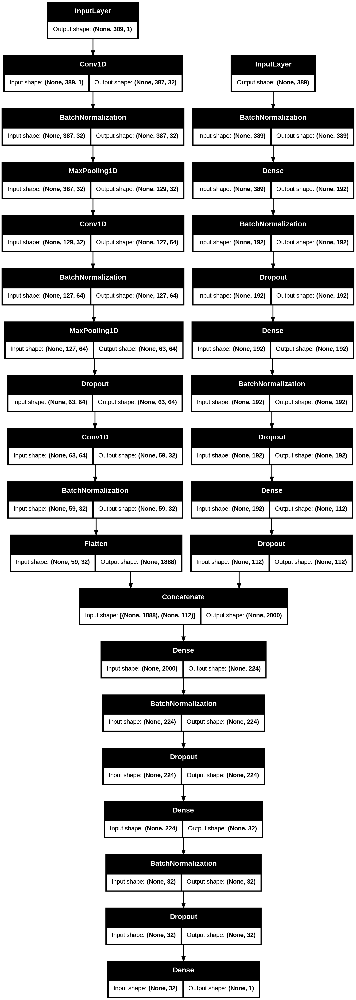

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout, BatchNormalization, MaxPooling1D, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import plot_model

# Define input shapes for both CNN and FCNN branches
cnn_input_shape = X_train_cnn.shape[1:]
fcnn_input_shape = X_train.shape[1]

# CNN branch
cnn_input = Input(shape=cnn_input_shape, name='CNN_Input')
x = Conv1D(filters=32, kernel_size=3, activation='relu')(cnn_input)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=3)(x)

x = Conv1D(filters=64, kernel_size=3, activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=2)(x)
x = Dropout(0.4)(x)

x = Conv1D(filters=32, kernel_size=5, activation='relu')(x)
x = BatchNormalization()(x)

x = Flatten()(x)

# FCNN branch
fcnn_input = Input(shape=(fcnn_input_shape,), name='FCNN_Input')
y = BatchNormalization()(fcnn_input)

y = Dense(192, activation='relu')(y)
y = BatchNormalization()(y)
y = Dropout(0.30000000000000004)(y)

y = Dense(192, activation='relu')(y)
y = BatchNormalization()(y)
y = Dropout(0.1)(y)

y = Dense(112, activation='relu')(y)
y = Dropout(0.5)(y)

# Concatenate the CNN and FCNN outputs
combined = Concatenate()([x, y])

# Final dense layers for regression
z = Dense(224, activation='relu')(combined)
z = BatchNormalization()(z)
z = Dropout(0.1)(z)

z = Dense(32, activation='relu')(z)
z = BatchNormalization()(z)
z = Dropout(0.30000000000000004)(z)

# Output layer for regression
output = Dense(1, name='Output')(z)

# Define the model
hybrid_model = Model(inputs=[cnn_input, fcnn_input], outputs=output)
print(hybrid_model.summary())
plot_model(hybrid_model, show_shapes=True)
#Tyler Burguillos 11/24

In [ ]:
# Compile the model
hybrid_model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Saving the best model weights with checkpointing
checkpoint = ModelCheckpoint("hybrid_model_1.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the model
history = hybrid_model.fit(
    [X_train_cnn, X_train],
    y_train,
    validation_data=([X_test_cnn, X_test], y_test),
    epochs=1000,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=2
)
#Tyler Burguillos 11/24


Epoch 1/1000

Epoch 1: val_loss improved from inf to 21.03994, saving model to hybrid_model_1.keras
168/168 - 21s - 123ms/step - loss: 38.4384 - root_mean_squared_error: 6.1999 - val_loss: 21.0399 - val_root_mean_squared_error: 4.5869
Epoch 2/1000

Epoch 2: val_loss improved from 21.03994 to 3.72348, saving model to hybrid_model_1.keras
168/168 - 1s - 6ms/step - loss: 16.8313 - root_mean_squared_error: 4.1026 - val_loss: 3.7235 - val_root_mean_squared_error: 1.9296
Epoch 3/1000

Epoch 3: val_loss improved from 3.72348 to 0.83920, saving model to hybrid_model_1.keras
168/168 - 1s - 5ms/step - loss: 4.7584 - root_mean_squared_error: 2.1814 - val_loss: 0.8392 - val_root_mean_squared_error: 0.9161
Epoch 4/1000

Epoch 4: val_loss improved from 0.83920 to 0.39793, saving model to hybrid_model_1.keras
168/168 - 1s - 6ms/step - loss: 3.0928 - root_mean_squared_error: 1.7586 - val_loss: 0.3979 - val_root_mean_squared_error: 0.6308
Epoch 5/1000

Epoch 5: val_loss improved from 0.39793 to 0.24134

42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step
Hybrid Model - RMSE: 0.0946, R²: 0.9873, MAPE: 0.6512%


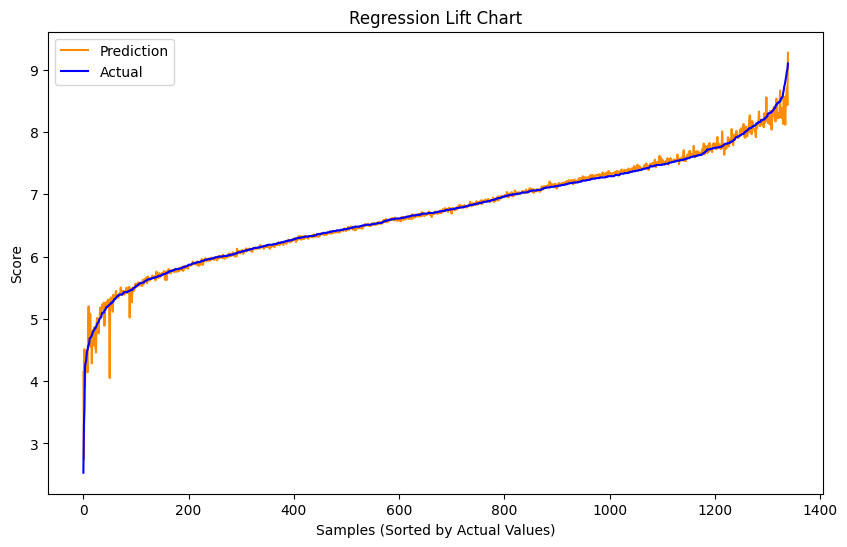

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

# Function to generate and display the regression lift chart
def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.figure(figsize=(10, 6))
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    plt.ylabel('Score')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

# Evaluation function for RMSE, R², and MAPE
def evaluate_model(model, X_test_cnn, X_test, y_test):
    y_pred = model.predict([X_test_cnn, X_test])
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    return y_pred, rmse, r2, mape

# Run the evaluation on the hybrid model and plot results
y_pred, rmse, r2, mape = evaluate_model(hybrid_model, X_test_cnn, X_test, y_test)
print(f"Hybrid Model - RMSE: {rmse:.4f}, R²: {r2:.4f}, MAPE: {mape:.4%}")

# Plot regression lift chart
chart_regression(y_pred, y_test)

#Tyler Burguillos 11/24


In [ ]:
from sklearn.model_selection import train_test_split

titles_train, titles_test = train_test_split(
    titles, test_size=0.2, random_state=42, shuffle=True
)

results_df = pd.DataFrame({
    'Title': titles_test[:5].values,
    'Predicted Score': y_pred[:5].flatten(),
    'Actual Score': y_test[:5].flatten()
})

results_df
#Tyler Burguillos 11/24


,Title,Predicted Score,Actual Score
0,Honoo no Alpenrose: Judy & Randy,6.676205,6.69
1,Akuma-kun,6.715484,6.73
2,Kujibiki Unbalance,6.087149,6.08
3,Meikyuu Black Company,7.307475,7.26
4,Aoharu x Kikanjuu,7.211466,7.16


### (Categorical) Model 2

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

# Build the model
model = Sequential([

    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),

    Dense(len(categories), activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(
    X_train, y_train_cat,  # Use the original unbalanced dataset
    validation_data=(X_test, y_test_cat),
    epochs=100,
    batch_size=32,
    class_weight=class_weights,  # Apply the class weights here
    callbacks=[early_stopping],
    verbose=2
)
# Tyler Burguillos 11/17/2024

Epoch 1/100
168/168 - 5s - 27ms/step - accuracy: 0.4517 - loss: 2.4478 - val_accuracy: 0.5410 - val_loss: 1.0404
Epoch 2/100
168/168 - 2s - 12ms/step - accuracy: 0.6012 - loss: 1.5492 - val_accuracy: 0.6664 - val_loss: 0.7725
Epoch 3/100
168/168 - 1s - 7ms/step - accuracy: 0.6579 - loss: 1.2885 - val_accuracy: 0.6851 - val_loss: 0.6881
Epoch 4/100
168/168 - 1s - 8ms/step - accuracy: 0.6934 - loss: 1.1345 - val_accuracy: 0.6940 - val_loss: 0.6642
Epoch 5/100
168/168 - 1s - 8ms/step - accuracy: 0.7288 - loss: 1.0166 - val_accuracy: 0.7142 - val_loss: 0.6416
Epoch 6/100
168/168 - 3s - 18ms/step - accuracy: 0.7516 - loss: 0.9269 - val_accuracy: 0.7015 - val_loss: 0.6915
Epoch 7/100
168/168 - 3s - 17ms/step - accuracy: 0.7561 - loss: 0.9224 - val_accuracy: 0.7269 - val_loss: 0.6121
Epoch 8/100
168/168 - 2s - 10ms/step - accuracy: 0.7723 - loss: 0.8515 - val_accuracy: 0.7448 - val_loss: 0.5916
Epoch 9/100
168/168 - 1s - 7ms/step - accuracy: 0.7900 - loss: 0.8000 - val_accuracy: 0.7351 - val_

Test Accuracy: 0.7448
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

Classification Report:
              precision    recall  f1-score   support

        high       0.40      0.62      0.49       228
         low       0.11      0.06      0.08        31
      medium       0.88      0.79      0.83      1081

    accuracy                           0.74      1340
   macro avg       0.46      0.49      0.47      1340
weighted avg       0.78      0.74      0.76      1340



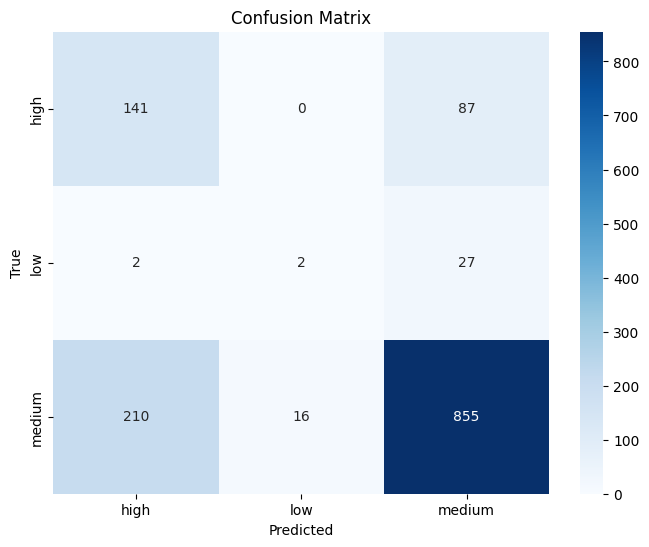

42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


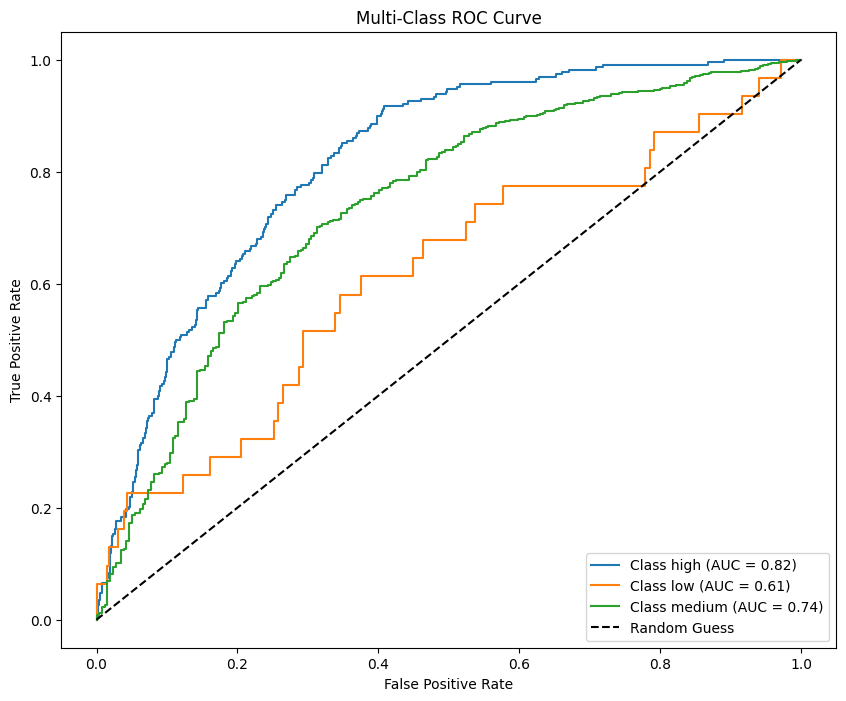

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test_cat, y_test_cat, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate predictions
y_pred_cat = np.argmax(model.predict(X_test_cat), axis=1)

print("\nClassification Report:")
print(classification_report(y_test_cat, y_pred_cat, target_names=categories, zero_division=0))

# Confusion Matrix
cm = confusion_matrix(y_test_cat, y_pred_cat)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve (One-vs-Rest)
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the test labels for multi-class ROC
y_test_binarized = label_binarize(y_test_cat, classes=np.arange(len(categories)))
y_pred_proba = model.predict(X_test_cat)

# Compute ROC curve and ROC area for each class
fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(categories)):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(categories)):
    plt.plot(fpr[i], tpr[i], label=f'Class {categories[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc='lower right')
plt.show()
# Tyler Burguillos 11/17/2024
